# Talking Data User Demographics ML Self Case Study

## 1. Business Problem

### 1.1. Problem Overview

Nothing is more comforting than being greeted by your favorite drink just as you walk through the door of the corner café. While a thoughtful barista knows you take a macchiato every Wednesday morning at 8:15, it’s much more difficult in a digital space for your preferred brands to personalize your experience.

TalkingData, China’s largest third-party mobile data platform, understands that everyday choices and behaviors paint a picture of who we are and what we value. Currently, TalkingData is seeking to leverage behavioral data from more than 70% of the 500 million mobile devices active daily in China to help its clients better understand and interact with their audiences.

In this competition, Kagglers are challenged to build a model predicting users’ demographic characteristics based on their app usage, geolocation, and mobile device properties. Doing so will help millions of developers and brand advertisers around the world pursue data-driven marketing efforts which are relevant to their users and catered to their preferences.

**Source:**https://www.kaggle.com/c/talkingdata-mobile-user-demographics/overview

### 1.2. Real-world/Business objectives and constraints

* No low-latency requirement.
* Probability of a data-point belonging to each class is needed.

## 2. Machine Learning Problem Formulation

### 2.1. Data Overview

The Data is collected from TalkingData SDK integrated within mobile apps TalkingData serves under the service term between TalkingData and mobile app developers. 

**Source:** https://www.kaggle.com/c/talkingdata-mobile-user-demographics/data

1. **gender_age_train.csv, gender_age_test.csv** - the training and test set
     group: this is the target variable we are going to predict
2. **events.csv, app_events.csv** - when a user uses TalkingData SDK, the event gets logged in this data. Each event has an event id, location (lat/long), and the event corresponds to a list of apps in app_events.
    timestamp: when the user is using an app with TalkingData SDK
3. **app_labels.csv** - apps and their labels, the label_id's can be used to join with label_categories
4. **label_categories.csv** - apps' labels and their categories in text
5. **phone_brand_device_model.csv** - device ids, brand, and models
    phone_brand: note that the brands are in Chinese (translation courtesy of user fromandto) 
    
     * 三星 samsung

     * 天语 Ktouch

     * 海信 hisense

     *  联想 lenovo

     * 欧比 obi

     * 爱派尔 ipair

     * 努比亚 nubia

     * 优米 youmi

     * 朵唯 dowe

     * 黑米 heymi

     * 锤子 hammer

     * 酷比魔方 koobee

     * 美图 meitu

     * 尼比鲁 nibilu

     * 一加 oneplus

     * 优购 yougo

     * 诺基亚 nokia

     * 糖葫芦 candy

     * 中国移动 ccmc

     * 语信 yuxin

     * 基伍 kiwu

     * 青橙 greeno

     * 华硕 asus

     * 夏新 panosonic

     * 维图 weitu

     * 艾优尼 aiyouni

     * 摩托罗拉 moto

     * 乡米 xiangmi

     * 米奇 micky

     * 大可乐 bigcola

     * 沃普丰 wpf

     * 神舟 hasse

     * 摩乐 mole

     * 飞秒 fs

     * 米歌 mige

     * 富可视 fks

     * 德赛 desci

     * 梦米 mengmi

     * 乐视 lshi

     * 小杨树 smallt

     * 纽曼 newman

     * 邦华 banghua

     * E派 epai

     * 易派 epai

     * 普耐尔 pner

     * 欧新 ouxin

     * 西米 ximi

     * 海尔 haier

     * 波导 bodao

     * 糯米 nuomi

     * 唯米 weimi

     * 酷珀 kupo

     * 谷歌 google

     * 昂达 ada

     * 聆韵 lingyun

### 2.2 Mapping Real-World Problem to Machine-Learning Problem

#### 2.2.1. Type of ML Problem 

1. It is a Multi-Class Classification Problem.
2. The 12 classes to predict are:
   * F23-
   * F24-26
   * F27-28
   * F29-32
   * F33-42
   * F43+
   * M22- 
   * M23-26  
   * M27-28 
   * M29-31 
   * M32-38 
   * M39+


#### 2.2.2. Performance Metric

**Source:** https://www.kaggle.com/c/talkingdata-mobile-user-demographics/overview/evaluation

1. Multi-class Log-loss
2. Confusion Matrix

#### 2.2.3. Machine Learing Objectives and Constraints

**Objective:** Predict the probability of each data-point belonging to each of the 12 classes.

**Constraints:**
* Class probabilities are needed.
* No Latency constraints.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import os
import re
import time
from sklearn.metrics import confusion_matrix
from sklearn.metrics.classification import log_loss
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter
from scipy.sparse import hstack
from scipy.sparse import csr_matrix
import warnings
warnings.filterwarnings("ignore")
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import GridSearchCV
from sklearn.calibration import CalibratedClassifierCV
from tqdm import tqdm
import joblib
from sklearn.externals import joblib as jobl
from joblib import dump
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, BatchNormalization,Input,PReLU
from keras.utils import np_utils
from keras.optimizers import Adam
from keras.models import Model
from keras.optimizers import Adagrad
import datetime
from keras.models import load_model
from IPython.display import Image
from keras.callbacks import EarlyStopping,TensorBoard

Using TensorFlow backend.


## 3. Exploratory Data Analysis

### 3.1. Gender Age Data

In [2]:
gender_age_data_train = pd.read_csv('Datasets/gender_age_train.csv')

In [3]:
gender_age_data_train.shape

(74645, 4)

In [4]:
gender_age_data_train.head()

,device_id,gender,age,group
0,-8076087639492063270,M,35,M32-38
1,-2897161552818060146,M,35,M32-38
2,-8260683887967679142,M,35,M32-38
3,-4938849341048082022,M,30,M29-31
4,245133531816851882,M,30,M29-31


In [5]:
#Age group Count
gender_age_data_train['group'].value_counts()

M23-26    9605
M32-38    9476
M39+      8581
M22-      7488
M29-31    7309
F33-42    5561
M27-28    5445
F23-      5050
F29-32    4628
F43+      4194
F24-26    4190
F27-28    3118
Name: group, dtype: int64

#### 3.1.1. Bar Plot for Group Counts

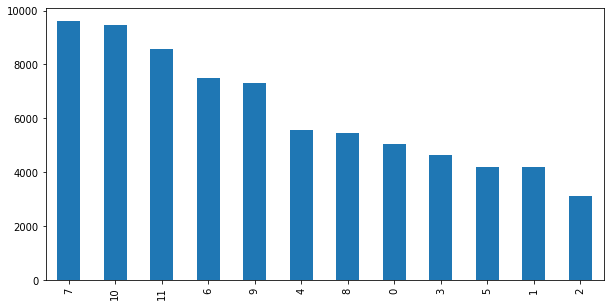

In [178]:
plt.figure(figsize=(10,5))
gender_age_data_train['group'].value_counts().plot(kind='bar')

#### Observation
Here we can conclude that the dataset is imbalanced between male and female. There are more number of males than females

In [7]:
#Encoding brands with numeric Label for confusion matrix
group_encoder = LabelEncoder().fit(gender_age_data_train['group'])
gender_age_data_train['group'] = group_encoder.transform(gender_age_data_train['group'])

In [8]:
gender_age_data_train.head()

,device_id,gender,age,group
0,-8076087639492063270,M,35,10
1,-2897161552818060146,M,35,10
2,-8260683887967679142,M,35,10
3,-4938849341048082022,M,30,9
4,245133531816851882,M,30,9


####  3.1.2. Check For Gender Imbalance

In [9]:
gender_count = gender_age_data_train['gender'].value_counts()

In [10]:
gender_count

M    47904
F    26741
Name: gender, dtype: int64

In [11]:
male_percent = gender_count[1]/gender_age_data_train.shape[0]*100
female_percent = gender_count[0]/gender_age_data_train.shape[0]*100

In [12]:
print("Percent of male",male_percent)
print("Percent of Female",female_percent)

Percent of male 35.824234710965236
Percent of Female 64.17576528903477


##### Pie Plot

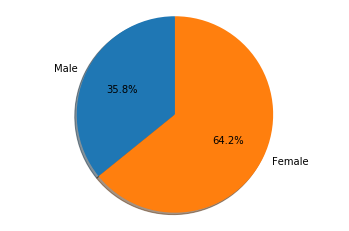

In [13]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = 'Male', 'Female'
sizes = [male_percent, female_percent]
explode = (0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

##### DistPlot

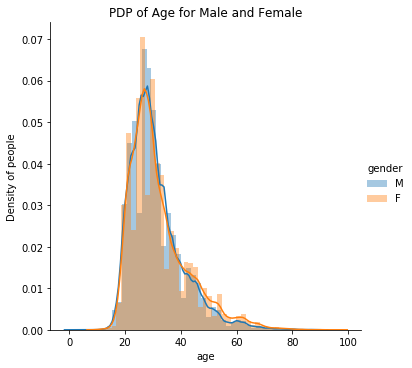

In [14]:
sns.FacetGrid(gender_age_data_train, hue = 'gender', height = 5)\
    .map(sns.distplot, 'age')\
    .add_legend()
plt.ylabel("Density of people")
plt.title("PDP of Age for Male and Female")
plt.show()

#### Observation
1. There is a overlap in the Number of Male and Female in the age group of 15 to 40
2. The Number of Female is slightly more than Male in the age group from 42 to 65

##### Percentile

In [21]:
male_data = gender_age_data_train[gender_age_data_train['gender']=='M']
female_data = gender_age_data_train[gender_age_data_train['gender']=='F']

In [22]:
male_data.shape

(47904, 4)

In [23]:
female_data.shape

(26741, 4)

In [24]:
female_data.head()

,device_id,gender,age,group
5,-1297074871525174196,F,24,1
9,1596610250680140042,F,36,4
11,7477216237379271436,F,37,4
12,2478205222798310601,F,28,2
15,1508636020748379883,F,28,2


In [25]:
male_percentile = np.percentile(male_data['age'], [25,50,75,90])
female_percentile = np.percentile(female_data['age'],[25,50,75,90])

In [26]:
print(50*'*')
print("Male:")
print(50*'*')
print(male_data['age'].describe())
print("25th,50th,90th,100th percentile is",male_percentile)
print(50*'*')
print("Male:")
print(50*'*')
print(female_data['age'].describe())
print("25th,50th,90th,100th percentile is",female_percentile)

**************************************************
Male:
**************************************************
count    47904.000000
mean        31.052939
std          9.454653
min          1.000000
25%         25.000000
50%         29.000000
75%         35.000000
max         90.000000
Name: age, dtype: float64
25th,50th,90th,100th percentile is [25. 29. 35. 44.]
**************************************************
Male:
**************************************************
count    26741.000000
mean        32.050596
std         10.539967
min         10.000000
25%         25.000000
50%         29.000000
75%         37.000000
max         96.000000
Name: age, dtype: float64
25th,50th,90th,100th percentile is [25. 29. 37. 47.]


#### Observation:
1. The Number of Male is almost double the number of Female
2. The Mean, Median age is almost same for both Male and Female
3. 25 and 75 Percentile Age values for Both Male and Female are similar
4. In General Female users have more age than Male users in the Data

### 3.2. Phone Brand and Device Data

In [27]:
#Read the csv file
phone_brand_device_model_data = pd.read_csv('Datasets/phone_brand_device_model.csv')

In [28]:
phone_brand_device_model_data.head()

,device_id,phone_brand,device_model
0,-8890648629457979026,小米,红米
1,1277779817574759137,小米,MI 2
2,5137427614288105724,三星,Galaxy S4
3,3669464369358936369,SUGAR,时尚手机
4,-5019277647504317457,三星,Galaxy Note 2


In [29]:
#Check for unique brands
len(phone_brand_device_model_data.phone_brand.unique())

131

In [30]:
phone_brand_device_model_data.shape

(187245, 3)

#### 3.2.1. Check and Remove Duplicates

In [31]:
#https://thispointer.com/pandas-find-duplicate-rows-in-a-dataframe-based-on-all-or-selected-columns-using-dataframe-duplicated-in-python/
duplicate_devices = phone_brand_device_model_data[phone_brand_device_model_data.duplicated(['device_id'])]

In [32]:
duplicate_devices.shape

(529, 3)

In [33]:
#Dropping duplicates
phone_brand_device_model_data = phone_brand_device_model_data.drop_duplicates('device_id',keep='first')

In [34]:
phone_brand_device_model_data.shape

(186716, 3)

In [35]:
unique_before = phone_brand_device_model_data.phone_brand.unique()

In [36]:
gender_age_data_test = pd.read_csv('Datasets/gender_age_test.csv')

In [37]:
gender_age_data_test.shape

(112071, 1)

In [38]:
gender_age_data_test.head()

,device_id
0,1002079943728939269
1,-1547860181818787117
2,7374582448058474277
3,-6220210354783429585
4,-5893464122623104785


#### Observation
529 duplicate rows are there in phone device and model data set

#### 3.2.2. Phone Brand Naming Convention

In [39]:
chinese_english_brand_mapping = {
    "三星": "samsung",
    "天语": "Ktouch",
    "海信": "hisense",
    "联想": "lenovo",
    "欧比": "obi",
    "爱派尔": "ipair",
    "努比亚": "nubia",
    "优米": "youmi",
    "朵唯": "dowe",
    "黑米": "heymi",
    "锤子": "hammer",
    "酷比魔方": "koobee",
    "美图": "meitu",
    "尼比鲁": "nibilu",
    "一加": "oneplus",
    "优购": "yougo",
    "诺基亚": "nokia",
    "糖葫芦": "candy",
    "中国移动": "ccmc",
    "语信": "yuxin",
    "基伍": "kiwu",
    "青橙": "greeno",
    "华硕": "asus",
    "夏新": "panosonic",
    "维图": "weitu",
    "艾优尼": "aiyouni",
    "摩托罗拉": "moto",
    "乡米": "xiangmi",
    "米奇": "micky",
    "大可乐": "bigcola",
    "沃普丰": "wpf",
    "神舟": "hasse",
    "摩乐": "mole",
    "飞秒": "fs",
    "米歌": "mige",
    "富可视": "fks",
    "德赛": "desci",
    "梦米": "mengmi",
    "乐视": "lshi",
    "小杨树": "smallt",
    "纽曼": "newman",
    "邦华": "banghua",
    "E派": "epai",
    "易派": "epai",
    "普耐尔": "pner",
    "欧新": "ouxin",
    "西米": "ximi",
    "海尔": "haier",
    "波导": "bodao",
    "糯米": "nuomi",
    "唯米": "weimi",
    "酷珀": "kupo",
    "谷歌": "google",
    "昂达": "ada",
    "聆韵": "lingyun",
    "小米": "Xiaomi",
    "华为": "Huawei",
    "魅族": "Meizu",
    "中兴": "ZTE",
    "酷派": "Coolpad",
    "金立": "Gionee",
    "SUGAR": "SUGAR",
    "OPPO": "OPPO",
    "vivo": "vivo",
    "HTC": "HTC",
    "LG": "LG",
    "ZUK": "ZUK",
    "TCL": "TCL",
    "LOGO": "LOGO",
    "SUGAR": "SUGAR",
    "Lovme": "Lovme",
    "PPTV": "PPTV",
    "ZOYE": "ZOYE",
    "MIL": "MIL",
    "索尼" : "Sony",
    "欧博信" : "Opssom",
    "奇酷" : "Qiku",
    "酷比" : "CUBE",
    "康佳" : "Konka",
    "亿通" : "Yitong",
    "金星数码" : "JXD",
    "至尊宝" : "Monkey King",
    "百立丰" : "Hundred Li Feng",
    "贝尔丰" : "Bifer",
    "百加" : "Bacardi",
    "诺亚信" : "Noain",
    "广信" : "Kingsun",
    "世纪天元" : "Ctyon",
    "青葱" : "Cong",
    "果米" : "Taobao",
    "斐讯" : "Phicomm",
    "长虹" : "Changhong",
    "欧奇" : "Oukimobile",
    "先锋" : "XFPLAY",
    "台电" : "Teclast",
    "大Q" : "Daq",
    "蓝魔" : "Ramos",
    "奥克斯" : "AUX"
}

In [40]:
english_brands = map(lambda x: chinese_english_brand_mapping[x] if x in chinese_english_brand_mapping else x,phone_brand_device_model_data['phone_brand'])

In [41]:
phone_brand_device_model_data['phone_brand_english'] = list(english_brands)

In [42]:
phone_brand_device_model_data.shape

(186716, 4)

In [43]:
phone_brand_count = dict(phone_brand_device_model_data['phone_brand_english'].value_counts())

In [44]:
phone_brand_count

{'Xiaomi': 43107,
 'samsung': 34191,
 'Huawei': 32465,
 'vivo': 14342,
 'OPPO': 14239,
 'Meizu': 11816,
 'Coolpad': 8382,
 'lenovo': 6752,
 'Gionee': 2763,
 'HTC': 2675,
 'ZTE': 2092,
 'lshi': 1916,
 'Sony': 1818,
 'nubia': 1142,
 'LG': 761,
 'ccmc': 668,
 'TCL': 583,
 'dowe': 544,
 'hammer': 534,
 'youmi': 492,
 'hisense': 489,
 'oneplus': 437,
 'yuxin': 395,
 'Ktouch': 376,
 'Qiku': 376,
 'moto': 228,
 'CUBE': 165,
 'ZUK': 152,
 'koobee': 152,
 'meitu': 150,
 'asus': 141,
 'aiyouni': 109,
 'fks': 108,
 'mengmi': 105,
 'ipair': 100,
 'heymi': 86,
 'bodao': 83,
 'newman': 77,
 'mige': 74,
 'nokia': 69,
 'Yitong': 61,
 'epai': 61,
 'Opssom': 59,
 'Bifer': 59,
 'Hundred Li Feng': 59,
 'LOGO': 58,
 'Konka': 57,
 'nibilu': 57,
 'yougo': 52,
 'panosonic': 52,
 'kupo': 52,
 'haier': 49,
 'weitu': 42,
 'lingyun': 39,
 'greeno': 38,
 'banghua': 36,
 'Lovme': 32,
 'Monkey King': 31,
 'smallt': 29,
 'weimi': 28,
 'nuomi': 28,
 'Noain': 25,
 'ouxin': 25,
 'hasse': 24,
 'kiwu': 21,
 'bigcola': 20,

In [45]:
import itertools
top_brand_count = dict(itertools.islice(phone_brand_count.items(), 15))

In [46]:
#Top 15 Brand Counts
top_brand_count

{'Xiaomi': 43107,
 'samsung': 34191,
 'Huawei': 32465,
 'vivo': 14342,
 'OPPO': 14239,
 'Meizu': 11816,
 'Coolpad': 8382,
 'lenovo': 6752,
 'Gionee': 2763,
 'HTC': 2675,
 'ZTE': 2092,
 'lshi': 1916,
 'Sony': 1818,
 'nubia': 1142,
 'LG': 761}

#### 3.2.3. Bar plot for Brand Counts

<BarContainer object of 15 artists>

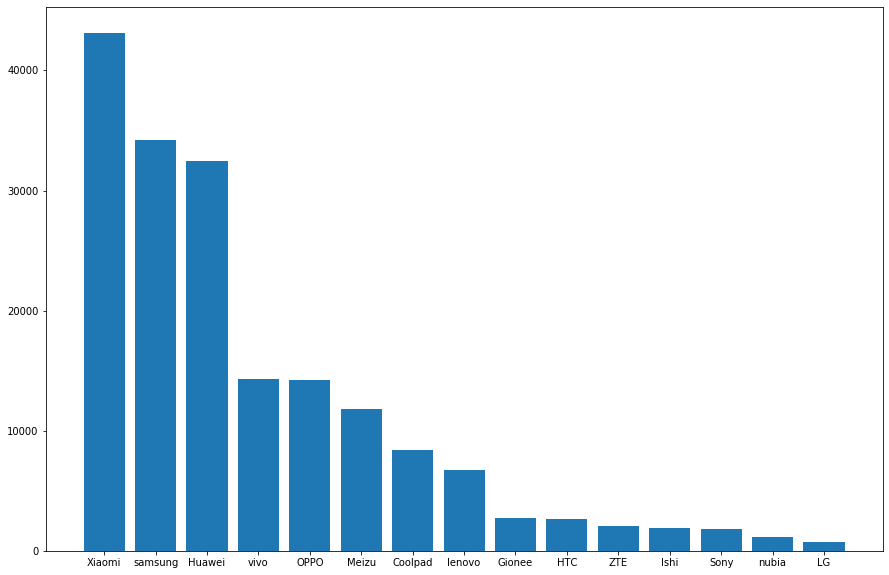

In [47]:
plt.figure(figsize=(15,10))
plt.bar(top_brand_count.keys(),top_brand_count.values())

#### Observation
Xiaomi and Samsung hold the highest percentage of devices used by the users

In [48]:
#Encoding brands with numeric Label
brand_encoder = LabelEncoder().fit(phone_brand_device_model_data['phone_brand'])
phone_brand_device_model_data['brand'] = brand_encoder.transform(phone_brand_device_model_data['phone_brand'])
nbrands=len(brand_encoder.classes_)#Will be used for one hot encoding

In [49]:
#Concatinating Phone Brand and Model and encoding with numeric label
concat_model = phone_brand_device_model_data['phone_brand'].str.cat(phone_brand_device_model_data['device_model'])
model_encoder=LabelEncoder().fit(concat_model)
phone_brand_device_model_data['model_brand']=model_encoder.transform(concat_model)
nmodels=len(model_encoder.classes_)#Will be used for one hot encoding

In [50]:
#Encoding models with numeric Label
model_encode=LabelEncoder().fit(phone_brand_device_model_data['device_model'])
phone_brand_device_model_data['model']=model_encode.transform(phone_brand_device_model_data['device_model'])
num_models=len(model_encoder.classes_)#Will be used for one hot encoding

In [51]:
phone_brand_device_model_data.head()

,device_id,phone_brand,device_model,phone_brand_english,brand,model_brand,model
0,-8890648629457979026,小米,红米,Xiaomi,51,858,1517
1,1277779817574759137,小米,MI 2,Xiaomi,51,843,749
2,5137427614288105724,三星,Galaxy S4,samsung,15,371,560
3,3669464369358936369,SUGAR,时尚手机,SUGAR,9,166,1503
4,-5019277647504317457,三星,Galaxy Note 2,samsung,15,347,536


In [52]:
#Making device_id as index in order to have an easier interpretation for mapping
phone_brand_device_model_data = phone_brand_device_model_data.set_index('device_id')
phone_brand_device_model_data.head()

,phone_brand,device_model,phone_brand_english,brand,model_brand,model
device_id,,,,,,
-8890648629457979026,小米,红米,Xiaomi,51,858,1517
1277779817574759137,小米,MI 2,Xiaomi,51,843,749
5137427614288105724,三星,Galaxy S4,samsung,15,371,560
3669464369358936369,SUGAR,时尚手机,SUGAR,9,166,1503
-5019277647504317457,三星,Galaxy Note 2,samsung,15,347,536


### 3.3. Events

In [53]:
#Read the csv file
events_data = pd.read_csv('Datasets/events.csv')

In [54]:
events_data.shape

(3252950, 5)

In [55]:
events_data.head()

,event_id,device_id,timestamp,longitude,latitude
0,1,29182687948017175,2016-05-01 00:55:25,121.38,31.24
1,2,-6401643145415154744,2016-05-01 00:54:12,103.65,30.97
2,3,-4833982096941402721,2016-05-01 00:08:05,106.60,29.70
3,4,-6815121365017318426,2016-05-01 00:06:40,104.27,23.28
4,5,-5373797595892518570,2016-05-01 00:07:18,115.88,28.66


In [56]:
#Check for unique devices
unique_device_ids = np.unique(events_data['device_id'])
print(len(unique_device_ids))

60865


#### 3.3.1. Devices Having and not having Events- Train Data

In [57]:
event_flag = gender_age_data_train['device_id'].apply(lambda x: 1 if x in unique_device_ids else 0)

In [58]:
event_flag.value_counts()

0    51336
1    23309
Name: device_id, dtype: int64

##### Percentage of Devices not having events

In [59]:
no_events = np.round(event_flag.value_counts()[0]/len(gender_age_data_train['device_id'])*100,2)
print(no_events)

68.77


##### Percentage of Devices having events Train

In [60]:
having_events = np.round(event_flag.value_counts()[1]/len(gender_age_data_train['device_id'])*100,2)
print(having_events)

31.23


##### Pie Plot for Percentages

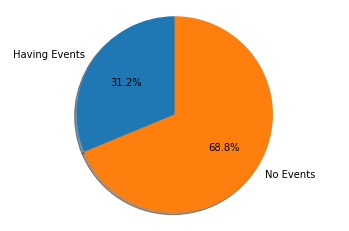

In [61]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = 'Having Events', 'No Events'
sizes = [having_events, no_events]
explode = (0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [62]:
gender_age_data_train['event_flag'] = event_flag

In [63]:
gender_age_data_train.head()

,device_id,gender,age,group,event_flag
0,-8076087639492063270,M,35,10,0
1,-2897161552818060146,M,35,10,0
2,-8260683887967679142,M,35,10,1
3,-4938849341048082022,M,30,9,0
4,245133531816851882,M,30,9,0


In [64]:
having_events_data_train = gender_age_data_train[gender_age_data_train['event_flag']==1]
no_events_data_train = gender_age_data_train[gender_age_data_train['event_flag']==0]

In [65]:
having_events_data_train = having_events_data_train.drop(['event_flag'],axis=1)
no_events_data_train = no_events_data_train.drop(['event_flag'],axis=1)

In [66]:
having_events_data_train.shape

(23309, 4)

In [67]:
no_events_data_train.shape

(51336, 4)

In [68]:
#Creating two separate datasets for devices having and not having events
having_events_data_train.to_csv('Datasets/NewData/having_events_data_train.csv')
no_events_data_train.to_csv('Datasets/NewData/no_events_data_train.csv')

#### Conclusion
For train data 23309 devices have events and 51336 devices do not have events

#### 3.3.2. Devices Having and not having Events- Train Data

In [69]:
event_flag = gender_age_data_test['device_id'].apply(lambda x: 1 if x in unique_device_ids else 0)

##### Percentage of Devices having events Test

In [70]:
having_events = np.round(event_flag.value_counts()[1]/len(gender_age_data_test['device_id'])*100,2)
print(having_events)

31.4


##### Percentage of Devices having events Test

In [71]:
no_events = np.round(event_flag.value_counts()[0]/len(gender_age_data_test['device_id'])*100,2)
print(no_events)

68.6


##### Pie Plot for Percentages

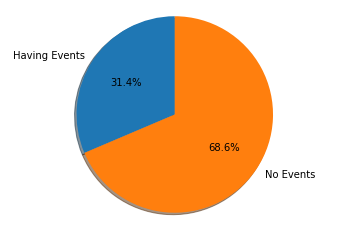

In [72]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = 'Having Events', 'No Events'
sizes = [having_events, no_events]
explode = (0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

#### 3.3.3. Checking for Latitude and Logitude details

In [73]:
events_data['latitude'].describe()

count    3.252950e+06
mean     2.162949e+01
std      1.569697e+01
min     -3.843000e+01
25%      0.000000e+00
50%      2.802000e+01
75%      3.407000e+01
max      5.994000e+01
Name: latitude, dtype: float64

In [74]:
events_data['longitude'].describe()

count    3.252950e+06
mean     7.796192e+01
std      5.405801e+01
min     -1.800000e+02
25%      0.000000e+00
50%      1.129500e+02
75%      1.172100e+02
max      1.747600e+02
Name: longitude, dtype: float64

#### Conclusion
68 percent of devices donot have events while 31 percent of devices have.

In [75]:
gender_age_data_test['event_flag'] = event_flag

In [76]:
having_events_data_test = gender_age_data_test[gender_age_data_test['event_flag']==1]
no_events_data_test = gender_age_data_test[gender_age_data_test['event_flag']==0]

In [77]:
having_events_data_test.shape

(35194, 2)

In [78]:
no_events_data_test.shape

(76877, 2)

In [79]:
gender_age_data_test.shape

(112071, 2)

In [80]:
#Creating new train datasets with having and not having events 
having_events_data_test = having_events_data_test.drop(['event_flag'],axis=1)
no_events_data_test = no_events_data_test.drop(['event_flag'],axis=1)

In [81]:
#Creating new test datasets with having and not having events 
having_events_data_test.to_csv('Datasets/NewData/having_events_data_test.csv')
no_events_data_test.to_csv('Datasets/NewData/no_events_data_test.csv')

#### 3.3.4. Process and merge Latitute and Longitude

In [82]:
#Computing median of lattitude and longitude for all devices
lat_medians = events_data.groupby("device_id")["latitude"].apply(lambda x: np.median([float(s) for s in x]))
long_medians = events_data.groupby("device_id")["longitude"].apply(lambda x: np.median([float(s) for s in x]))

In [83]:
#Merging the mean latitude and logitude with the respective devices
having_events_data_train = pd.merge(left=having_events_data_train, right=lat_medians, how='left', left_on='device_id', right_on='device_id')
having_events_data_train = pd.merge(left=having_events_data_train, right=long_medians, how='left', left_on='device_id', right_on='device_id')
having_events_data_test = pd.merge(left=having_events_data_test, right=lat_medians, how='left', left_on='device_id', right_on='device_id')
having_events_data_test = pd.merge(left=having_events_data_test, right=long_medians, how='left', left_on='device_id', right_on='device_id')

In [84]:
#Computing number of evnts a device has
number_of_events = dict(events_data["device_id"].value_counts())
having_events_data_train['NumberOfEvents'] = having_events_data_train['device_id'].apply(lambda x : number_of_events[x] if x in number_of_events else 0)
having_events_data_test['NumberOfEvents'] = having_events_data_test['device_id'].apply(lambda x : number_of_events[x] if x in number_of_events else 0)

In [85]:
having_events_data_train.head()

,device_id,gender,age,group,latitude,longitude,NumberOfEvents
0,-8260683887967679142,M,35,10,0.00,0.00,1
1,7477216237379271436,F,37,4,31.75,119.57,7
2,6352067998666467520,M,32,10,0.00,0.00,11
3,1508636020748379883,F,28,2,31.90,120.26,35
4,-6876541075223249434,M,75,11,39.14,117.20,28


In [86]:
events_data[events_data['device_id']==-8260683887967679142]

,event_id,device_id,timestamp,longitude,latitude
2479655,2479656,-8260683887967679142,2016-05-01 14:23:37,0.0,0.0


#### 3.3.5.Merging Phone Brand and model to train and test data

In [87]:
# Setting device_id as the index of the below tables in order to map with the next features device wise
having_events_data_train = having_events_data_train.set_index('device_id')
having_events_data_test = having_events_data_test.set_index('device_id')
no_events_data_train = no_events_data_train.set_index('device_id')
no_events_data_test = no_events_data_test.set_index('device_id')
gender_age_data_train = gender_age_data_train.set_index('device_id')
gender_age_data_test = gender_age_data_test.set_index('device_id')

In [364]:
# Phone brnd and model are mapped to the event and no event dataset by index(device_id)
having_events_data_train['phone_brand'] = having_events_data_train.index.map(phone_brand_device_model_data['brand'])
having_events_data_train['device_model'] = having_events_data_train.index.map(phone_brand_device_model_data['model_brand'])
having_events_data_test['phone_brand'] = having_events_data_test.index.map(phone_brand_device_model_data['brand'])
having_events_data_test['device_model'] = having_events_data_test.index.map(phone_brand_device_model_data['model_brand'])
no_events_data_train['phone_brand'] = no_events_data_train.index.map(phone_brand_device_model_data['brand'])
no_events_data_train['device_model'] = no_events_data_train.index.map(phone_brand_device_model_data['model'])
no_events_data_test['phone_brand'] = no_events_data_test.index.map(phone_brand_device_model_data['brand'])
no_events_data_test['device_model'] = no_events_data_test.index.map(phone_brand_device_model_data['model'])
gender_age_data_train['phone_brand'] = gender_age_data_train.index.map(phone_brand_device_model_data['brand'])
gender_age_data_train['device_model'] = gender_age_data_train.index.map(phone_brand_device_model_data['model'])
gender_age_data_test['phone_brand'] = gender_age_data_test.index.map(phone_brand_device_model_data['brand'])
gender_age_data_test['device_model'] = gender_age_data_test.index.map(phone_brand_device_model_data['model'])

#### 3.3.6. Computing Time of the events performed

In [368]:
# Excat time of the event is stored by converting into 24 hour format
events_data['hours'] = events_data['timestamp'].map(lambda x:pd.to_datetime(x).hour)
hour_events = events_data.groupby("device_id")["hours"].apply(lambda x: " ".join('0'+str(s) for s in x))
hour_events.head()

device_id
-9222956879900151005    011 012 015 012 015 021 015 015 021 07 012 015...
-9222661944218806987                       021 019 022 018 018 018 00 018
-9222399302879214035              011 013 023 021 013 023 010 013 023 013
-9221825537663503111    07 07 07 08 013 07 06 07 07 08 013 08 013 010 ...
-9221767098072603291                         05 015 014 012 018 05 013 07
Name: hours, dtype: object

#### 3.3.7 Computing Interval of Events

In [369]:
# Event time is divided into 4 different intervals
# 1. 04 to 10 - Morning
# 2. 10 to 16 - AfterNoon
# 3. 16 to 20 - Evening
# 4. 20 to 24 - Night
events_data['intervals'] = ["Morning" if ((x>=4)&(x<=10)) else "AfterNoon" if ((x>10)&(x<=16)) else "Evening" if ((x>=16)&(x<=20)) else "Night" for x in events_data['hours']]
intervals_events = events_data.groupby("device_id")["intervals"].apply(lambda x: " ".join(s for s in x))
intervals_events.head()

device_id
-9222956879900151005    AfterNoon AfterNoon AfterNoon AfterNoon AfterN...
-9222661944218806987    Night Evening Night Evening Evening Evening Ni...
-9222399302879214035    AfterNoon AfterNoon Night Night AfterNoon Nigh...
-9221825537663503111    Morning Morning Morning Morning AfterNoon Morn...
-9221767098072603291    Morning AfterNoon AfterNoon AfterNoon Evening ...
Name: intervals, dtype: object

#### 3.3.8. Computing Day of the Event

In [371]:
# Day of the week on which event is carried out
events_data['day'] = events_data['timestamp'].map(lambda x:pd.to_datetime(x).day_name())
day_events = events_data.groupby("device_id")["day"].apply(lambda x: " ".join(s for s in x))
day_events.head()

device_id
-9222956879900151005    Saturday Saturday Saturday Saturday Friday Fri...
-9222661944218806987    Wednesday Thursday Monday Sunday Saturday Frid...
-9222399302879214035    Wednesday Monday Tuesday Friday Wednesday Wedn...
-9221825537663503111    Saturday Saturday Friday Sunday Thursday Frida...
-9221767098072603291    Wednesday Sunday Sunday Wednesday Thursday Tue...
Name: day, dtype: object

#### 3.3.9. Merging All the Computed features into train and test data

In [372]:
# Mapping hours, intervals and days are mapped to events table by index
having_events_data_train['hours'] = having_events_data_train.index.map(hour_events)
having_events_data_test['hours'] = having_events_data_test.index.map(hour_events)
having_events_data_train['intervals'] = having_events_data_train.index.map(intervals_events)
having_events_data_test['intervals'] = having_events_data_test.index.map(intervals_events)
having_events_data_train['days'] = having_events_data_train.index.map(day_events)
having_events_data_test['days'] = having_events_data_test.index.map(day_events)

### 3.4. App Events

In [375]:
#Read the csv file
app_events_data = pd.read_csv('Datasets/app_events.csv')

In [376]:
app_events_data.shape

(32473067, 4)

In [377]:
app_events_data.head()

,event_id,app_id,is_installed,is_active
0,2,5927333115845830913,1,1
1,2,-5720078949152207372,1,0
2,2,-1633887856876571208,1,0
3,2,-653184325010919369,1,1
4,2,8693964245073640147,1,1


#### 3.4.1 Computing if App is active and installed

In [378]:
# Checking if app is active
app_events_data['is_installed'].value_counts()

1    32473067
Name: is_installed, dtype: int64

In [379]:
# Checking if app is installed
app_events_data['is_active'].value_counts()

0    19740071
1    12732996
Name: is_active, dtype: int64

In [380]:
app_events_data['is_active'] = app_events_data['is_active'].apply(lambda x: True if x==1 else False)

In [381]:
app_events_data.head()

,event_id,app_id,is_installed,is_active
0,2,5927333115845830913,1,True
1,2,-5720078949152207372,1,False
2,2,-1633887856876571208,1,False
3,2,-653184325010919369,1,True
4,2,8693964245073640147,1,True


#### 3.4.2. Creating Ttrainrow and testrow

In [382]:
# trainrow and testrow are created in order to keep a record there in the respective row of train and test data
# train and test row used by some features for mapping
having_events_data_train['trainrow'] = np.arange(having_events_data_train.shape[0])
having_events_data_test['testrow'] = np.arange(having_events_data_test.shape[0])
no_events_data_train['trainrow'] = np.arange(no_events_data_train.shape[0])
no_events_data_test['testrow'] = np.arange(no_events_data_test.shape[0])
gender_age_data_train['trainrow'] = np.arange(gender_age_data_train.shape[0])
gender_age_data_test['testrow'] = np.arange(gender_age_data_test.shape[0])

In [383]:
events_data = events_data.set_index('event_id')

In [384]:
events_data[events_data['device_id']==29182687948017175].head()

,device_id,timestamp,longitude,latitude,hours,intervals,day
event_id,,,,,,,
1,29182687948017175,2016-05-01 00:55:25,121.38,31.24,0,Night,Sunday
7104,29182687948017175,2016-05-02 09:37:02,121.38,31.24,9,Morning,Monday
29661,29182687948017175,2016-05-04 00:56:04,121.39,31.23,0,Night,Wednesday
33133,29182687948017175,2016-05-06 05:01:15,121.38,31.24,5,Morning,Friday
38980,29182687948017175,2016-05-06 09:55:04,121.16,31.00,9,Morning,Friday


#### 3.4.3. Computing Bag of Apps

For Each device we want to know which all apps were installed in the device. So we will first encode All the App Ids as integers from 0 to number of unique apps - 1. To get the Apps which are installed in a device denoted by device_id, we merge device_id column from events table to app_events group the resulting dataframe by device_id and app and aggregate. we then Merge in the trainrow, testrow columns to know at which row to put each device in the features matrix

In [386]:
#https://www.kaggle.com/dvasyukova/a-linear-model-on-apps-and-labels

# Number of app_id a particular device has
# For a device first the event is computed and for the event respective app ids are computed
app_encoder = LabelEncoder().fit(app_events_data['app_id'])
app_events_data['app'] = app_encoder.transform(app_events_data['app_id'])
napps = len(app_encoder.classes_)# number of unique apps it will be used in creating One-Hot Encoding of Apps 
deviceapps = (app_events_data.merge(events_data[['device_id']], how='left',left_on='event_id',right_index=True)
                       .groupby(['device_id','app'])['app'].agg(['count'])
                       .merge(having_events_data_train[['trainrow']], how='left', left_index=True, right_index=True)#merges by index which is device_id
                       .merge(having_events_data_test[['testrow']], how='left', left_index=True, right_index=True)#merges by index which is device_id
                       .reset_index())
deviceapps.head()

,device_id,app,count,trainrow,testrow
0,-9222956879900151005,548,18,5145.0,NaN
1,-9222956879900151005,1096,18,5145.0,NaN
2,-9222956879900151005,1248,26,5145.0,NaN
3,-9222956879900151005,1545,12,5145.0,NaN
4,-9222956879900151005,1664,18,5145.0,NaN


#### 3.4,4 Computing and mergeing app active status to train and test data

In [387]:
appisactive = app_events_data.groupby("event_id")["is_active"].apply(lambda x: " ".join(str(s) for s in x))
appisactive.head()

event_id
2     True False False True True True False False Fa...
6     True True True True True False True False True...
7     False True False False True True False False F...
9     False False False False False False False True...
16    False False False False False False False True...
Name: is_active, dtype: object

In [388]:
#Mapping apps is_active to device_id
events_data["apps_active"] = events_data.index.map(appisactive)
events_apps_active_map = events_data.groupby("device_id")["apps_active"].apply(lambda x: " ".join(str(s) for s in x if str(s)!='nan'))
events_apps_active_map.head()

device_id
-9222956879900151005    False False False False False False False True...
-9222661944218806987    True False True True True True True False Fals...
-9222399302879214035    False False False False False False False Fals...
-9221825537663503111    False False True False False True True False F...
-9221767098072603291    True False False False False True False True F...
Name: apps_active, dtype: object

In [389]:
having_events_data_train['app_is_active'] = having_events_data_train.index.map(events_apps_active_map)
having_events_data_test['app_is_active'] = having_events_data_test.index.map(events_apps_active_map)

### 3.5. App Labels

In [392]:
#Read the CSV file
app_labels_data = pd.read_csv("Datasets/app_labels.csv")

In [393]:
app_labels_data.head()

,app_id,label_id
0,7324884708820027918,251
1,-4494216993218550286,251
2,6058196446775239644,406
3,6058196446775239644,407
4,8694625920731541625,406


In [394]:
app_labels_data[app_labels_data['app_id']==7324884708820027918]

,app_id,label_id
0,7324884708820027918,251
403,7324884708820027918,691
135925,7324884708820027918,751
142457,7324884708820027918,786
145794,7324884708820027918,775
149151,7324884708820027918,781
152495,7324884708820027918,405
155783,7324884708820027918,730
438422,7324884708820027918,1015


##### Computing Bag of Labels
App Labels are also created in a similar approach by merging with deviceapps dataframe and grouping by labels and then merging it with trainrow, testrow to know at which row to put each device in the feature matrix

In [395]:
#https://www.kaggle.com/dvasyukova/a-linear-model-on-apps-and-labels

# Unique app_id are computed and are encode with numeric label
app_labels_data = app_labels_data.loc[app_labels_data['app_id'].isin(app_events_data['app_id'].unique())]
app_labels_data['app'] = app_encoder.transform(app_labels_data['app_id'])
labelencoder = LabelEncoder().fit(app_labels_data['label_id'])
app_labels_data['label'] = labelencoder.transform(app_labels_data['label_id'])
nlabels = len(labelencoder.classes_)

In [396]:
# Number of app labels a particular device has
# For a device first the event is computed and for the event respective app ids are computed and for an app_id the 
#number of lables are computed
devicelabels = (deviceapps[['device_id','app']]
                .merge(app_labels_data[['app','label']])
                .groupby(['device_id','label'])['app'].agg(['size'])
                .merge(having_events_data_train[['trainrow']], how='left', left_index=True, right_index=True)#merges by index which is device_id
                .merge(having_events_data_test[['testrow']], how='left', left_index=True, right_index=True)#merges by index which is device_id
                .reset_index())
devicelabels.head()

,device_id,label,size,trainrow,testrow
0,-9222956879900151005,117,1,5145.0,NaN
1,-9222956879900151005,120,1,5145.0,NaN
2,-9222956879900151005,126,1,5145.0,NaN
3,-9222956879900151005,138,2,5145.0,NaN
4,-9222956879900151005,147,2,5145.0,NaN


In [397]:
devicelabels[devicelabels['label']==1]

,device_id,label,size,trainrow,testrow
3295403,5083019926611946481,1,1,NaN,30043.0
3325396,5197530142143050644,1,1,13761.0,NaN


### 3.6. Label Categories
From this data set we only get the name of the labels

In [501]:
#Read the CSV file
label_categories_data = pd.read_csv("Datasets/label_categories.csv")

In [399]:
label_categories_data.head()

,label_id,category
0,1,NaN
1,2,game-game type
2,3,game-Game themes
3,4,game-Art Style
4,5,game-Leisure time


In [400]:
label_categories_data.shape

(930, 2)

## 4. Featurization

### Save and Load Sparse matrix

In [89]:
#https://stackoverflow.com/questions/8955448/save-load-scipy-sparse-csr-matrix-in-portable-data-format
#Saves a file with .npz extension
def save_sparse_matrix(filename, xmtr):
    np.savez(filename,data = xmtr.data ,indices= xmtr.indices,
             indptr =xmtr.indptr, shape=xmtr.shape )
    
#Loads a sparse matrix
def load_sparse_matrix(filename):
    tmp = np.load(filename)
    return csr_matrix((tmp['data'], tmp['indices'], tmp['indptr']), shape= tmp['shape'])

### 4.1. All Data

In [90]:
#Loading the one hot encoding matrices for All Devices
x_ohe_train = load_sparse_matrix('sparse/x_ohe_train.npz')
x_ohe_test = load_sparse_matrix('sparse/x_ohe_test.npz')

#### 4.1.1. One Hot Encoding - Phone brand

In [125]:
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.csr_matrix.html
X_device_brand_ohe_train = csr_matrix((np.ones(gender_age_data_train.shape[0]), # Number of Rows/Devices
                       (gender_age_data_train.trainrow, 
                        gender_age_data_train.phone_brand)))
X_device_brand_ohe_test = csr_matrix((np.ones(gender_age_data_test.shape[0]), # Number of Rows/Devices
                       (gender_age_data_test.testrow, gender_age_data_test.phone_brand)))
print("Train Brand One-hot Shape: ",X_device_brand_ohe_train.shape)
print("Test Brand One-hot Shape: ",X_device_brand_ohe_test.shape)

Train Brand One-hot Shape:  (74645, 131)
Test Brand One-hot Shape:  (112071, 131)


#### 4.1.2. One Hot Encoding - Device Model - Regular

In [126]:
X_device_model_ohe_train = csr_matrix((np.ones(gender_age_data_train.shape[0]), # Number of Rows/Devices
                       (gender_age_data_train.trainrow, 
                        gender_age_data_train.device_model)))
X_device_model_ohe_test = csr_matrix((np.ones(gender_age_data_test.shape[0]), # Number of Rows/Devices
                       (gender_age_data_test.testrow, gender_age_data_test.device_model)))
print("Train Brand One-hot Shape: ",X_device_model_ohe_train.shape)
print("Test Brand One-hot Shape: ",X_device_model_ohe_test.shape)

Train Brand One-hot Shape:  (74645, 1599)
Test Brand One-hot Shape:  (112071, 1599)


In [144]:
#Merge all the features for ALL Devices
x_ohe_train = hstack((X_device_brand_ohe_train,X_device_model_ohe_train))
x_ohe_test = hstack((X_device_brand_ohe_test,X_device_model_ohe_test))

In [145]:
#Print the shapes
print("Train Brand One-hot Shape: ",x_ohe_train.shape)
print("Test Brand One-hot Shape: ",x_ohe_test.shape)

Train Brand One-hot Shape:  (74645, 1730)
Test Brand One-hot Shape:  (112071, 1730)


In [6]:
# #Saving One-hot encoded Matrices
# save_sparse('sparse/x_ohe_train.npz',x_ohe_train.tocsr())
# save_sparse('sparse/x_ohe_test.npz',x_ohe_test.tocsr())

### 4.2. No Events

In [92]:
#Loading the one hot encoding matrices for Devices with no events
X_no_events_ohe_train = load_sparse_matrix('sparse/X_no_events_ohe_train.npz')
X_no_events_ohe_test = load_sparse_matrix('sparse/X_no_events_ohe_test.npz')

#### 4.2.1. One Hot Encoding Device Brand

In [147]:
X_no_events_device_brand_ohe_train = csr_matrix((np.ones(no_events_data_train.shape[0]), # Number of Rows/Devices
                       (no_events_data_train.trainrow, no_events_data_train.phone_brand)))
X_no_events_device_brand_ohe_test = csr_matrix((np.ones(no_events_data_test.shape[0]), # Number of Rows/Devices
                       (no_events_data_test.testrow, no_events_data_test.phone_brand)))
print("Train Brand One-hot Shape: ",X_no_events_device_brand_ohe_train.shape)
print("Test Brand One-hot Shape: ",X_no_events_device_brand_ohe_test.shape)

Train Brand One-hot Shape:  (51336, 131)
Test Brand One-hot Shape:  (76877, 131)


#### 4.2.2. One Hot Encoding - Device Model - Regular

In [149]:
X_no_events_device_model_ohe_train = csr_matrix((np.ones(no_events_data_train.shape[0]), # Number of Rows/Devices
                       (no_events_data_train.trainrow, no_events_data_train.device_model)))
X_no_events_device_model_ohe_test = csr_matrix((np.ones(no_events_data_test.shape[0]), # Number of Rows/Devices
                       (no_events_data_test.testrow, no_events_data_test.device_model)))
print("Train Brand One-hot Shape: ",X_no_events_device_model_ohe_train.shape)
print("Test Brand One-hot Shape: ",X_no_events_device_model_ohe_test.shape)

Train Brand One-hot Shape:  (51336, 1599)
Test Brand One-hot Shape:  (76877, 1599)


In [150]:
#Merging all the features for Device with no events
X_no_events_ohe_train = hstack((X_no_events_device_brand_ohe_train,X_no_events_device_model_ohe_train))
X_no_events_ohe_test = hstack((X_no_events_device_brand_ohe_test,X_no_events_device_model_ohe_test))

In [151]:
print("Train Brand One-hot Shape: ",X_no_events_ohe_train.shape)
print("Test Brand One-hot Shape: ",X_no_events_ohe_test.shape)

Train Brand One-hot Shape:  (51336, 1730)
Test Brand One-hot Shape:  (76877, 1730)


In [7]:
#Saving One-hot encoded Matrices for devices with no events
save_sparse('sparse/X_no_events_ohe_train.npz',X_no_events_ohe_train.tocsr())
save_sparse('sparse/X_no_events_ohe_test.npz',X_no_events_ohe_test.tocsr())

### 4.3. Having Events

In [94]:
#Loading the one hot encoding matrices for Devices with events
X_having_events_train = load_sparse_matrix('sparse/X_having_events_train.npz')
X_having_events_test = load_sparse_matrix('sparse/X_having_events_test.npz')

#### 4.3.1. One Hot Encoding - Device Brand

In [152]:
X_having_events_device_brand_ohe_train = csr_matrix((np.ones(having_events_data_train.shape[0]), # Number of Rows/Devices
                       (having_events_data_train.trainrow, having_events_data_train.phone_brand)),
                        shape=(having_events_data_train.shape[0],nbrands))
X_having_events_device_brand_ohe_test = csr_matrix((np.ones(having_events_data_test.shape[0]), # Number of Rows/Devices
                       (having_events_data_test.testrow, having_events_data_test.phone_brand)),
                        shape=(having_events_data_test.shape[0],nbrands))
print("Train Brand One-hot Shape: ",X_having_events_device_brand_ohe_train.shape)
print("Test Brand One-hot Shape: ",X_having_events_device_brand_ohe_test.shape)

Train Brand One-hot Shape:  (23309, 131)
Test Brand One-hot Shape:  (35194, 131)


#### 4.3.2. One Hot Encoding- Device Model - Concatenation of Brand and Model

In [153]:
X_having_events_device_model_ohe_train = csr_matrix((np.ones(having_events_data_train.shape[0]), # Number of Rows/Devices
                       (having_events_data_train.trainrow, having_events_data_train.device_model)),
                        shape=(having_events_data_train.shape[0],nmodels))
X_having_events_device_model_ohe_test = csr_matrix((np.ones(having_events_data_test.shape[0]), # Number of Rows/Devices
                       (having_events_data_test.testrow, having_events_data_test.device_model)),
                        shape=(having_events_data_test.shape[0],nmodels))
print("Train Brand One-hot Shape: ",X_having_events_device_model_ohe_train.shape)
print("Test Brand One-hot Shape: ",X_having_events_device_model_ohe_test.shape)

Train Brand One-hot Shape:  (23309, 1667)
Test Brand One-hot Shape:  (35194, 1667)


#### 4.3.3. Event App - Bag of Apps

In [154]:
#Since the Deviceapps has both train and test columns merged to create Train Apps One-Hot we will Drop all Nan of Train Row
#Once we remove Nan in Train Rows we will get the Apps in Train Data and we create CSR Matrix for those rows
d = deviceapps.dropna(subset=['trainrow'])
X_events_app_train = csr_matrix((np.ones(d.shape[0]), (d.trainrow, d.app)), 
                      shape=(having_events_data_train.shape[0],napps))
#Since the Deviceapps has both train and test columns merged to create Test Apps One-Hot we will Drop all Nan of Test Row
#Once we remove Nan in Test Rows we will get the Apps in Test Data and we create CSR Matrix for those rows
d = deviceapps.dropna(subset=['testrow'])
X_events_app_test = csr_matrix((np.ones(d.shape[0]), (d.testrow, d.app)), 
                      shape=(having_events_data_test.shape[0],napps))
print("Train Event Apps One-hot Shape: ",X_events_app_train.shape)
print("Test Event Apps One-hot Shape: ",X_events_app_test.shape)

Train Event Apps One-hot Shape:  (23309, 19237)
Test Event Apps One-hot Shape:  (35194, 19237)


#### 4.3.4. Event Labels - Bag of Labels

In [155]:
#Since the Devicelabels has both train and test columns merged to create Train Labels One-Hot we will Drop all Nan of Train Row
#Once we remove Nan in Train Rows we will get the Labels in Train Data and we create CSR Matrix for those rows
d = devicelabels.dropna(subset=['trainrow'])
X_events_label_train = csr_matrix((np.ones(d.shape[0]), (d.trainrow, d.label)), 
                      shape=(having_events_data_train.shape[0],nlabels))
#Since the Devicelabels has both train and test columns merged to create Test Labels One-Hot we will Drop all Nan of Test Row
#Once we remove Nan in Test Rows we will get the Labels in Test Data and we create CSR Matrix for those rows
d = devicelabels.dropna(subset=['testrow'])
X_events_label_test = csr_matrix((np.ones(d.shape[0]), (d.testrow, d.label)), 
                      shape=(having_events_data_test.shape[0],nlabels))
print("Train Event Labels One-hot Shape: ",X_events_label_train.shape)
print("Test Event Labels One-hot Shape: ",X_events_label_test.shape)

Train Event Labels One-hot Shape:  (23309, 492)
Test Event Labels One-hot Shape:  (35194, 492)


#### 4.3.5. TFIDF - Event Hours

In [156]:
vectorizer=TfidfVectorizer()
vectorizer.fit(having_events_data_train['hours'].values)

X_event_hours_tfidf_train = vectorizer.transform(having_events_data_train['hours'].values)
X_event_hours_tfidf_test = vectorizer.transform(having_events_data_test['hours'].values)
print("After vectorizations")
print("Train Event Hours One-hot Shape: ",X_event_hours_tfidf_train.shape)
print("Test Event Hours One-hot Shape: ",X_event_hours_tfidf_test.shape)

After vectorizations
Train Event Hours One-hot Shape:  (23309, 24)
Test Event Hours One-hot Shape:  (35194, 24)


#### 4.3.6. TFIDF - Intervals

In [157]:
vectorizer=TfidfVectorizer()
vectorizer.fit(having_events_data_train['intervals'].values)

X_event_intervals_tfidf_train = vectorizer.transform(having_events_data_train['intervals'].values)
X_event_intervals_tfidf_test = vectorizer.transform(having_events_data_test['intervals'].values)
print("After vectorizations")
print("Train Event Hours One-hot Shape: ",X_event_intervals_tfidf_train.shape)
print("Test Event Hours One-hot Shape: ",X_event_intervals_tfidf_test.shape)

After vectorizations
Train Event Hours One-hot Shape:  (23309, 4)
Test Event Hours One-hot Shape:  (35194, 4)


#### 4.3.7. TFIDF - Days

In [158]:
vectorizer=TfidfVectorizer()
vectorizer.fit(having_events_data_train['days'].values)

X_event_days_tfidf_train = vectorizer.transform(having_events_data_train['days'].values)
X_event_days_tfidf_test = vectorizer.transform(having_events_data_test['days'].values)
print("After vectorizations")
print("Train Event Day One-hot Shape: ",X_event_days_tfidf_train.shape)
print("Test Event Day One-hot Shape: ",X_event_days_tfidf_test.shape)

After vectorizations
Train Event Day One-hot Shape:  (23309, 7)
Test Event Day One-hot Shape:  (35194, 7)


#### 4.3.8. TFIDF - App is Active

In [159]:
vectorizer=TfidfVectorizer()
vectorizer.fit(having_events_data_train['app_is_active'].values)

X_app_is_active_tfidf_train = vectorizer.transform(having_events_data_train['app_is_active'].values)
X_app_is_active_tfidf_test = vectorizer.transform(having_events_data_test['app_is_active'].values)
print("After vectorizations")
print("Train Apps Active One-hot Shape: ",X_app_is_active_tfidf_train.shape)
print("Test Apps Active One-hot Shape: ",X_app_is_active_tfidf_test.shape)

After vectorizations
Train Apps Active One-hot Shape:  (23309, 2)
Test Apps Active One-hot Shape:  (35194, 2)


#### 4.3.9. Standardiztion - Latitude

In [160]:
scaler=StandardScaler()
scaler.fit(having_events_data_train['latitude'].values.reshape(-1,1))

X_lat_standard_train = scaler.transform(having_events_data_train['latitude'].values.reshape(-1,1))
X_lat_standard_test = scaler.transform(having_events_data_test['latitude'].values.reshape(-1,1))
print("After Standardizing")
print("Train Event Latitude Standardized Shape: ",X_lat_standard_train.shape)
print("Test Event Latitude Standardized  Shape: ",X_lat_standard_test.shape)

After Standardizing
Train Event Latitude Standardized Shape:  (23309, 1)
Test Event Latitude Standardized  Shape:  (35194, 1)


#### 4.3.10. Standardization - Longitude

In [161]:
scaler=StandardScaler()
scaler.fit(having_events_data_train['longitude'].values.reshape(-1,1))

X_long_standard_train = scaler.transform(having_events_data_train['longitude'].values.reshape(-1,1))
X_long_standard_test = scaler.transform(having_events_data_test['longitude'].values.reshape(-1,1))
print("After Standardizing")
print("Train Event Latitude Standardized Shape: ",X_long_standard_train.shape)
print("Test Event Latitude Standardized  Shape: ",X_long_standard_test.shape)

After Standardizing
Train Event Latitude Standardized Shape:  (23309, 1)
Test Event Latitude Standardized  Shape:  (35194, 1)


#### 4.3.11. Standardization - Number of Events

In [502]:
# scaler=StandardScaler()
# scaler.fit(having_events_data_train['NumberOfEvents'].values.reshape(-1,1))

# X_events_num_standard_train = scaler.transform(having_events_data_train['NumberOfEvents'].values.reshape(-1,1))
# X_events_num_standard_test = scaler.transform(having_events_data_test['NumberOfEvents'].values.reshape(-1,1))
# print("After Standardizing")
# print("Train Event Latitude Standardized Shape: ",X_events_num_standard_train.shape)
# print("Test Event Latitude Standardized  Shape: ",X_events_num_standard_test.shape)

#### 4.3.12.  Final Features

In [162]:
#Merging all the data sets as per train and test data for devices with events
X_having_events_device_brand_ohe_train = X_having_events_device_brand_ohe_train.tocsr()
X_having_events_device_model_ohe_train = X_having_events_device_model_ohe_train.tocsr()
X_events_app_train = X_events_app_train.tocsr()
X_events_label_train = X_events_label_train.tocsr()

X_having_events_device_brand_ohe_test = X_having_events_device_brand_ohe_test.tocsr()
X_having_events_device_model_ohe_test = X_having_events_device_model_ohe_test.tocsr()
X_events_app_test = X_events_app_test.tocsr()
X_events_label_test = X_events_label_test.tocsr()


X_having_events_train = hstack((X_having_events_device_brand_ohe_train,X_having_events_device_model_ohe_train,X_events_app_train,X_events_label_train,X_event_hours_tfidf_train,X_event_intervals_tfidf_train,X_event_days_tfidf_train,X_app_is_active_tfidf_train,X_lat_standard_train,X_long_standard_train))
X_having_events_test = hstack((X_having_events_device_brand_ohe_test,X_having_events_device_model_ohe_test,X_events_app_test,X_events_label_test,X_event_hours_tfidf_test,X_event_intervals_tfidf_test,X_event_days_tfidf_test,X_app_is_active_tfidf_test,X_lat_standard_test,X_long_standard_test))

In [8]:
# #Saving sparse Matrices for devices with events
# save_sparse_matrix('sparse/X_having_events_train.npz',X_having_events_train.tocsr())
# save_sparse_matrix('sparse/X_having_events_test.npz',X_having_events_test.tocsr())

## 5. Models

##### Confusion Matrix

In [95]:
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    A =(((C.T)/(C.sum(axis=1))).T)
    B =(C/C.sum(axis=0))
   
    labels = ['F23-', 'F24-26', 'F27-28' ,'F29-32' ,'F33-42','F43+' ,'M22-' ,'M23-26','M27-28', 'M29-31' ,'M32-38' ,'M39+']
    # representing A in heatmap format
    print("-"*20, "Confusion matrix", "-"*20)
    plt.figure(figsize=(20,7))
    sns.heatmap(C, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

    print("-"*20, "Precision matrix (Columm Sum=1)", "-"*20)
    plt.figure(figsize=(20,7))
    sns.heatmap(B, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    
    # representing B in heatmap format
    print("-"*20, "Recall matrix (Row sum=1)", "-"*20)
    plt.figure(figsize=(20,7))
    sns.heatmap(A, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

In [176]:
#Reading train data for actual class labels
train_data = pd.read_csv("Datasets/gender_age_train.csv")
targetencoder = LabelEncoder()
targetencoder.fit(train_data["group"])
targetencoder.classes_

array(['F23-', 'F24-26', 'F27-28', 'F29-32', 'F33-42', 'F43+', 'M22-',
       'M23-26', 'M27-28', 'M29-31', 'M32-38', 'M39+'], dtype=object)

### 5.1. No Events Device

In [97]:
#Fetching Class Labels
Y_all = gender_age_data_train['group'].values

In [98]:
#Performing Train, test and cv split on the data
X_all_train , X_all_cv , Y_all_train , Y_all_cv = train_test_split(x_ohe_train, Y_all,stratify=Y_all,test_size=0.15,random_state=18)
X_no_events_test = X_no_events_ohe_test

#### 5.1.1. K Nearest Neighbour

In [204]:
from sklearn.neighbors import KNeighborsClassifier
k_size = [5,10,50,100,150]
for k_neighbour in k_size:
    knn_no_events_clf = KNeighborsClassifier(n_neighbors=k_neighbour, n_jobs=-1)
    knn_no_events_clf.fit(X_all_train, Y_all_train)
    #Using Model Calibration
    knn_no_events_sig_clf = CalibratedClassifierCV(knn_no_events_clf, method="sigmoid")
    knn_no_events_sig_clf.fit(X_all_train, Y_all_train)
    knn_no_events_predict_y = knn_no_events_sig_clf.predict_proba(X_all_cv)
    print('For values of K = ', k_neighbour, "The log loss is:",log_loss(Y_all_cv, knn_no_events_predict_y, labels=knn_no_events_clf.classes_, eps=1e-15))

For values of K =  5 The log loss is: 2.4199942074440424
For values of K =  10 The log loss is: 2.416517351519975
For values of K =  50 The log loss is: 2.405082175808167
For values of K =  100 The log loss is: 2.400830923414351
For values of K =  150 The log loss is: 2.3996708934507853


In [205]:
#Training with best hyper parameters
knn_no_events_clf = KNeighborsClassifier(n_neighbors=50, n_jobs=-1)
knn_no_events_clf.fit(X_all_train, Y_all_train)
#Using Model Calibration
knn_no_events_sig_clf = CalibratedClassifierCV(knn_no_events_clf, method="sigmoid")
knn_no_events_sig_clf.fit(X_all_train, Y_all_train)
knn_no_events_predict_y = knn_no_events_sig_clf.predict_proba(X_all_cv)
print('For values of K = ', k_neighbour, "The log loss is:",log_loss(Y_all_cv, knn_no_events_predict_y, labels=knn_no_events_clf.classes_, eps=1e-15))

For values of K =  150 The log loss is: 2.405082175808167


In [206]:
#Printing Log loss
knn_no_events_pred_train = knn_no_events_sig_clf.predict_proba(X_all_train)
print("Train Log-Loss is",log_loss(Y_all_train, knn_no_events_pred_train, labels=knn_no_events_clf.classes_, eps=1e-15))
knn_no_events_pred_cv = knn_no_events_sig_clf.predict_proba(X_all_cv)
print("CV Log-Loss is",log_loss(Y_all_cv, knn_no_events_pred_cv, labels=knn_no_events_clf.classes_, eps=1e-15))

Train Log-Loss is 2.3891547112027545
CV Log-Loss is 2.405082175808167


In [207]:
y_pred_no_events_train_classes_knn = np.argmax(knn_no_events_pred_train, axis=1)
y_pred_no_events_cv_classes_knn = np.argmax(knn_no_events_pred_cv, axis=1)

Train Log Loss : 2.3891547112027545
-------------------- Confusion matrix --------------------


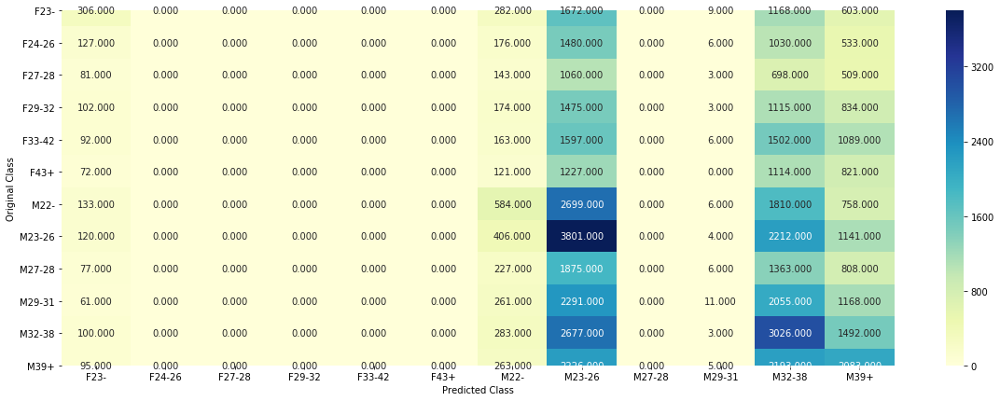

-------------------- Precision matrix (Columm Sum=1) --------------------


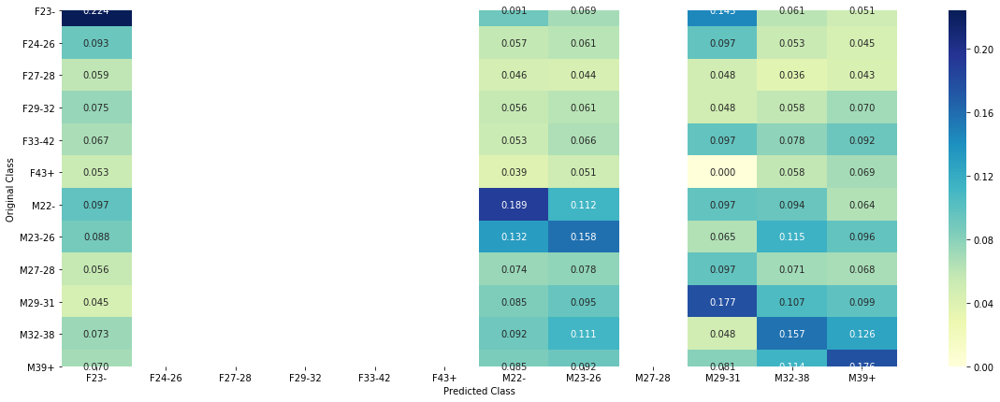

-------------------- Recall matrix (Row sum=1) --------------------


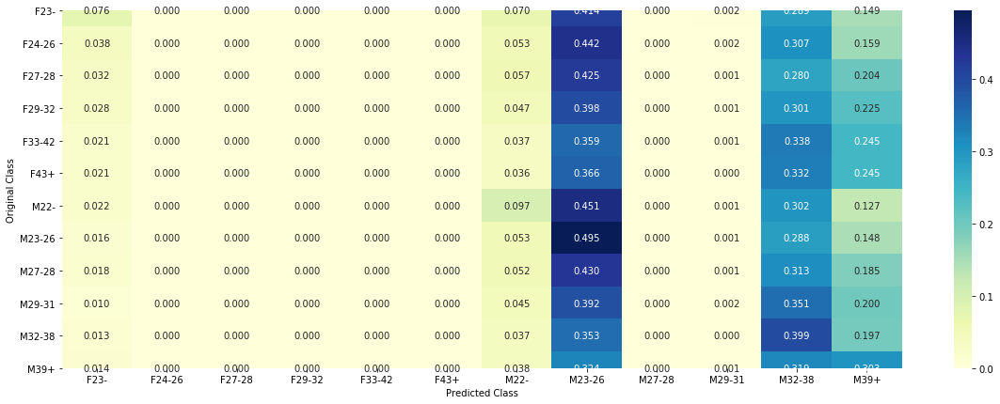

CV Log Loss : 2.405082175808167
-------------------- Confusion matrix --------------------


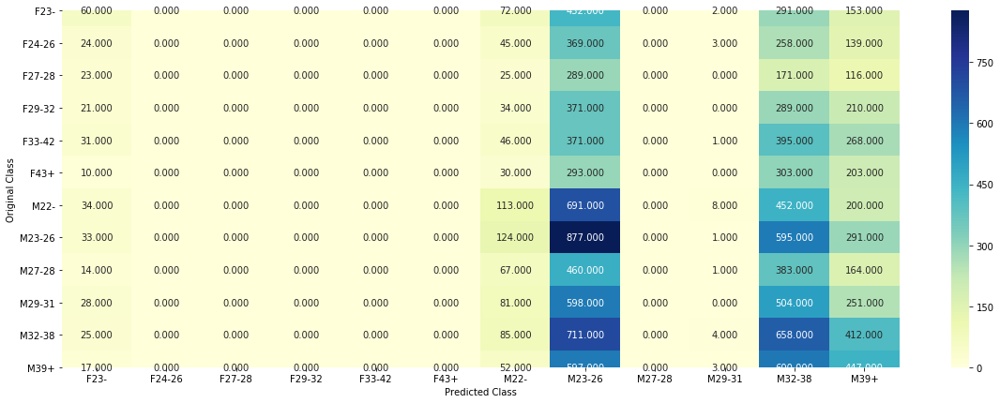

-------------------- Precision matrix (Columm Sum=1) --------------------


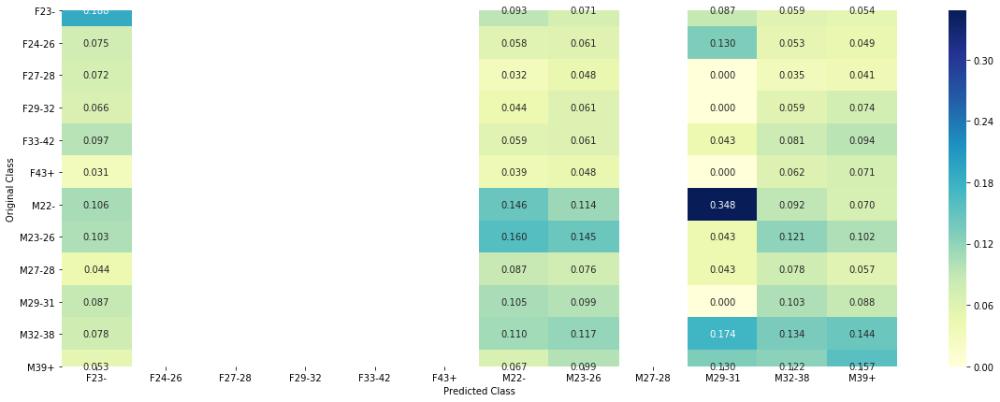

-------------------- Recall matrix (Row sum=1) --------------------


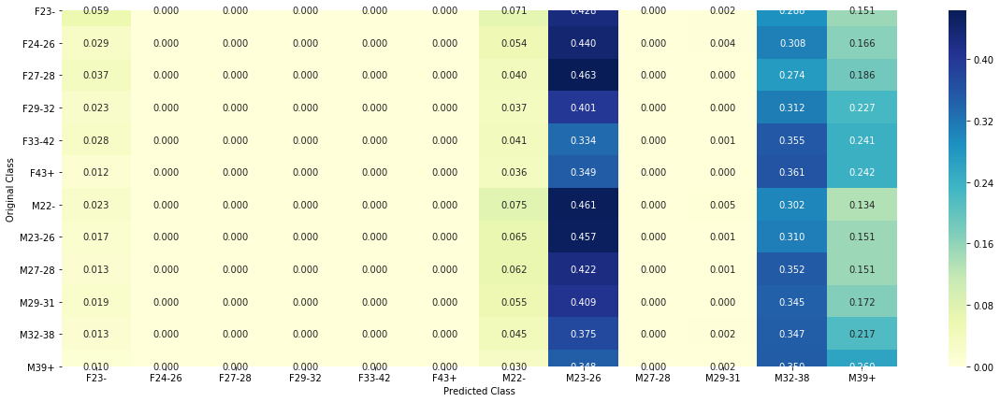

In [208]:
#Printing confusion matrix
print("Train Log Loss :",log_loss(Y_all_train, knn_no_events_pred_train))
plot_confusion_matrix(Y_all_train,y_pred_no_events_train_classes_knn)

print("="*60)

print("CV Log Loss :",log_loss(Y_all_cv, knn_no_events_pred_cv))
plot_confusion_matrix(Y_all_cv,y_pred_no_events_cv_classes_knn)

In [209]:
y_no_events_pred_k_nearest_neighbours = knn_no_events_sig_clf.predict_proba(X_no_events_test)

In [282]:
# Predicting multiclass labels for test data
prediction_no_events_knn = pd.DataFrame(y_no_events_pred_k_nearest_neighbours,index = no_events_data_test.index,columns=targetencoder.classes_)
prediction_no_events_knn.head()
prediction_no_events_knn.to_csv("Predictions/prediction_no_events_knn.csv")

#### 5.1.2. SVM

In [216]:
from sklearn.linear_model import SGDClassifier
hyperparameters = [10**-4, 10**-3,10**-2,10**-1,10**0, 10**1, 10**2,10**3,10**4]
for c in hyperparameters:
    svm_no_events_clf = SGDClassifier(loss='hinge',alpha=c, class_weight='balanced',random_state=42)
    svm_no_events_clf.fit(X_all_train, Y_all_train)
    #Using Model Calibration
    svm_no_events_sig_clf = CalibratedClassifierCV(svm_no_events_clf, method="sigmoid")
    svm_no_events_sig_clf.fit(X_all_train, Y_all_train)
    svm_no_events_predict_y = svm_no_events_sig_clf.predict_proba(X_all_cv)
    print('For values of alpha = ', c, "The log loss is:",log_loss(Y_all_cv, svm_no_events_predict_y, labels=svm_no_events_clf.classes_, eps=1e-15))

For values of alpha =  0.0001 The log loss is: 2.4216545233211333
For values of alpha =  0.001 The log loss is: 2.4185207695217543
For values of alpha =  0.01 The log loss is: 2.4278811571743164
For values of alpha =  0.1 The log loss is: 2.4267097373587743
For values of alpha =  1 The log loss is: 2.4238633856291263
For values of alpha =  10 The log loss is: 2.423863380592673
For values of alpha =  100 The log loss is: 2.4238633808488466
For values of alpha =  1000 The log loss is: 2.4238633808468855
For values of alpha =  10000 The log loss is: 2.4238633809211887


In [217]:
#Training with best hyperparameters
svm_no_events_clf = SGDClassifier(loss='hinge',alpha=10, class_weight='balanced',random_state=42)
svm_no_events_clf.fit(X_all_train, Y_all_train)
#Using Model Calibration
svm_no_events_sig_clf = CalibratedClassifierCV(svm_no_events_clf, method="sigmoid")
svm_no_events_sig_clf.fit(X_all_train, Y_all_train)
svm_no_events_predict_y = svm_no_events_sig_clf.predict_proba(X_all_cv)
print('For values of alpha = ', c, "The log loss is:",log_loss(Y_all_cv, svm_no_events_predict_y, labels=svm_no_events_clf.classes_, eps=1e-15))

For values of alpha =  10000 The log loss is: 2.423863380592673


In [218]:
#printing log loss
svm_no_events_pred_train = svm_no_events_sig_clf.predict_proba(X_all_train)
print("Train Log-Loss is",log_loss(Y_all_train, svm_no_events_pred_train, labels=svm_no_events_clf.classes_, eps=1e-15))
svm_no_events_pred_cv = svm_no_events_sig_clf.predict_proba(X_all_cv)
print("CV Log-Loss is",log_loss(Y_all_cv, svm_no_events_pred_cv, labels=svm_no_events_clf.classes_, eps=1e-15))

Train Log-Loss is 2.4244531036160546
CV Log-Loss is 2.423863380592673


In [219]:
y_pred_no_events_train_classes_svm = np.argmax(svm_no_events_pred_train, axis=1)
y_pred_no_events_cv_classes_svm = np.argmax(svm_no_events_pred_cv, axis=1)

Train Log Loss : 2.4244531036160546
-------------------- Confusion matrix --------------------


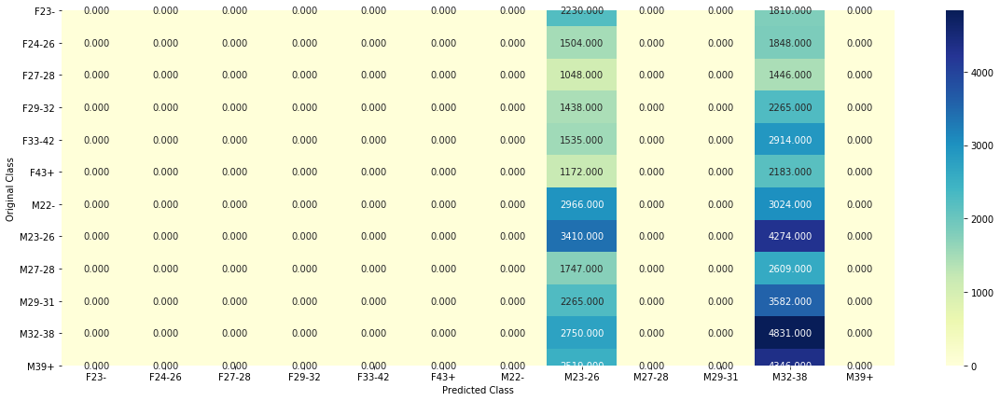

-------------------- Precision matrix (Columm Sum=1) --------------------


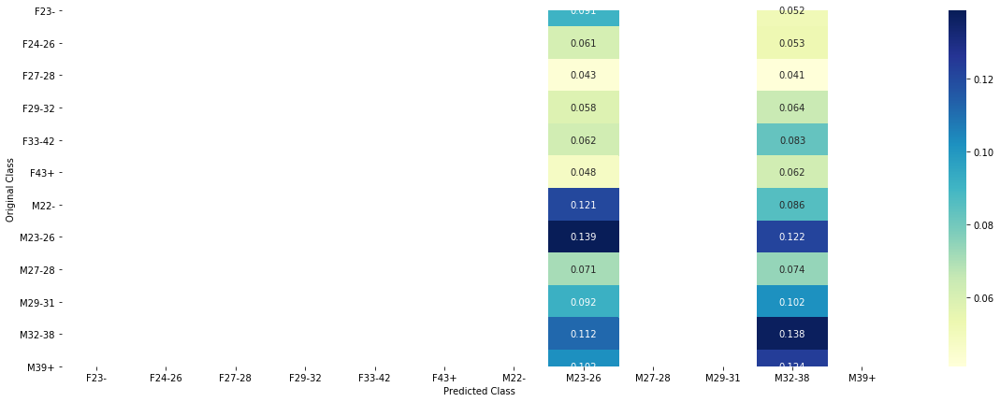

-------------------- Recall matrix (Row sum=1) --------------------


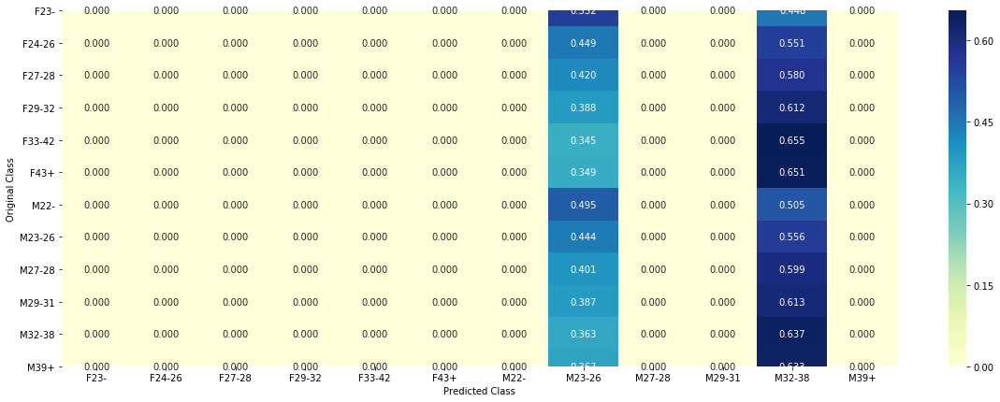

CV Log Loss : 2.423863380592673
-------------------- Confusion matrix --------------------


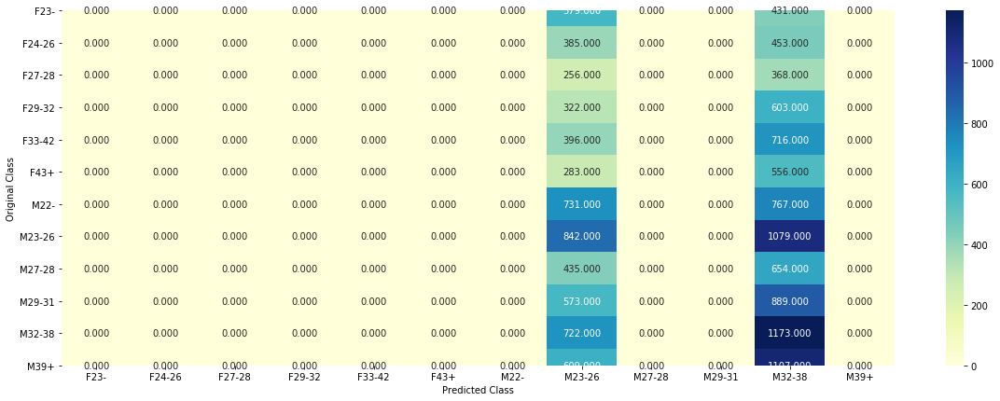

-------------------- Precision matrix (Columm Sum=1) --------------------


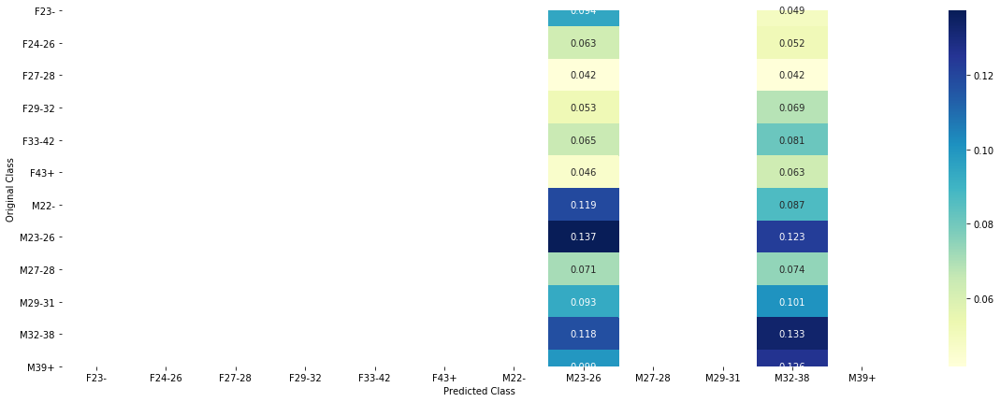

-------------------- Recall matrix (Row sum=1) --------------------


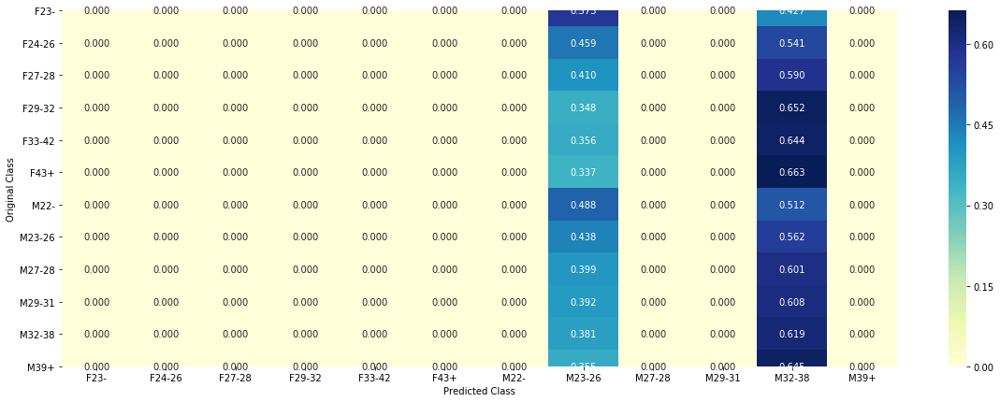

In [220]:
#printing comfusion matrix
print("Train Log Loss :",log_loss(Y_all_train, svm_no_events_pred_train))
plot_confusion_matrix(Y_all_train,y_pred_no_events_train_classes_svm)

print("="*60)

print("CV Log Loss :",log_loss(Y_all_cv, svm_no_events_pred_cv))
plot_confusion_matrix(Y_all_cv,y_pred_no_events_cv_classes_svm)

In [221]:
y_no_events_pred_svm = svm_no_events_sig_clf.predict_proba(X_no_events_test)

In [283]:
# Predicting Multiclass labels with test data
prediction_no_events_svm = pd.DataFrame(y_no_events_pred_svm,index = no_events_data_test.index,columns=targetencoder.classes_)
prediction_no_events_svm.head()
prediction_no_events_svm.to_csv("Predictions/prediction_no_events_svm.csv")

#### 5.1.3. Logistic Regression

In [99]:
# # Loading the logistic Regression model
# log_reg_no_events_sig_clf = joblib.load('Models/log_reg_no_events/no_events_logistic_regression.sav')

In [172]:
hyperparameters = [10**-4, 10**-3,10**-2,10**-1,10**0, 10**1, 10**2,10**3,10**4]
for c in hyperparameters:
    log_reg_no_events_clf = SGDClassifier(alpha=c, class_weight='balanced', loss='log',random_state=42)
    log_reg_no_events_clf.fit(X_all_train, Y_all_train)
    #Using Model Calibration
    log_reg_no_events_sig_clf = CalibratedClassifierCV(log_reg_no_events_clf, method="sigmoid")
    log_reg_no_events_sig_clf.fit(X_all_train, Y_all_train)
    log_reg_no_events_predict_y = log_reg_no_events_sig_clf.predict_proba(X_all_cv)
    print('For values of C = ', c, "The log loss is:",log_loss(Y_all_cv, log_reg_no_events_predict_y, labels=log_reg_no_events_clf.classes_, eps=1e-15))

For values of C =  0.0001 The log loss is: 2.4037770982196105
For values of C =  0.001 The log loss is: 2.4015651343122024
For values of C =  0.01 The log loss is: 2.3952670464124797
For values of C =  0.1 The log loss is: 2.388942777120694
For values of C =  1 The log loss is: 2.390846335435144
For values of C =  10 The log loss is: 2.3988918239964168
For values of C =  100 The log loss is: 2.401727758751017
For values of C =  1000 The log loss is: 2.4019927710476208
For values of C =  10000 The log loss is: 2.401976758489355


In [287]:
# Training with best hyper parameters
best_c = 10**-1
log_reg_no_events_clf = SGDClassifier(alpha=c, class_weight='balanced', loss='log',random_state=42)
log_reg_no_events_clf.fit(X_all_train, Y_all_train)
log_reg_no_events_sig_clf = CalibratedClassifierCV(log_reg_no_events_clf, method="sigmoid")
log_reg_no_events_sig_clf.fit(X_all_train, Y_all_train)

CalibratedClassifierCV(base_estimator=LogisticRegression(C=0.1,
                                                         class_weight='balanced',
                                                         dual=False,
                                                         fit_intercept=True,
                                                         intercept_scaling=1,
                                                         l1_ratio=None,
                                                         max_iter=100,
                                                         multi_class='multinomial',
                                                         n_jobs=None,
                                                         penalty='l2',
                                                         random_state=42,
                                                         solver='lbfgs',
                                                         tol=0.0001, verbose=0,
                                   

In [11]:
# #Saving the best model
# jobl.dump(log_reg_no_events_sig_clf,'Models/log_reg_no_events/no_events_logistic_regression.sav')

In [100]:
#printing log loss
log_reg_no_events_pred_train = log_reg_no_events_sig_clf.predict_proba(X_all_train)
print("Train Log-Loss is",log_loss(Y_all_train, log_reg_no_events_pred_train, labels=log_reg_no_events_sig_clf.classes_, eps=1e-15))
log_reg_no_events_pred_cv = log_reg_no_events_sig_clf.predict_proba(X_all_cv)
print("CV Log-Loss is",log_loss(Y_all_cv, log_reg_no_events_pred_cv, labels=log_reg_no_events_sig_clf.classes_, eps=1e-15))

Train Log-Loss is 2.3676627576203098
CV Log-Loss is 2.389722153770035


In [101]:
y_pred_no_events_train_classes_log_reg = np.argmax(log_reg_no_events_pred_train, axis=1)
y_pred_no_events_cv_classes_log_reg = np.argmax(log_reg_no_events_pred_cv, axis=1)

Train Log Loss : 2.3676627576203098
-------------------- Confusion matrix --------------------


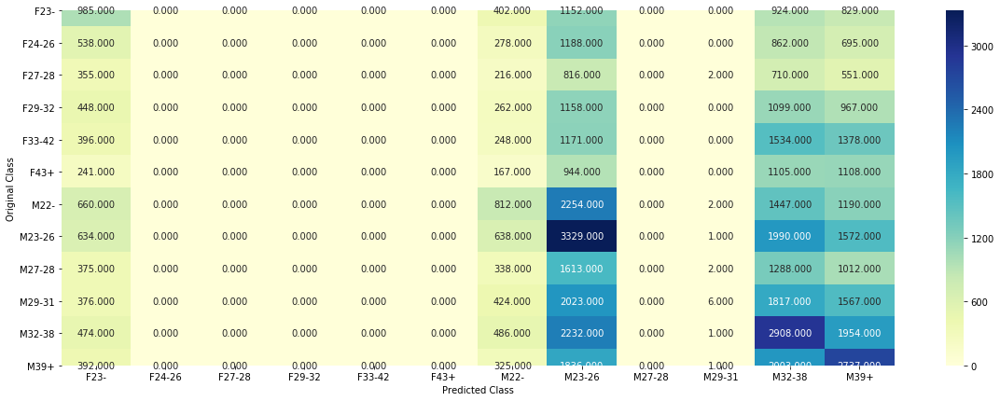

-------------------- Precision matrix (Columm Sum=1) --------------------


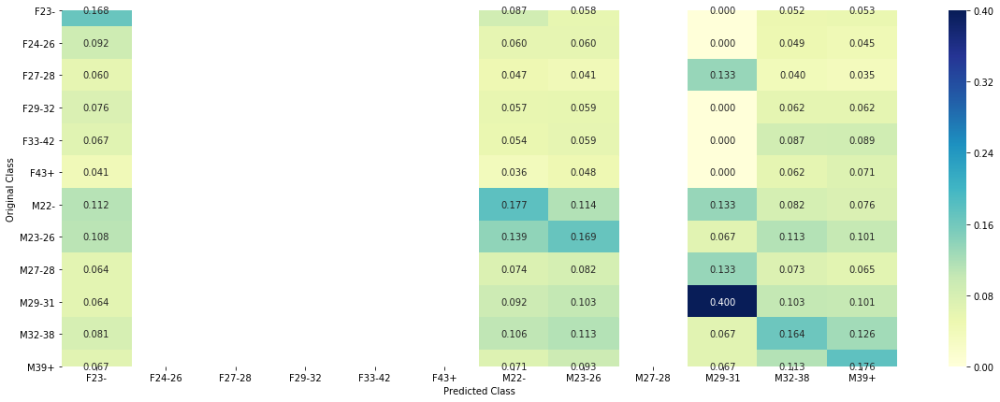

-------------------- Recall matrix (Row sum=1) --------------------


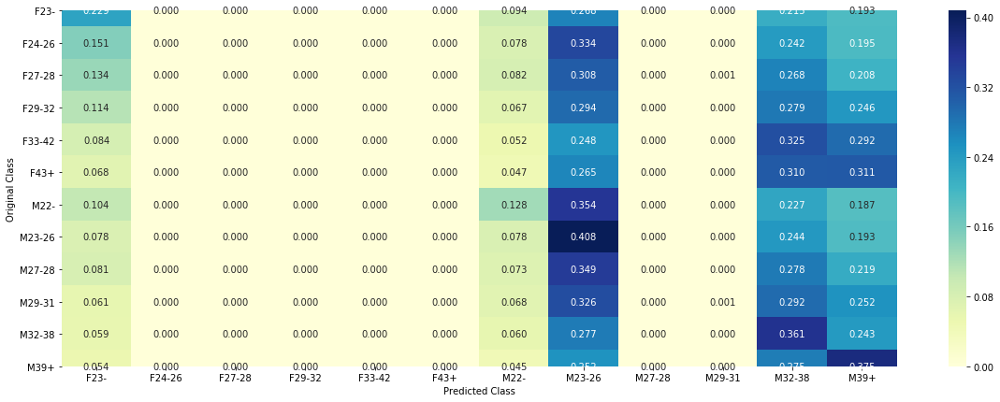

CV Log Loss : 2.389722153770035
-------------------- Confusion matrix --------------------


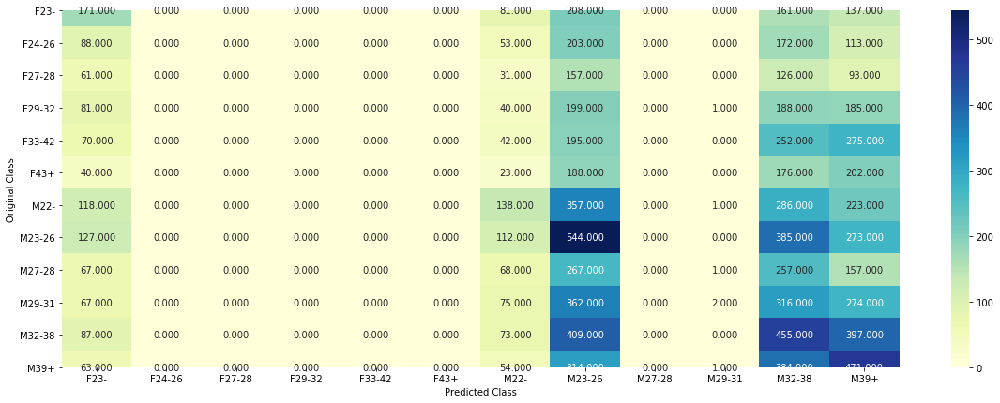

-------------------- Precision matrix (Columm Sum=1) --------------------


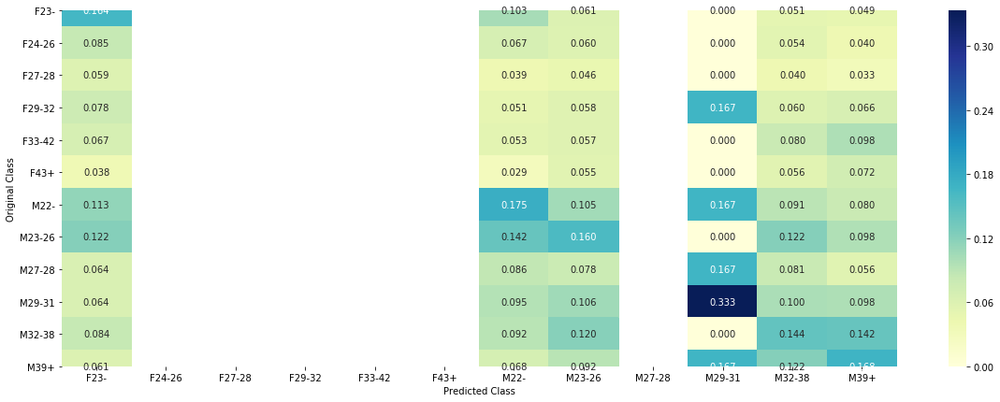

-------------------- Recall matrix (Row sum=1) --------------------


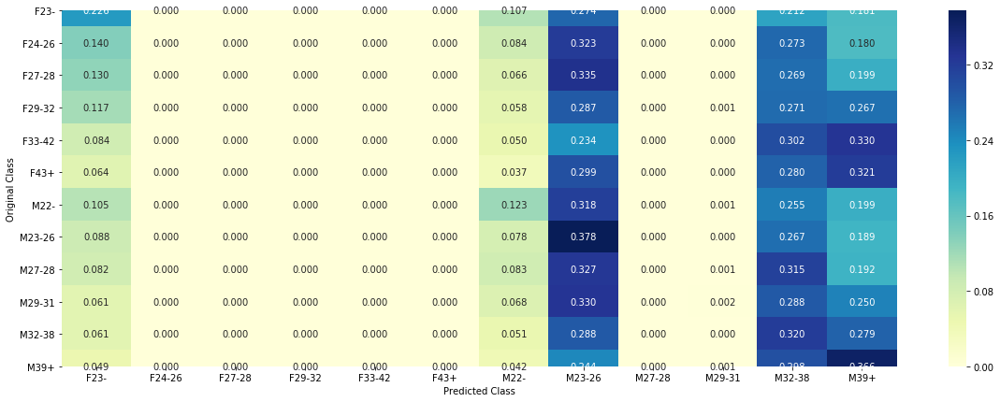

In [102]:
#printing confusion matrix
print("Train Log Loss :",log_loss(Y_all_train, log_reg_no_events_pred_train))
plot_confusion_matrix(Y_all_train,y_pred_no_events_train_classes_log_reg)

print("="*60)

print("CV Log Loss :",log_loss(Y_all_cv, log_reg_no_events_pred_cv))
plot_confusion_matrix(Y_all_cv,y_pred_no_events_cv_classes_log_reg)

In [103]:
y_no_events_pred_logistic_regression = log_reg_no_events_sig_clf.predict_proba(X_no_events_test)

In [104]:
#Predicting multiclass label on test data
prediction_no_events_log_reg = pd.DataFrame(y_no_events_pred_logistic_regression,index = no_events_data_test.index,columns=targetencoder.classes_)
prediction_no_events_log_reg.head()
prediction_no_events_log_reg.to_csv("Predictions/prediction_no_events_log_reg.csv")

#### 5.1.4. XGBoost

In [171]:
max_depth= [3,4,5,6,7]
n_estimator = [250,350,450,550]
for depth in max_depth:
    for estimator in n_estimator:
        xgb_no_events_clf=XGBClassifier(n_estimators=estimator,n_jobs=-1,learning_rate=0.05, colsample_bytree=0.7, max_depth=depth,subsample=0.7,objective='multi:softprob',num_class=12,eval_metric='mlogloss')
        xgb_no_events_clf.fit(X_all_train, Y_all_train)
        xgb_no_events_sig_clf = CalibratedClassifierCV(xgb_no_events_clf)
        xgb_no_events_sig_clf.fit(X_all_train, Y_all_train)
        xgb_no_events_predict_y = xgb_no_events_sig_clf.predict_proba(X_all_cv)
        print ('log_loss for best parameter is',log_loss(Y_all_cv, xgb_no_events_predict_y, labels=xgb_no_events_clf.classes_, eps=1e-15))

log_loss for n_estimator =  250 and maxdepth = 3 is 2.395826959726325
log_loss for n_estimator =  350 and maxdepth = 3 is 2.3953403486348774
log_loss for n_estimator =  450 and maxdepth = 3 is 2.3952853908747875
log_loss for n_estimator =  550 and maxdepth = 3 is 2.395239102536255
log_loss for n_estimator =  250 and maxdepth = 4 is 2.395420964942357
log_loss for n_estimator =  350 and maxdepth = 4 is 2.3952504654943163
log_loss for n_estimator =  450 and maxdepth = 4 is 2.3953852872052015
log_loss for n_estimator =  550 and maxdepth = 4 is 2.3955115497125967
log_loss for n_estimator =  250 and maxdepth = 5 is 2.3952598872177115
log_loss for n_estimator =  350 and maxdepth = 5 is 2.3953507968319134
log_loss for n_estimator =  450 and maxdepth = 5 is 2.3956529895062033
log_loss for n_estimator =  550 and maxdepth = 5 is 2.395849367668471
log_loss for n_estimator =  250 and maxdepth = 6 is 2.395245538225763
log_loss for n_estimator =  350 and maxdepth = 6 is 2.3955112088336312
log_loss fo

In [293]:
xgb_no_events_clf=XGBClassifier(n_estimators=250,n_jobs=-1,learning_rate=0.05, colsample_bytree=0.7, max_depth=5,subsample=0.7,objective='multi:softprob',num_class=12,eval_metric='mlogloss')
xgb_no_events_clf.fit(X_all_train, Y_all_train)
xgb_no_events_sig_clf = CalibratedClassifierCV(xgb_no_events_clf)
xgb_no_events_sig_clf.fit(X_all_train, Y_all_train)
xgb_no_events_predict_y = xgb_no_events_sig_clf.predict_proba(X_all_cv)
print ('log_loss for n_estimator = ',350,'and maxdepth =',5,'is',log_loss(Y_all_cv, xgb_no_events_predict_y, labels=xgb_no_events_clf.classes_, eps=1e-15))

log_loss for n_estimator =  350 and maxdepth = 5 is 2.395120537544309


In [294]:
xgb_no_events_pred_train = xgb_no_events_sig_clf.predict_proba(X_all_train)
print("Train Log-Loss is",log_loss(Y_all_train, xgb_no_events_pred_train, labels=xgb_no_events_clf.classes_, eps=1e-15))
xgb_no_events_pred_cv = xgb_no_events_sig_clf.predict_proba(X_all_cv)
print("CV Log-Loss is",log_loss(Y_all_cv, xgb_no_events_pred_cv, labels=xgb_no_events_clf.classes_, eps=1e-15))

Train Log-Loss is 2.3756413248365487
CV Log-Loss is 2.395120537544309


In [295]:
y_pred_no_events_train_classes_xgb = np.argmax(xgb_no_events_pred_train, axis=1)
y_pred_no_events_cv_classes_xgb = np.argmax(xgb_no_events_pred_cv, axis=1)

Train Log Loss : 2.3756413248365487
-------------------- Confusion matrix --------------------


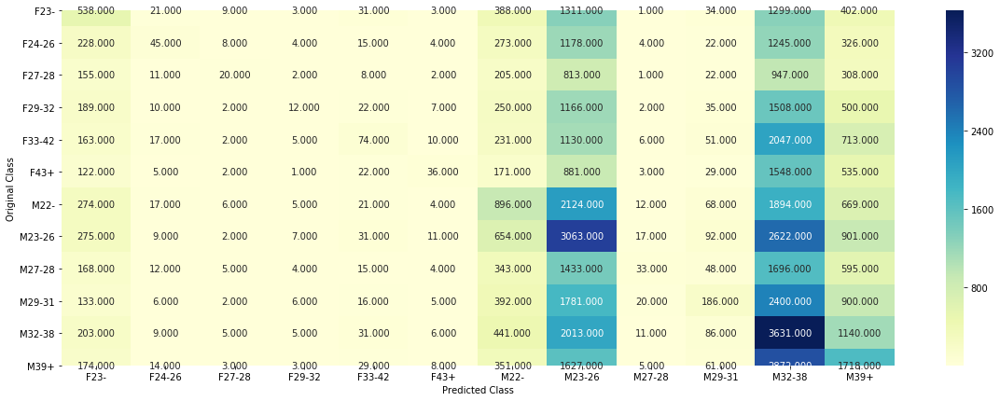

-------------------- Precision matrix (Columm Sum=1) --------------------


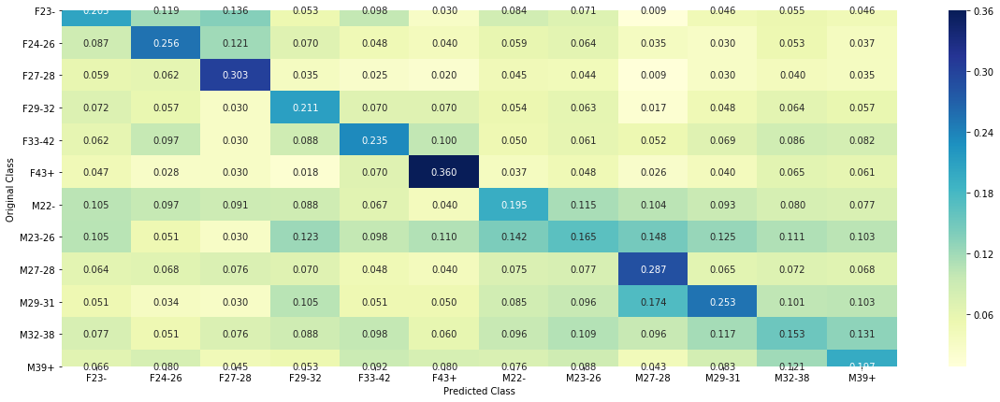

-------------------- Recall matrix (Row sum=1) --------------------


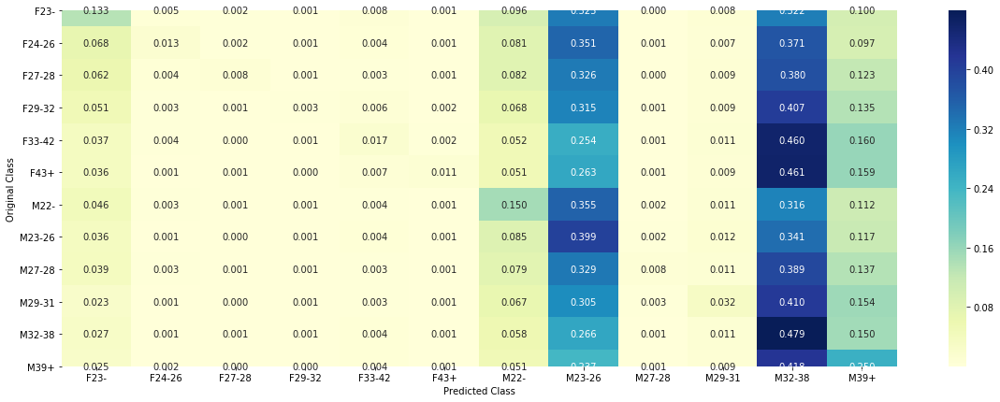

CV Log Loss : 2.395120537544309
-------------------- Confusion matrix --------------------


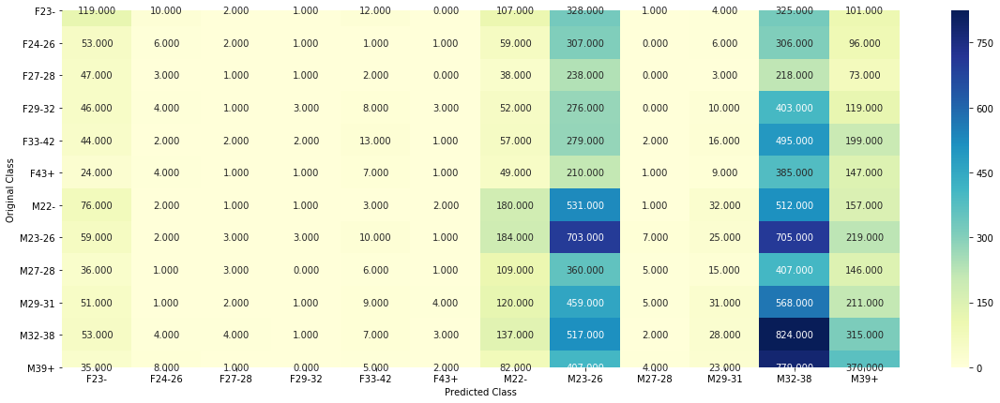

-------------------- Precision matrix (Columm Sum=1) --------------------


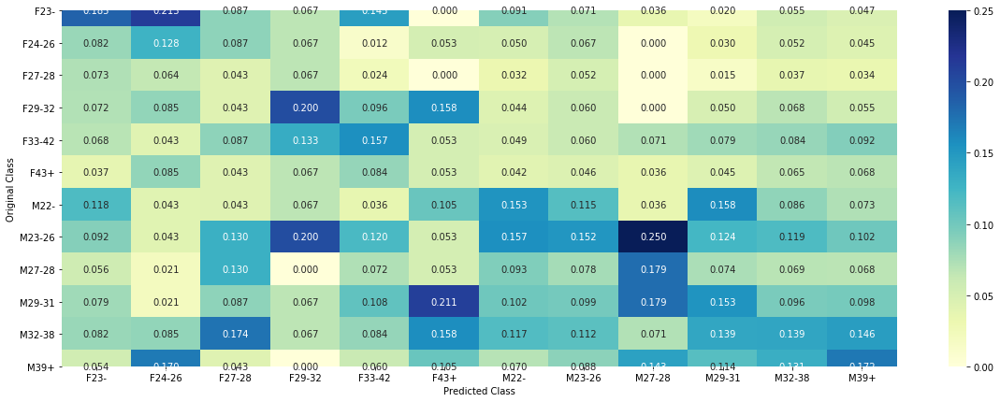

-------------------- Recall matrix (Row sum=1) --------------------


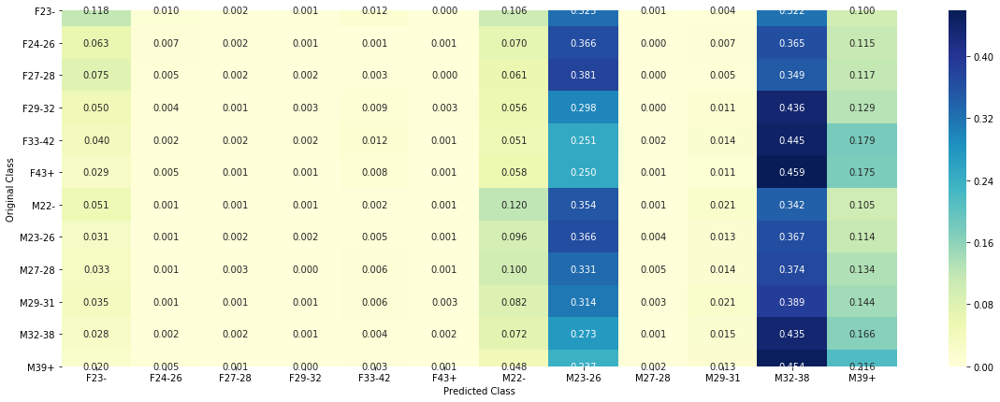

In [296]:
print("Train Log Loss :",log_loss(Y_all_train, xgb_no_events_pred_train))
plot_confusion_matrix(Y_all_train,y_pred_no_events_train_classes_xgb)

print("="*60)

print("CV Log Loss :",log_loss(Y_all_cv, xgb_no_events_pred_cv))
plot_confusion_matrix(Y_all_cv,y_pred_no_events_cv_classes_xgb)

In [297]:
y_no_events_pred_xgboost = xgb_no_events_sig_clf.predict_proba(X_no_events_test)

In [298]:
# Multilabel class probalities are predicted
prediction_no_events_xgb = pd.DataFrame(y_no_events_pred_xgboost,index = no_events_data_test.index,columns=targetencoder.classes_)
prediction_no_events_xgb.head()
prediction_no_events_xgb.to_csv("Predictions/prediction_no_events_xgb.csv")

#### 5.1.5. Random Forest

In [181]:
from sklearn.ensemble import RandomForestClassifier
max_depth = [3, 4, 5, 6]
n_estimator = [350,450,550]
for depth in max_depth:
    for estimator in n_estimator:
        rf_no_events_clf=RandomForestClassifier(n_estimators=estimator,n_jobs=-1, max_depth=depth)
        rf_no_events_clf.fit(X_all_train, Y_all_train)
        rf_no_events_sig_clf = CalibratedClassifierCV(rf_no_events_clf, method="sigmoid")
        rf_no_events_sig_clf.fit(X_all_train, Y_all_train)
        rf_no_events_predict_y = rf_no_events_sig_clf.predict_proba(X_all_cv)
        print ('log_loss for n_estimator = ',estimator,'and maxdepth =',depth,'is',log_loss(Y_all_cv, rf_no_events__predict_y, labels=rf_no_events_clf.classes_, eps=1e-15))

log_loss for n_estimator =  350 and maxdepth = 3 is 2.397361243391592
log_loss for n_estimator =  450 and maxdepth = 3 is 2.3969469106584156
log_loss for n_estimator =  550 and maxdepth = 3 is 2.3964033137049454
log_loss for n_estimator =  350 and maxdepth = 4 is 2.3970872500512916
log_loss for n_estimator =  450 and maxdepth = 4 is 2.396206333390335
log_loss for n_estimator =  550 and maxdepth = 4 is 2.396180574192794
log_loss for n_estimator =  350 and maxdepth = 5 is 2.3960099566379136
log_loss for n_estimator =  450 and maxdepth = 5 is 2.395699885064684
log_loss for n_estimator =  550 and maxdepth = 5 is 2.3959056435771715
log_loss for n_estimator =  350 and maxdepth = 6 is 2.3955135928858557
log_loss for n_estimator =  450 and maxdepth = 6 is 2.3952124925686045
log_loss for n_estimator =  550 and maxdepth = 6 is 2.3956913386286205


In [184]:
rf_no_events_clf=RandomForestClassifier(n_estimators=350,n_jobs=-1, max_depth=5)
rf_no_events_clf.fit(X_all_train, Y_all_train)
rf_no_events_sig_clf = CalibratedClassifierCV(rf_no_events_clf, method="sigmoid")
rf_no_events_sig_clf.fit(X_all_train, Y_all_train)
rf_no_events_predict_y = rf_no_events_sig_clf.predict_proba(X_all_cv)
print ('log_loss for n_estimator = ',estimator,'and maxdepth =',depth,'is',log_loss(Y_all_cv, rf_no_events_predict_y, labels=rf_no_events_clf.classes_, eps=1e-15))

log_loss for n_estimator =  550 and maxdepth = 6 is 2.3958202185243205


In [185]:
rf_no_events_pred_train = rf_no_events_sig_clf.predict_proba(X_all_train)
print("Train Log-Loss is",log_loss(Y_all_train, rf_no_events_pred_train, labels=rf_no_events_clf.classes_, eps=1e-15))
rf_no_events_pred_cv = rf_no_events_sig_clf.predict_proba(X_all_cv)
print("CV Log-Loss is",log_loss(Y_all_cv, rf_no_events_pred_cv, labels=rf_no_events_clf.classes_, eps=1e-15))

Train Log-Loss is 2.387445232067769
CV Log-Loss is 2.3958202185243205


In [189]:
y_pred_no_events_train_classes_rf = np.argmax(rf_no_events_pred_train, axis=1)
y_pred_no_events_cv_classes_rf = np.argmax(rf_no_events_pred_cv, axis=1)

Train Log Loss : 2.387445232067769
-------------------- Confusion matrix --------------------


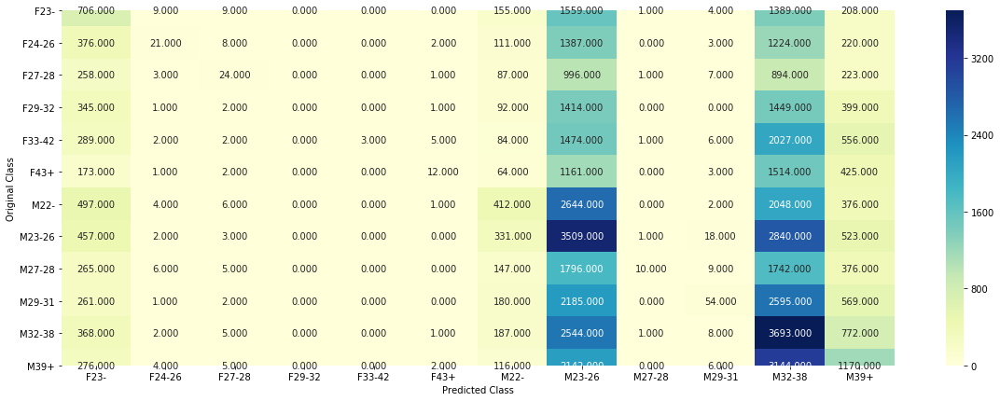

-------------------- Precision matrix (Columm Sum=1) --------------------


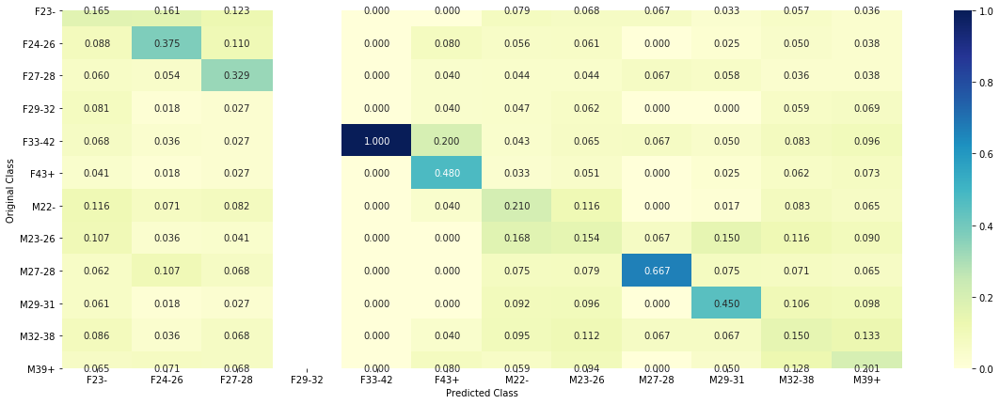

-------------------- Recall matrix (Row sum=1) --------------------


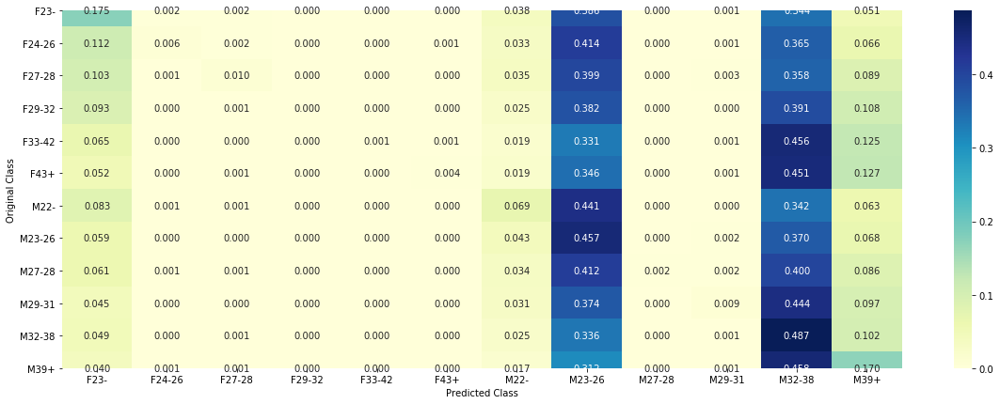

CV Log Loss : 2.3958202185243205
-------------------- Confusion matrix --------------------


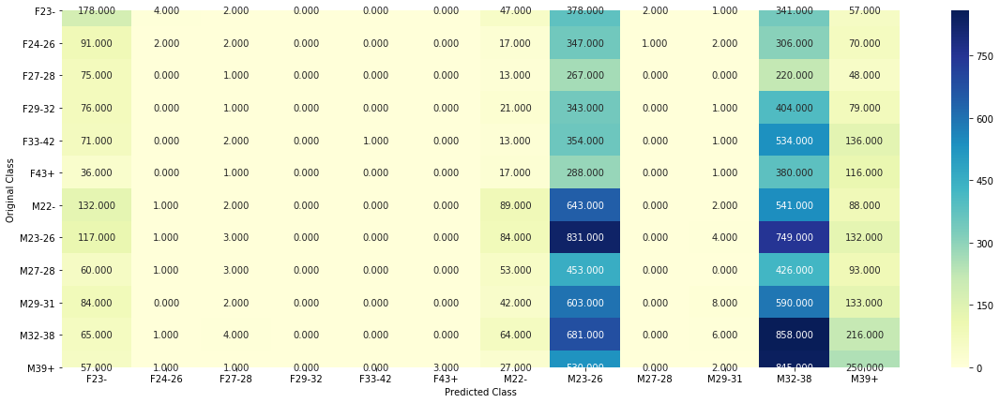

-------------------- Precision matrix (Columm Sum=1) --------------------


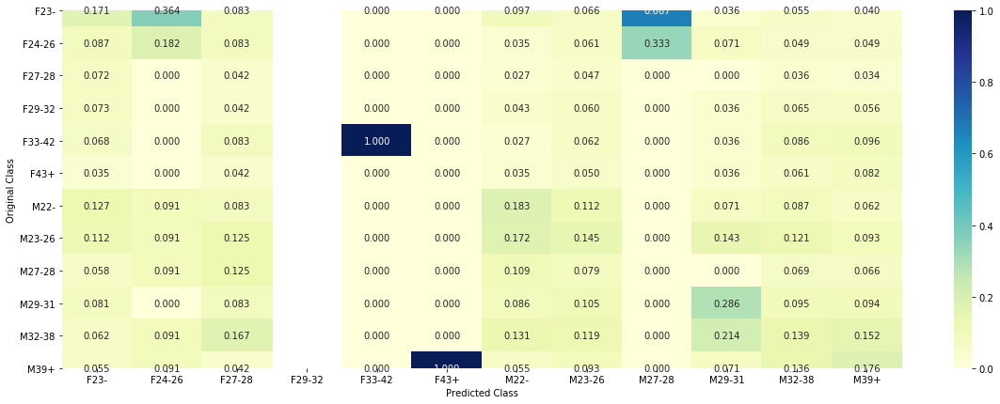

-------------------- Recall matrix (Row sum=1) --------------------


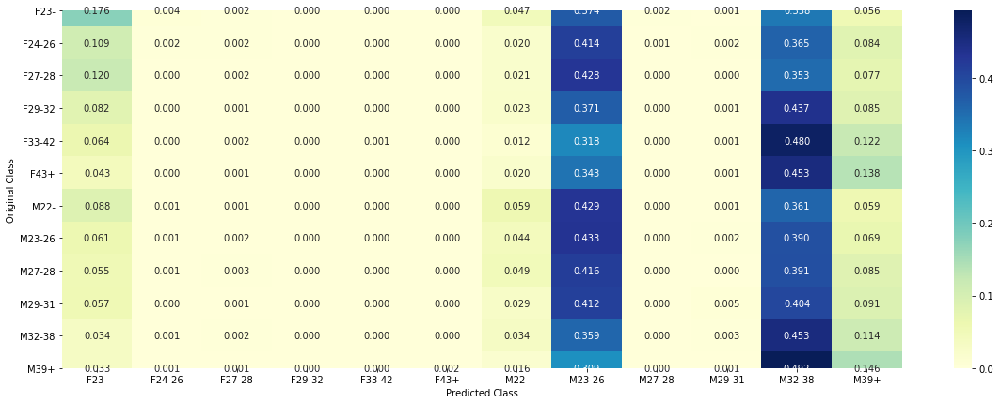

In [190]:
print("Train Log Loss :",log_loss(Y_all_train, rf_no_events_pred_train))
plot_confusion_matrix(Y_all_train,y_pred_no_events_train_classes_rf)

print("="*60)

print("CV Log Loss :",log_loss(Y_all_cv, rf_no_events_pred_cv))
plot_confusion_matrix(Y_all_cv,y_pred_no_events_cv_classes_rf)

In [191]:
y_no_events_pred_random_forest = rf_no_events_sig_clf.predict_proba(X_no_events_test)

In [299]:
# Multilabel class probalities are predicted
prediction_no_events_rf = pd.DataFrame(y_no_events_pred_random_forest,index = no_events_data_test.index,columns=targetencoder.classes_)
prediction_no_events_rf.head()
prediction_no_events_rf.to_csv("Predictions/prediction_no_events_rf.csv")

#### 5.1.6. Decision Tree

In [197]:
from sklearn.tree import DecisionTreeClassifier
max_depth = [3, 4, 5, 6]
min_samples_split_values = [5,10,100,500]
for depth in max_depth:
    for min_sample in min_samples_split_values:
        dt_no_events_clf=DecisionTreeClassifier(min_samples_split=min_sample,max_depth=depth,class_weight='balanced')
        dt_no_events_clf.fit(X_all_train, Y_all_train)
        dt_no_events_sig_clf = CalibratedClassifierCV(dt_no_events_clf, method="sigmoid")
        dt_no_events_sig_clf.fit(X_all_train, Y_all_train)
        dt_no_events_predict_y = dt_no_events_sig_clf.predict_proba(X_all_cv)
        print ('log_loss for min_sample_split = ',min_sample,'and maxdepth =',depth,'is',log_loss(Y_all_cv, dt_no_events_predict_y, labels=dt_no_events_clf.classes_, eps=1e-15))

log_loss for min_sample_split =  5 and maxdepth = 3 is 2.410057339012505
log_loss for min_sample_split =  10 and maxdepth = 3 is 2.410057339012505
log_loss for min_sample_split =  100 and maxdepth = 3 is 2.410057339012505
log_loss for min_sample_split =  500 and maxdepth = 3 is 2.410057339012505
log_loss for min_sample_split =  5 and maxdepth = 4 is 2.4063630303784396
log_loss for min_sample_split =  10 and maxdepth = 4 is 2.4063630303784396
log_loss for min_sample_split =  100 and maxdepth = 4 is 2.4063630303784396
log_loss for min_sample_split =  500 and maxdepth = 4 is 2.4063630303784396
log_loss for min_sample_split =  5 and maxdepth = 5 is 2.4040081530200292
log_loss for min_sample_split =  10 and maxdepth = 5 is 2.4040081530200292
log_loss for min_sample_split =  100 and maxdepth = 5 is 2.4040081530200292
log_loss for min_sample_split =  500 and maxdepth = 5 is 2.4040081530200292
log_loss for min_sample_split =  5 and maxdepth = 6 is 2.402481529173549
log_loss for min_sample_spli

In [199]:
dt_no_events_clf=DecisionTreeClassifier(min_samples_split=100,max_depth=5,class_weight='balanced')
dt_no_events_clf.fit(X_all_train, Y_all_train)
dt_no_events_sig_clf = CalibratedClassifierCV(dt_no_events_clf, method="sigmoid")
dt_no_events_sig_clf.fit(X_all_train, Y_all_train)
dt_no_events_predict_y = dt_no_events_sig_clf.predict_proba(X_all_cv)
print ('log_loss for min_sample_split = ',100,'and maxdepth =',5,'is',log_loss(Y_all_cv, dt_no_events_predict_y, labels=dt_no_events_clf.classes_, eps=1e-15))

log_loss for min_sample_split =  100 and maxdepth = 5 is 2.4040081530200292


In [200]:
dt_no_events_pred_train = dt_no_events_sig_clf.predict_proba(X_all_train)
print("Train Log-Loss is",log_loss(Y_all_train, dt_no_events_pred_train, labels=dt_no_events_clf.classes_, eps=1e-15))
dt_no_events_pred_cv = dt_no_events_sig_clf.predict_proba(X_all_cv)
print("CV Log-Loss is",log_loss(Y_all_cv, dt_no_events_pred_cv, labels=dt_no_events_clf.classes_, eps=1e-15))

Train Log-Loss is 2.402364665110147
CV Log-Loss is 2.4040081530200292


In [201]:
y_pred_no_events_train_classes_dt = np.argmax(dt_no_events_pred_train, axis=1)
y_pred_no_events_cv_classes_dt = np.argmax(dt_no_events_pred_cv, axis=1)

Train Log Loss : 2.402364665110147
-------------------- Confusion matrix --------------------


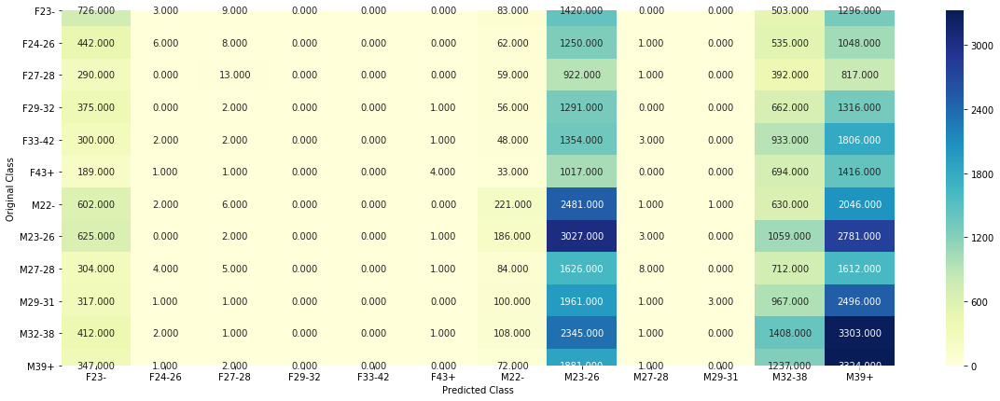

-------------------- Precision matrix (Columm Sum=1) --------------------


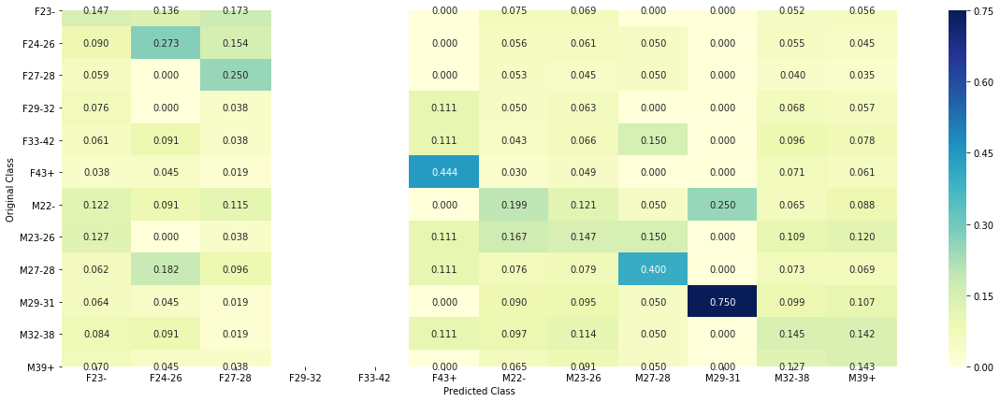

-------------------- Recall matrix (Row sum=1) --------------------


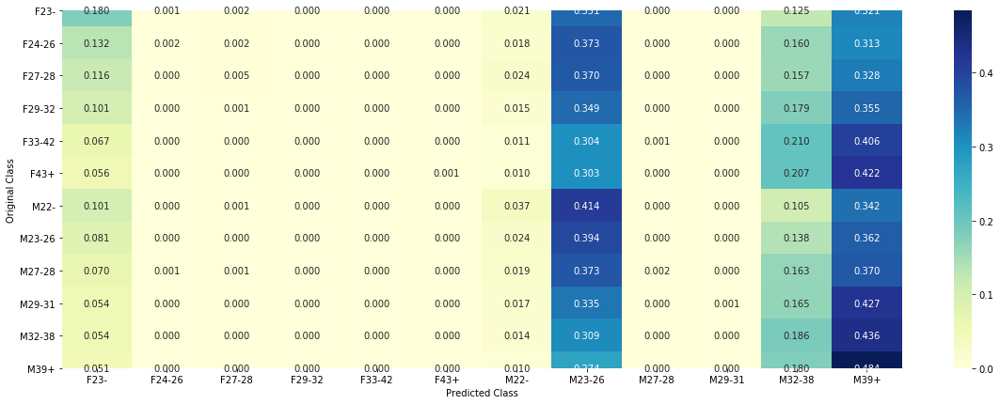

CV Log Loss : 2.4040081530200292
-------------------- Confusion matrix --------------------


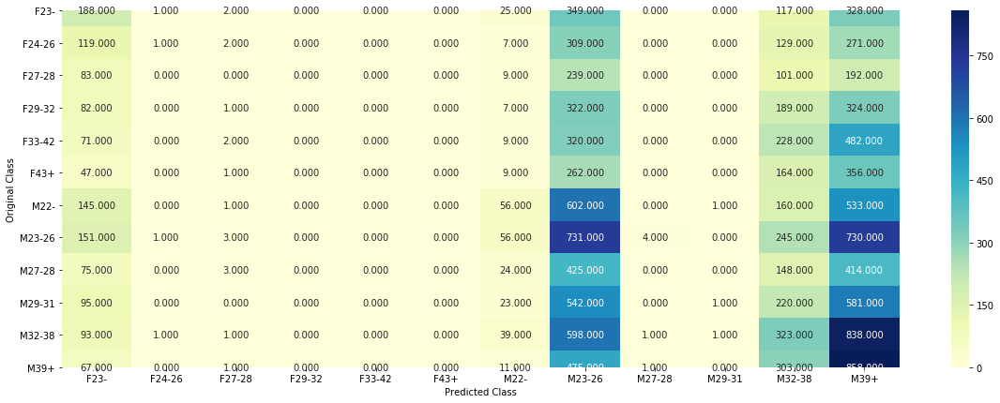

-------------------- Precision matrix (Columm Sum=1) --------------------


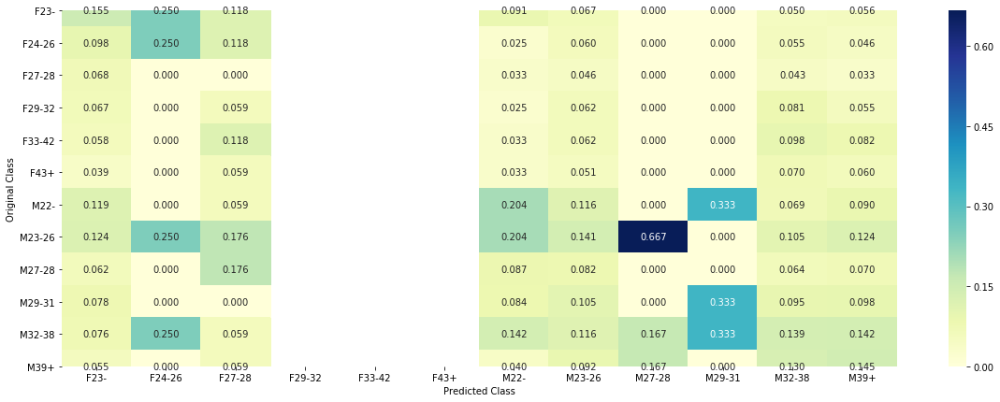

-------------------- Recall matrix (Row sum=1) --------------------


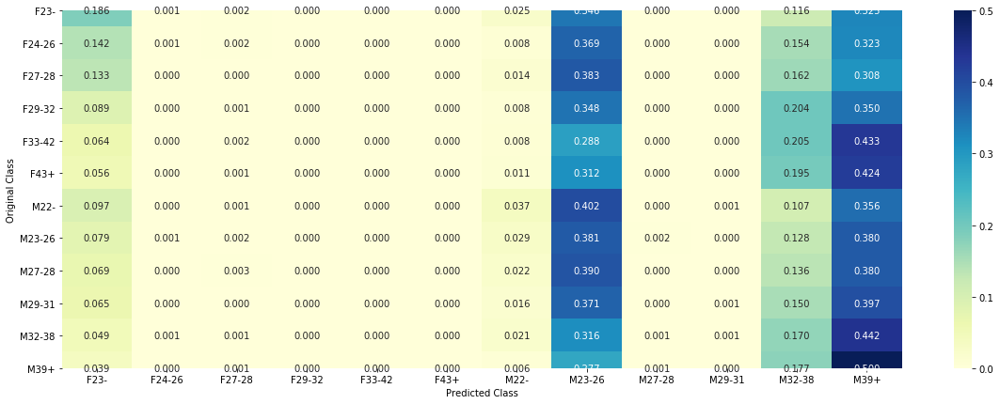

In [202]:
print("Train Log Loss :",log_loss(Y_all_train, dt_no_events_pred_train))
plot_confusion_matrix(Y_all_train,y_pred_no_events_train_classes_dt)

print("="*60)

print("CV Log Loss :",log_loss(Y_all_cv, dt_no_events_pred_cv))
plot_confusion_matrix(Y_all_cv,y_pred_no_events_cv_classes_dt)

In [269]:
y_no_events_pred_decision_tree = dt_no_events_sig_clf.predict_proba(X_no_events_test)

In [300]:
# Multilabel class probalities are predicted
prediction_no_events_dt = pd.DataFrame(y_no_events_pred_decision_tree,index = no_events_data_test.index,columns=targetencoder.classes_)
prediction_no_events_dt.head()
prediction_no_events_dt.to_csv("Predictions/prediction_no_events_dt.csv")

#### 5.1.7. Deep Learning - Neural Networks

##### Neural network 1
The train data is trained with the below neural network model and validate against cv with different seed for train and test split. For prediction we are considering the average of model for each seed

In [106]:
# #Loading the models
# model_1 = []
# for i in range(5):
#     model_1.append(load_model('Models/no_events_1/no_events_nn_1_'+str(i+1)+'.h5'))

In [512]:
%load_ext tensorboard
early_stop_1=EarlyStopping(monitor='val_loss',patience=5,restore_best_weights=True)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [506]:
#https://www.kaggle.com/c/talkingdata-mobile-user-demographics/discussion/23424
#Network architecture is refered from the above kaggle link
#Defining the model
def model_no_events_nn_1(input_shape):
    model = Sequential()
    model.add(Dense(256, input_dim=input_shape))
    model.add(PReLU())
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(64))
    model.add(PReLU())
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(12))
    model.add(Activation('softmax'))
    model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
    return model

In [507]:
#Model Summary
model_no_events_1=model_no_events_nn_1(x_ohe_train.shape[1])
model_no_events_1.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               443136    
_________________________________________________________________
p_re_lu_1 (PReLU)            (None, 256)               256       
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448     
_________________________________________________________________
p_re_lu_2 (PReLU)            (None, 64)                64        
_________________________________________________________________
batch_normalization_2 (Batch (None, 64)               

In [513]:
#Running the model with different seeds
seeds=[18,7,36,57,73]
model_1=[]
avg_cv_loss=0
for i in range(len(seeds)):
    train, cv, y_train, y_cv = train_test_split(x_ohe_train,Y_all,stratify=Y_all,test_size=0.15,random_state=seeds[i])
    y_train_nn=np_utils.to_categorical(y_train)
    y_cv_nn=np_utils.to_categorical(y_cv)
    model=model_no_events_nn_1(train.shape[1])
    logdir = os.path.join("logs_no_events_1","Model_no_events_1."+str(i+1))
    t_callback=TensorBoard(log_dir=logdir)
    model.fit(train, y_train_nn, batch_size=350, epochs=30, verbose=1, validation_data=(cv, y_cv_nn),callbacks=[early_stop_1,t_callback])
    model_cv_prediction=model.predict_proba(cv)
    cv_loss=log_loss(y_cv, model_cv_prediction)
    print("CV Log Loss of Best Weights Model in Current Run: ",cv_loss)
    model_1.append(model)
    avg_cv_loss+=cv_loss
avg_cv_loss/=len(seeds)
print("Average CV Loss of "+str(len(seeds))+" Runs :",avg_cv_loss)

Train on 63448 samples, validate on 11197 samples
Epoch 1/30
63448/63448 [==============================] - ETA: 1:53 - loss: 3.9864 - accuracy: 0.06 - ETA: 43s - loss: 3.8690 - accuracy: 0.0657 - ETA: 23s - loss: 3.7506 - accuracy: 0.077 - ETA: 18s - loss: 3.7320 - accuracy: 0.080 - ETA: 14s - loss: 3.6947 - accuracy: 0.082 - ETA: 12s - loss: 3.6691 - accuracy: 0.082 - ETA: 10s - loss: 3.6305 - accuracy: 0.085 - ETA: 9s - loss: 3.6101 - accuracy: 0.084 - ETA: 8s - loss: 3.5836 - accuracy: 0.08 - ETA: 7s - loss: 3.5520 - accuracy: 0.08 - ETA: 6s - loss: 3.5325 - accuracy: 0.08 - ETA: 6s - loss: 3.5132 - accuracy: 0.08 - ETA: 6s - loss: 3.4906 - accuracy: 0.08 - ETA: 5s - loss: 3.4709 - accuracy: 0.08 - ETA: 5s - loss: 3.4581 - accuracy: 0.08 - ETA: 5s - loss: 3.4470 - accuracy: 0.08 - ETA: 4s - loss: 3.4284 - accuracy: 0.08 - ETA: 4s - loss: 3.4129 - accuracy: 0.09 - ETA: 4s - loss: 3.3933 - accuracy: 0.09 - ETA: 4s - loss: 3.3771 - accuracy: 0.09 - ETA: 4s - loss: 3.3597 - accuracy: 0

63448/63448 [==============================] - ETA: 4s - loss: 2.4238 - accuracy: 0.17 - ETA: 3s - loss: 2.4666 - accuracy: 0.14 - ETA: 3s - loss: 2.4735 - accuracy: 0.13 - ETA: 3s - loss: 2.4660 - accuracy: 0.13 - ETA: 3s - loss: 2.4626 - accuracy: 0.14 - ETA: 3s - loss: 2.4612 - accuracy: 0.13 - ETA: 3s - loss: 2.4588 - accuracy: 0.13 - ETA: 3s - loss: 2.4577 - accuracy: 0.14 - ETA: 3s - loss: 2.4555 - accuracy: 0.13 - ETA: 3s - loss: 2.4578 - accuracy: 0.13 - ETA: 3s - loss: 2.4591 - accuracy: 0.13 - ETA: 3s - loss: 2.4581 - accuracy: 0.13 - ETA: 3s - loss: 2.4585 - accuracy: 0.13 - ETA: 2s - loss: 2.4577 - accuracy: 0.13 - ETA: 2s - loss: 2.4559 - accuracy: 0.13 - ETA: 2s - loss: 2.4540 - accuracy: 0.13 - ETA: 2s - loss: 2.4549 - accuracy: 0.13 - ETA: 2s - loss: 2.4533 - accuracy: 0.13 - ETA: 2s - loss: 2.4523 - accuracy: 0.13 - ETA: 2s - loss: 2.4532 - accuracy: 0.13 - ETA: 2s - loss: 2.4525 - accuracy: 0.13 - ETA: 2s - loss: 2.4504 - accuracy: 0.14 - ETA: 2s - loss: 2.4500 - accu

63448/63448 [==============================] - ETA: 4s - loss: 2.3825 - accuracy: 0.14 - ETA: 4s - loss: 2.3941 - accuracy: 0.13 - ETA: 4s - loss: 2.3807 - accuracy: 0.15 - ETA: 4s - loss: 2.3861 - accuracy: 0.15 - ETA: 4s - loss: 2.3861 - accuracy: 0.15 - ETA: 4s - loss: 2.3866 - accuracy: 0.15 - ETA: 4s - loss: 2.3848 - accuracy: 0.15 - ETA: 4s - loss: 2.3884 - accuracy: 0.15 - ETA: 3s - loss: 2.3865 - accuracy: 0.16 - ETA: 3s - loss: 2.3887 - accuracy: 0.16 - ETA: 3s - loss: 2.3893 - accuracy: 0.16 - ETA: 3s - loss: 2.3924 - accuracy: 0.15 - ETA: 3s - loss: 2.3934 - accuracy: 0.15 - ETA: 3s - loss: 2.3935 - accuracy: 0.16 - ETA: 3s - loss: 2.3927 - accuracy: 0.16 - ETA: 3s - loss: 2.3941 - accuracy: 0.15 - ETA: 3s - loss: 2.3937 - accuracy: 0.15 - ETA: 3s - loss: 2.3934 - accuracy: 0.15 - ETA: 3s - loss: 2.3924 - accuracy: 0.15 - ETA: 3s - loss: 2.3914 - accuracy: 0.15 - ETA: 3s - loss: 2.3910 - accuracy: 0.15 - ETA: 3s - loss: 2.3911 - accuracy: 0.15 - ETA: 3s - loss: 2.3908 - accu

63448/63448 [==============================] - ETA: 3s - loss: 2.3821 - accuracy: 0.14 - ETA: 3s - loss: 2.3839 - accuracy: 0.15 - ETA: 3s - loss: 2.3753 - accuracy: 0.16 - ETA: 3s - loss: 2.3800 - accuracy: 0.16 - ETA: 3s - loss: 2.3787 - accuracy: 0.16 - ETA: 3s - loss: 2.3735 - accuracy: 0.16 - ETA: 3s - loss: 2.3735 - accuracy: 0.16 - ETA: 3s - loss: 2.3755 - accuracy: 0.16 - ETA: 3s - loss: 2.3761 - accuracy: 0.16 - ETA: 3s - loss: 2.3763 - accuracy: 0.16 - ETA: 3s - loss: 2.3746 - accuracy: 0.16 - ETA: 3s - loss: 2.3771 - accuracy: 0.16 - ETA: 3s - loss: 2.3766 - accuracy: 0.16 - ETA: 3s - loss: 2.3764 - accuracy: 0.16 - ETA: 2s - loss: 2.3763 - accuracy: 0.16 - ETA: 2s - loss: 2.3767 - accuracy: 0.16 - ETA: 2s - loss: 2.3776 - accuracy: 0.15 - ETA: 2s - loss: 2.3778 - accuracy: 0.16 - ETA: 2s - loss: 2.3779 - accuracy: 0.16 - ETA: 2s - loss: 2.3774 - accuracy: 0.16 - ETA: 2s - loss: 2.3773 - accuracy: 0.16 - ETA: 2s - loss: 2.3781 - accuracy: 0.16 - ETA: 2s - loss: 2.3782 - accu

63448/63448 [==============================] - ETA: 3s - loss: 2.3738 - accuracy: 0.13 - ETA: 3s - loss: 2.3752 - accuracy: 0.14 - ETA: 3s - loss: 2.3726 - accuracy: 0.15 - ETA: 3s - loss: 2.3781 - accuracy: 0.15 - ETA: 3s - loss: 2.3806 - accuracy: 0.15 - ETA: 3s - loss: 2.3805 - accuracy: 0.15 - ETA: 3s - loss: 2.3807 - accuracy: 0.15 - ETA: 3s - loss: 2.3827 - accuracy: 0.15 - ETA: 3s - loss: 2.3811 - accuracy: 0.15 - ETA: 3s - loss: 2.3801 - accuracy: 0.15 - ETA: 3s - loss: 2.3794 - accuracy: 0.15 - ETA: 3s - loss: 2.3790 - accuracy: 0.15 - ETA: 3s - loss: 2.3796 - accuracy: 0.15 - ETA: 3s - loss: 2.3793 - accuracy: 0.15 - ETA: 3s - loss: 2.3775 - accuracy: 0.16 - ETA: 3s - loss: 2.3771 - accuracy: 0.16 - ETA: 3s - loss: 2.3773 - accuracy: 0.16 - ETA: 3s - loss: 2.3778 - accuracy: 0.16 - ETA: 3s - loss: 2.3777 - accuracy: 0.16 - ETA: 3s - loss: 2.3778 - accuracy: 0.15 - ETA: 3s - loss: 2.3769 - accuracy: 0.15 - ETA: 3s - loss: 2.3770 - accuracy: 0.15 - ETA: 3s - loss: 2.3760 - accu

63448/63448 [==============================] - ETA: 3s - loss: 2.3717 - accuracy: 0.12 - ETA: 3s - loss: 2.3743 - accuracy: 0.16 - ETA: 3s - loss: 2.3688 - accuracy: 0.16 - ETA: 3s - loss: 2.3581 - accuracy: 0.17 - ETA: 3s - loss: 2.3562 - accuracy: 0.17 - ETA: 3s - loss: 2.3557 - accuracy: 0.17 - ETA: 3s - loss: 2.3549 - accuracy: 0.17 - ETA: 3s - loss: 2.3581 - accuracy: 0.17 - ETA: 3s - loss: 2.3582 - accuracy: 0.17 - ETA: 3s - loss: 2.3567 - accuracy: 0.17 - ETA: 3s - loss: 2.3560 - accuracy: 0.17 - ETA: 3s - loss: 2.3559 - accuracy: 0.17 - ETA: 3s - loss: 2.3557 - accuracy: 0.17 - ETA: 3s - loss: 2.3568 - accuracy: 0.17 - ETA: 2s - loss: 2.3572 - accuracy: 0.17 - ETA: 2s - loss: 2.3563 - accuracy: 0.16 - ETA: 2s - loss: 2.3564 - accuracy: 0.17 - ETA: 2s - loss: 2.3557 - accuracy: 0.17 - ETA: 2s - loss: 2.3560 - accuracy: 0.17 - ETA: 2s - loss: 2.3558 - accuracy: 0.17 - ETA: 2s - loss: 2.3571 - accuracy: 0.16 - ETA: 2s - loss: 2.3565 - accuracy: 0.16 - ETA: 2s - loss: 2.3554 - accu

Epoch 2/30
63448/63448 [==============================] - ETA: 3s - loss: 2.5723 - accuracy: 0.12 - ETA: 3s - loss: 2.5943 - accuracy: 0.11 - ETA: 3s - loss: 2.6089 - accuracy: 0.11 - ETA: 3s - loss: 2.6017 - accuracy: 0.11 - ETA: 3s - loss: 2.5967 - accuracy: 0.11 - ETA: 3s - loss: 2.5908 - accuracy: 0.11 - ETA: 3s - loss: 2.5908 - accuracy: 0.11 - ETA: 3s - loss: 2.5920 - accuracy: 0.11 - ETA: 3s - loss: 2.5933 - accuracy: 0.11 - ETA: 3s - loss: 2.5932 - accuracy: 0.11 - ETA: 3s - loss: 2.5916 - accuracy: 0.11 - ETA: 3s - loss: 2.5893 - accuracy: 0.11 - ETA: 3s - loss: 2.5825 - accuracy: 0.11 - ETA: 3s - loss: 2.5816 - accuracy: 0.11 - ETA: 2s - loss: 2.5810 - accuracy: 0.11 - ETA: 2s - loss: 2.5789 - accuracy: 0.12 - ETA: 2s - loss: 2.5747 - accuracy: 0.12 - ETA: 2s - loss: 2.5716 - accuracy: 0.12 - ETA: 2s - loss: 2.5711 - accuracy: 0.12 - ETA: 2s - loss: 2.5696 - accuracy: 0.12 - ETA: 2s - loss: 2.5704 - accuracy: 0.12 - ETA: 2s - loss: 2.5713 - accuracy: 0.12 - ETA: 2s - loss: 2.

63448/63448 [==============================] - ETA: 3s - loss: 2.3889 - accuracy: 0.14 - ETA: 3s - loss: 2.4028 - accuracy: 0.14 - ETA: 3s - loss: 2.3999 - accuracy: 0.14 - ETA: 3s - loss: 2.4030 - accuracy: 0.14 - ETA: 3s - loss: 2.3936 - accuracy: 0.15 - ETA: 3s - loss: 2.3950 - accuracy: 0.15 - ETA: 3s - loss: 2.3956 - accuracy: 0.15 - ETA: 3s - loss: 2.3959 - accuracy: 0.15 - ETA: 3s - loss: 2.3926 - accuracy: 0.15 - ETA: 3s - loss: 2.3898 - accuracy: 0.15 - ETA: 3s - loss: 2.3882 - accuracy: 0.15 - ETA: 3s - loss: 2.3874 - accuracy: 0.15 - ETA: 3s - loss: 2.3881 - accuracy: 0.15 - ETA: 3s - loss: 2.3885 - accuracy: 0.15 - ETA: 3s - loss: 2.3895 - accuracy: 0.15 - ETA: 2s - loss: 2.3898 - accuracy: 0.15 - ETA: 2s - loss: 2.3897 - accuracy: 0.15 - ETA: 2s - loss: 2.3898 - accuracy: 0.15 - ETA: 2s - loss: 2.3900 - accuracy: 0.15 - ETA: 2s - loss: 2.3889 - accuracy: 0.15 - ETA: 2s - loss: 2.3885 - accuracy: 0.15 - ETA: 2s - loss: 2.3884 - accuracy: 0.15 - ETA: 2s - loss: 2.3886 - accu

63448/63448 [==============================] - ETA: 3s - loss: 2.3646 - accuracy: 0.16 - ETA: 3s - loss: 2.3704 - accuracy: 0.16 - ETA: 4s - loss: 2.3723 - accuracy: 0.16 - ETA: 4s - loss: 2.3680 - accuracy: 0.16 - ETA: 3s - loss: 2.3680 - accuracy: 0.16 - ETA: 3s - loss: 2.3677 - accuracy: 0.16 - ETA: 3s - loss: 2.3663 - accuracy: 0.16 - ETA: 3s - loss: 2.3696 - accuracy: 0.16 - ETA: 3s - loss: 2.3696 - accuracy: 0.16 - ETA: 3s - loss: 2.3707 - accuracy: 0.16 - ETA: 3s - loss: 2.3715 - accuracy: 0.16 - ETA: 3s - loss: 2.3694 - accuracy: 0.16 - ETA: 3s - loss: 2.3697 - accuracy: 0.16 - ETA: 3s - loss: 2.3698 - accuracy: 0.16 - ETA: 3s - loss: 2.3698 - accuracy: 0.16 - ETA: 3s - loss: 2.3708 - accuracy: 0.16 - ETA: 3s - loss: 2.3702 - accuracy: 0.16 - ETA: 2s - loss: 2.3697 - accuracy: 0.16 - ETA: 2s - loss: 2.3697 - accuracy: 0.16 - ETA: 2s - loss: 2.3702 - accuracy: 0.16 - ETA: 2s - loss: 2.3704 - accuracy: 0.16 - ETA: 2s - loss: 2.3710 - accuracy: 0.16 - ETA: 2s - loss: 2.3713 - accu

63448/63448 [==============================] - ETA: 3s - loss: 2.3658 - accuracy: 0.16 - ETA: 3s - loss: 2.3418 - accuracy: 0.16 - ETA: 3s - loss: 2.3471 - accuracy: 0.17 - ETA: 3s - loss: 2.3465 - accuracy: 0.17 - ETA: 3s - loss: 2.3504 - accuracy: 0.17 - ETA: 3s - loss: 2.3579 - accuracy: 0.16 - ETA: 3s - loss: 2.3620 - accuracy: 0.16 - ETA: 3s - loss: 2.3607 - accuracy: 0.16 - ETA: 3s - loss: 2.3582 - accuracy: 0.16 - ETA: 3s - loss: 2.3579 - accuracy: 0.16 - ETA: 3s - loss: 2.3569 - accuracy: 0.16 - ETA: 3s - loss: 2.3573 - accuracy: 0.16 - ETA: 3s - loss: 2.3577 - accuracy: 0.16 - ETA: 2s - loss: 2.3576 - accuracy: 0.16 - ETA: 2s - loss: 2.3569 - accuracy: 0.16 - ETA: 2s - loss: 2.3567 - accuracy: 0.16 - ETA: 2s - loss: 2.3571 - accuracy: 0.16 - ETA: 2s - loss: 2.3585 - accuracy: 0.16 - ETA: 2s - loss: 2.3575 - accuracy: 0.16 - ETA: 2s - loss: 2.3575 - accuracy: 0.17 - ETA: 2s - loss: 2.3580 - accuracy: 0.16 - ETA: 2s - loss: 2.3581 - accuracy: 0.17 - ETA: 2s - loss: 2.3587 - accu

63448/63448 [==============================] - ETA: 1:17 - loss: 3.7238 - accuracy: 0.10 - ETA: 29s - loss: 3.7524 - accuracy: 0.0829 - ETA: 16s - loss: 3.7648 - accuracy: 0.081 - ETA: 11s - loss: 3.7216 - accuracy: 0.080 - ETA: 9s - loss: 3.6885 - accuracy: 0.082 - ETA: 8s - loss: 3.6437 - accuracy: 0.08 - ETA: 7s - loss: 3.6076 - accuracy: 0.08 - ETA: 6s - loss: 3.5702 - accuracy: 0.08 - ETA: 6s - loss: 3.5474 - accuracy: 0.08 - ETA: 5s - loss: 3.5190 - accuracy: 0.08 - ETA: 5s - loss: 3.4915 - accuracy: 0.08 - ETA: 5s - loss: 3.4708 - accuracy: 0.08 - ETA: 4s - loss: 3.4489 - accuracy: 0.09 - ETA: 4s - loss: 3.4332 - accuracy: 0.09 - ETA: 4s - loss: 3.4139 - accuracy: 0.09 - ETA: 4s - loss: 3.3935 - accuracy: 0.09 - ETA: 4s - loss: 3.3736 - accuracy: 0.09 - ETA: 3s - loss: 3.3574 - accuracy: 0.09 - ETA: 3s - loss: 3.3451 - accuracy: 0.09 - ETA: 3s - loss: 3.3303 - accuracy: 0.09 - ETA: 3s - loss: 3.3137 - accuracy: 0.09 - ETA: 3s - loss: 3.3005 - accuracy: 0.09 - ETA: 3s - loss: 3.2

63448/63448 [==============================] - ETA: 3s - loss: 2.4446 - accuracy: 0.11 - ETA: 3s - loss: 2.4532 - accuracy: 0.12 - ETA: 3s - loss: 2.4506 - accuracy: 0.13 - ETA: 3s - loss: 2.4479 - accuracy: 0.13 - ETA: 4s - loss: 2.4471 - accuracy: 0.13 - ETA: 4s - loss: 2.4474 - accuracy: 0.13 - ETA: 4s - loss: 2.4472 - accuracy: 0.13 - ETA: 4s - loss: 2.4464 - accuracy: 0.13 - ETA: 4s - loss: 2.4491 - accuracy: 0.13 - ETA: 4s - loss: 2.4528 - accuracy: 0.13 - ETA: 4s - loss: 2.4500 - accuracy: 0.13 - ETA: 4s - loss: 2.4438 - accuracy: 0.13 - ETA: 4s - loss: 2.4452 - accuracy: 0.13 - ETA: 4s - loss: 2.4432 - accuracy: 0.13 - ETA: 4s - loss: 2.4433 - accuracy: 0.13 - ETA: 3s - loss: 2.4443 - accuracy: 0.13 - ETA: 3s - loss: 2.4442 - accuracy: 0.13 - ETA: 3s - loss: 2.4446 - accuracy: 0.13 - ETA: 3s - loss: 2.4456 - accuracy: 0.13 - ETA: 3s - loss: 2.4454 - accuracy: 0.13 - ETA: 3s - loss: 2.4444 - accuracy: 0.13 - ETA: 3s - loss: 2.4446 - accuracy: 0.13 - ETA: 3s - loss: 2.4441 - accu

63448/63448 [==============================] - ETA: 3s - loss: 2.3867 - accuracy: 0.13 - ETA: 3s - loss: 2.3934 - accuracy: 0.14 - ETA: 3s - loss: 2.3904 - accuracy: 0.15 - ETA: 3s - loss: 2.3850 - accuracy: 0.15 - ETA: 3s - loss: 2.3852 - accuracy: 0.15 - ETA: 3s - loss: 2.3857 - accuracy: 0.15 - ETA: 3s - loss: 2.3906 - accuracy: 0.15 - ETA: 3s - loss: 2.3930 - accuracy: 0.15 - ETA: 3s - loss: 2.3899 - accuracy: 0.15 - ETA: 3s - loss: 2.3899 - accuracy: 0.15 - ETA: 3s - loss: 2.3933 - accuracy: 0.15 - ETA: 3s - loss: 2.3932 - accuracy: 0.15 - ETA: 3s - loss: 2.3924 - accuracy: 0.15 - ETA: 2s - loss: 2.3917 - accuracy: 0.15 - ETA: 2s - loss: 2.3922 - accuracy: 0.15 - ETA: 2s - loss: 2.3907 - accuracy: 0.15 - ETA: 2s - loss: 2.3909 - accuracy: 0.15 - ETA: 2s - loss: 2.3890 - accuracy: 0.15 - ETA: 2s - loss: 2.3890 - accuracy: 0.15 - ETA: 2s - loss: 2.3902 - accuracy: 0.15 - ETA: 2s - loss: 2.3916 - accuracy: 0.15 - ETA: 2s - loss: 2.3910 - accuracy: 0.15 - ETA: 2s - loss: 2.3901 - accu

63448/63448 [==============================] - ETA: 4s - loss: 2.3923 - accuracy: 0.16 - ETA: 4s - loss: 2.4161 - accuracy: 0.15 - ETA: 4s - loss: 2.4052 - accuracy: 0.15 - ETA: 4s - loss: 2.3976 - accuracy: 0.14 - ETA: 4s - loss: 2.3913 - accuracy: 0.15 - ETA: 4s - loss: 2.3893 - accuracy: 0.15 - ETA: 4s - loss: 2.3917 - accuracy: 0.15 - ETA: 4s - loss: 2.3911 - accuracy: 0.15 - ETA: 4s - loss: 2.3899 - accuracy: 0.15 - ETA: 4s - loss: 2.3856 - accuracy: 0.15 - ETA: 4s - loss: 2.3862 - accuracy: 0.15 - ETA: 3s - loss: 2.3864 - accuracy: 0.15 - ETA: 3s - loss: 2.3837 - accuracy: 0.15 - ETA: 3s - loss: 2.3845 - accuracy: 0.15 - ETA: 3s - loss: 2.3851 - accuracy: 0.15 - ETA: 3s - loss: 2.3855 - accuracy: 0.15 - ETA: 3s - loss: 2.3847 - accuracy: 0.15 - ETA: 3s - loss: 2.3851 - accuracy: 0.15 - ETA: 3s - loss: 2.3839 - accuracy: 0.15 - ETA: 3s - loss: 2.3842 - accuracy: 0.15 - ETA: 3s - loss: 2.3842 - accuracy: 0.15 - ETA: 3s - loss: 2.3824 - accuracy: 0.15 - ETA: 3s - loss: 2.3815 - accu

63448/63448 [==============================] - ETA: 4s - loss: 2.3931 - accuracy: 0.16 - ETA: 4s - loss: 2.3800 - accuracy: 0.15 - ETA: 4s - loss: 2.3783 - accuracy: 0.15 - ETA: 3s - loss: 2.3696 - accuracy: 0.16 - ETA: 3s - loss: 2.3744 - accuracy: 0.16 - ETA: 3s - loss: 2.3669 - accuracy: 0.16 - ETA: 3s - loss: 2.3698 - accuracy: 0.16 - ETA: 3s - loss: 2.3695 - accuracy: 0.16 - ETA: 3s - loss: 2.3687 - accuracy: 0.16 - ETA: 3s - loss: 2.3674 - accuracy: 0.16 - ETA: 3s - loss: 2.3685 - accuracy: 0.16 - ETA: 3s - loss: 2.3686 - accuracy: 0.16 - ETA: 3s - loss: 2.3696 - accuracy: 0.16 - ETA: 3s - loss: 2.3695 - accuracy: 0.16 - ETA: 3s - loss: 2.3681 - accuracy: 0.16 - ETA: 3s - loss: 2.3689 - accuracy: 0.16 - ETA: 3s - loss: 2.3699 - accuracy: 0.16 - ETA: 3s - loss: 2.3699 - accuracy: 0.16 - ETA: 3s - loss: 2.3691 - accuracy: 0.16 - ETA: 2s - loss: 2.3701 - accuracy: 0.16 - ETA: 2s - loss: 2.3695 - accuracy: 0.16 - ETA: 2s - loss: 2.3692 - accuracy: 0.16 - ETA: 2s - loss: 2.3696 - accu

63448/63448 [==============================] - ETA: 4s - loss: 2.3794 - accuracy: 0.14 - ETA: 3s - loss: 2.3617 - accuracy: 0.17 - ETA: 3s - loss: 2.3573 - accuracy: 0.16 - ETA: 3s - loss: 2.3565 - accuracy: 0.16 - ETA: 3s - loss: 2.3615 - accuracy: 0.16 - ETA: 3s - loss: 2.3588 - accuracy: 0.16 - ETA: 3s - loss: 2.3599 - accuracy: 0.16 - ETA: 3s - loss: 2.3615 - accuracy: 0.16 - ETA: 3s - loss: 2.3592 - accuracy: 0.16 - ETA: 3s - loss: 2.3586 - accuracy: 0.16 - ETA: 3s - loss: 2.3606 - accuracy: 0.16 - ETA: 3s - loss: 2.3597 - accuracy: 0.17 - ETA: 3s - loss: 2.3579 - accuracy: 0.17 - ETA: 3s - loss: 2.3606 - accuracy: 0.16 - ETA: 3s - loss: 2.3598 - accuracy: 0.16 - ETA: 3s - loss: 2.3602 - accuracy: 0.16 - ETA: 3s - loss: 2.3607 - accuracy: 0.16 - ETA: 3s - loss: 2.3608 - accuracy: 0.16 - ETA: 2s - loss: 2.3609 - accuracy: 0.16 - ETA: 2s - loss: 2.3606 - accuracy: 0.16 - ETA: 2s - loss: 2.3601 - accuracy: 0.17 - ETA: 2s - loss: 2.3593 - accuracy: 0.16 - ETA: 2s - loss: 2.3607 - accu

63448/63448 [==============================] - ETA: 4s - loss: 2.5649 - accuracy: 0.11 - ETA: 4s - loss: 2.6109 - accuracy: 0.12 - ETA: 4s - loss: 2.6158 - accuracy: 0.11 - ETA: 4s - loss: 2.6071 - accuracy: 0.11 - ETA: 4s - loss: 2.5971 - accuracy: 0.11 - ETA: 4s - loss: 2.5838 - accuracy: 0.11 - ETA: 3s - loss: 2.5941 - accuracy: 0.11 - ETA: 3s - loss: 2.5923 - accuracy: 0.11 - ETA: 3s - loss: 2.5927 - accuracy: 0.11 - ETA: 3s - loss: 2.5930 - accuracy: 0.11 - ETA: 3s - loss: 2.5901 - accuracy: 0.11 - ETA: 3s - loss: 2.5884 - accuracy: 0.11 - ETA: 3s - loss: 2.5882 - accuracy: 0.11 - ETA: 3s - loss: 2.5863 - accuracy: 0.11 - ETA: 3s - loss: 2.5874 - accuracy: 0.11 - ETA: 3s - loss: 2.5869 - accuracy: 0.11 - ETA: 3s - loss: 2.5821 - accuracy: 0.11 - ETA: 3s - loss: 2.5808 - accuracy: 0.11 - ETA: 3s - loss: 2.5797 - accuracy: 0.11 - ETA: 3s - loss: 2.5778 - accuracy: 0.11 - ETA: 3s - loss: 2.5772 - accuracy: 0.11 - ETA: 3s - loss: 2.5761 - accuracy: 0.11 - ETA: 2s - loss: 2.5726 - accu

63448/63448 [==============================] - ETA: 4s - loss: 2.4154 - accuracy: 0.13 - ETA: 4s - loss: 2.4118 - accuracy: 0.13 - ETA: 4s - loss: 2.4060 - accuracy: 0.15 - ETA: 4s - loss: 2.4077 - accuracy: 0.15 - ETA: 4s - loss: 2.4039 - accuracy: 0.15 - ETA: 4s - loss: 2.4045 - accuracy: 0.15 - ETA: 3s - loss: 2.4053 - accuracy: 0.15 - ETA: 3s - loss: 2.4033 - accuracy: 0.15 - ETA: 3s - loss: 2.4032 - accuracy: 0.15 - ETA: 3s - loss: 2.4029 - accuracy: 0.15 - ETA: 3s - loss: 2.4032 - accuracy: 0.15 - ETA: 3s - loss: 2.4025 - accuracy: 0.15 - ETA: 3s - loss: 2.4034 - accuracy: 0.15 - ETA: 3s - loss: 2.4035 - accuracy: 0.15 - ETA: 3s - loss: 2.4043 - accuracy: 0.15 - ETA: 3s - loss: 2.4033 - accuracy: 0.15 - ETA: 3s - loss: 2.4031 - accuracy: 0.15 - ETA: 3s - loss: 2.4033 - accuracy: 0.15 - ETA: 3s - loss: 2.4028 - accuracy: 0.15 - ETA: 3s - loss: 2.4027 - accuracy: 0.15 - ETA: 3s - loss: 2.4032 - accuracy: 0.15 - ETA: 2s - loss: 2.4036 - accuracy: 0.15 - ETA: 2s - loss: 2.4037 - accu

63448/63448 [==============================] - ETA: 4s - loss: 2.3871 - accuracy: 0.18 - ETA: 4s - loss: 2.3816 - accuracy: 0.16 - ETA: 4s - loss: 2.3864 - accuracy: 0.15 - ETA: 4s - loss: 2.3908 - accuracy: 0.15 - ETA: 3s - loss: 2.3901 - accuracy: 0.15 - ETA: 3s - loss: 2.3882 - accuracy: 0.15 - ETA: 3s - loss: 2.3887 - accuracy: 0.15 - ETA: 3s - loss: 2.3894 - accuracy: 0.15 - ETA: 3s - loss: 2.3884 - accuracy: 0.15 - ETA: 3s - loss: 2.3889 - accuracy: 0.15 - ETA: 3s - loss: 2.3889 - accuracy: 0.15 - ETA: 3s - loss: 2.3886 - accuracy: 0.15 - ETA: 3s - loss: 2.3882 - accuracy: 0.15 - ETA: 3s - loss: 2.3885 - accuracy: 0.15 - ETA: 3s - loss: 2.3881 - accuracy: 0.15 - ETA: 3s - loss: 2.3885 - accuracy: 0.15 - ETA: 3s - loss: 2.3880 - accuracy: 0.15 - ETA: 3s - loss: 2.3882 - accuracy: 0.15 - ETA: 3s - loss: 2.3875 - accuracy: 0.15 - ETA: 2s - loss: 2.3872 - accuracy: 0.15 - ETA: 2s - loss: 2.3875 - accuracy: 0.15 - ETA: 2s - loss: 2.3880 - accuracy: 0.15 - ETA: 2s - loss: 2.3874 - accu

63448/63448 [==============================] - ETA: 4s - loss: 2.3755 - accuracy: 0.12 - ETA: 4s - loss: 2.3793 - accuracy: 0.14 - ETA: 4s - loss: 2.3900 - accuracy: 0.14 - ETA: 4s - loss: 2.3839 - accuracy: 0.14 - ETA: 4s - loss: 2.3820 - accuracy: 0.14 - ETA: 4s - loss: 2.3772 - accuracy: 0.14 - ETA: 4s - loss: 2.3734 - accuracy: 0.15 - ETA: 4s - loss: 2.3714 - accuracy: 0.15 - ETA: 4s - loss: 2.3712 - accuracy: 0.15 - ETA: 4s - loss: 2.3671 - accuracy: 0.16 - ETA: 3s - loss: 2.3667 - accuracy: 0.16 - ETA: 3s - loss: 2.3680 - accuracy: 0.16 - ETA: 3s - loss: 2.3686 - accuracy: 0.16 - ETA: 3s - loss: 2.3681 - accuracy: 0.16 - ETA: 3s - loss: 2.3673 - accuracy: 0.16 - ETA: 3s - loss: 2.3684 - accuracy: 0.16 - ETA: 3s - loss: 2.3693 - accuracy: 0.16 - ETA: 3s - loss: 2.3711 - accuracy: 0.16 - ETA: 3s - loss: 2.3714 - accuracy: 0.16 - ETA: 3s - loss: 2.3712 - accuracy: 0.16 - ETA: 3s - loss: 2.3716 - accuracy: 0.16 - ETA: 3s - loss: 2.3710 - accuracy: 0.16 - ETA: 3s - loss: 2.3707 - accu

63448/63448 [==============================] - ETA: 4s - loss: 2.3500 - accuracy: 0.18 - ETA: 4s - loss: 2.3642 - accuracy: 0.16 - ETA: 4s - loss: 2.3641 - accuracy: 0.17 - ETA: 4s - loss: 2.3610 - accuracy: 0.17 - ETA: 4s - loss: 2.3589 - accuracy: 0.17 - ETA: 4s - loss: 2.3564 - accuracy: 0.17 - ETA: 3s - loss: 2.3610 - accuracy: 0.16 - ETA: 3s - loss: 2.3609 - accuracy: 0.16 - ETA: 3s - loss: 2.3623 - accuracy: 0.16 - ETA: 3s - loss: 2.3625 - accuracy: 0.16 - ETA: 3s - loss: 2.3609 - accuracy: 0.16 - ETA: 3s - loss: 2.3602 - accuracy: 0.16 - ETA: 3s - loss: 2.3578 - accuracy: 0.17 - ETA: 3s - loss: 2.3568 - accuracy: 0.17 - ETA: 3s - loss: 2.3583 - accuracy: 0.17 - ETA: 3s - loss: 2.3596 - accuracy: 0.17 - ETA: 3s - loss: 2.3605 - accuracy: 0.16 - ETA: 3s - loss: 2.3607 - accuracy: 0.16 - ETA: 3s - loss: 2.3611 - accuracy: 0.16 - ETA: 3s - loss: 2.3633 - accuracy: 0.16 - ETA: 3s - loss: 2.3628 - accuracy: 0.16 - ETA: 3s - loss: 2.3635 - accuracy: 0.16 - ETA: 3s - loss: 2.3632 - accu

63448/63448 [==============================] - ETA: 4s - loss: 2.3580 - accuracy: 0.18 - ETA: 4s - loss: 2.3431 - accuracy: 0.17 - ETA: 4s - loss: 2.3551 - accuracy: 0.17 - ETA: 4s - loss: 2.3447 - accuracy: 0.17 - ETA: 4s - loss: 2.3440 - accuracy: 0.17 - ETA: 3s - loss: 2.3446 - accuracy: 0.17 - ETA: 3s - loss: 2.3505 - accuracy: 0.17 - ETA: 3s - loss: 2.3492 - accuracy: 0.17 - ETA: 3s - loss: 2.3510 - accuracy: 0.17 - ETA: 3s - loss: 2.3510 - accuracy: 0.17 - ETA: 3s - loss: 2.3533 - accuracy: 0.17 - ETA: 3s - loss: 2.3514 - accuracy: 0.17 - ETA: 3s - loss: 2.3533 - accuracy: 0.17 - ETA: 3s - loss: 2.3543 - accuracy: 0.17 - ETA: 3s - loss: 2.3548 - accuracy: 0.16 - ETA: 3s - loss: 2.3544 - accuracy: 0.16 - ETA: 3s - loss: 2.3559 - accuracy: 0.16 - ETA: 3s - loss: 2.3545 - accuracy: 0.17 - ETA: 3s - loss: 2.3543 - accuracy: 0.17 - ETA: 3s - loss: 2.3542 - accuracy: 0.17 - ETA: 3s - loss: 2.3527 - accuracy: 0.17 - ETA: 3s - loss: 2.3522 - accuracy: 0.17 - ETA: 3s - loss: 2.3537 - accu

63448/63448 [==============================] - ETA: 6s - loss: 2.6003 - accuracy: 0.13 - ETA: 5s - loss: 2.6066 - accuracy: 0.10 - ETA: 4s - loss: 2.6011 - accuracy: 0.10 - ETA: 4s - loss: 2.6084 - accuracy: 0.11 - ETA: 4s - loss: 2.5980 - accuracy: 0.11 - ETA: 4s - loss: 2.6012 - accuracy: 0.11 - ETA: 4s - loss: 2.5985 - accuracy: 0.11 - ETA: 4s - loss: 2.6025 - accuracy: 0.11 - ETA: 4s - loss: 2.6009 - accuracy: 0.11 - ETA: 4s - loss: 2.6004 - accuracy: 0.11 - ETA: 4s - loss: 2.5985 - accuracy: 0.11 - ETA: 4s - loss: 2.6002 - accuracy: 0.11 - ETA: 3s - loss: 2.5970 - accuracy: 0.11 - ETA: 3s - loss: 2.5962 - accuracy: 0.11 - ETA: 3s - loss: 2.5948 - accuracy: 0.11 - ETA: 3s - loss: 2.5938 - accuracy: 0.11 - ETA: 3s - loss: 2.5942 - accuracy: 0.11 - ETA: 3s - loss: 2.5929 - accuracy: 0.11 - ETA: 3s - loss: 2.5894 - accuracy: 0.11 - ETA: 3s - loss: 2.5889 - accuracy: 0.11 - ETA: 3s - loss: 2.5861 - accuracy: 0.12 - ETA: 3s - loss: 2.5833 - accuracy: 0.12 - ETA: 3s - loss: 2.5833 - accu

63448/63448 [==============================] - ETA: 4s - loss: 2.3676 - accuracy: 0.17 - ETA: 4s - loss: 2.3981 - accuracy: 0.14 - ETA: 4s - loss: 2.3955 - accuracy: 0.15 - ETA: 4s - loss: 2.4022 - accuracy: 0.14 - ETA: 4s - loss: 2.4040 - accuracy: 0.14 - ETA: 3s - loss: 2.4078 - accuracy: 0.14 - ETA: 3s - loss: 2.4072 - accuracy: 0.14 - ETA: 3s - loss: 2.4075 - accuracy: 0.14 - ETA: 3s - loss: 2.4064 - accuracy: 0.14 - ETA: 3s - loss: 2.4074 - accuracy: 0.14 - ETA: 3s - loss: 2.4086 - accuracy: 0.14 - ETA: 3s - loss: 2.4092 - accuracy: 0.14 - ETA: 3s - loss: 2.4087 - accuracy: 0.14 - ETA: 3s - loss: 2.4106 - accuracy: 0.14 - ETA: 3s - loss: 2.4111 - accuracy: 0.14 - ETA: 3s - loss: 2.4109 - accuracy: 0.14 - ETA: 3s - loss: 2.4106 - accuracy: 0.14 - ETA: 3s - loss: 2.4098 - accuracy: 0.14 - ETA: 3s - loss: 2.4091 - accuracy: 0.14 - ETA: 3s - loss: 2.4095 - accuracy: 0.14 - ETA: 3s - loss: 2.4106 - accuracy: 0.14 - ETA: 3s - loss: 2.4094 - accuracy: 0.14 - ETA: 3s - loss: 2.4092 - accu

63448/63448 [==============================] - ETA: 4s - loss: 2.3522 - accuracy: 0.18 - ETA: 5s - loss: 2.3963 - accuracy: 0.16 - ETA: 4s - loss: 2.3793 - accuracy: 0.16 - ETA: 4s - loss: 2.3857 - accuracy: 0.16 - ETA: 4s - loss: 2.3874 - accuracy: 0.16 - ETA: 4s - loss: 2.3840 - accuracy: 0.16 - ETA: 4s - loss: 2.3852 - accuracy: 0.16 - ETA: 4s - loss: 2.3850 - accuracy: 0.15 - ETA: 4s - loss: 2.3828 - accuracy: 0.16 - ETA: 4s - loss: 2.3826 - accuracy: 0.15 - ETA: 3s - loss: 2.3814 - accuracy: 0.16 - ETA: 3s - loss: 2.3812 - accuracy: 0.16 - ETA: 3s - loss: 2.3795 - accuracy: 0.16 - ETA: 3s - loss: 2.3817 - accuracy: 0.15 - ETA: 3s - loss: 2.3824 - accuracy: 0.16 - ETA: 3s - loss: 2.3831 - accuracy: 0.16 - ETA: 3s - loss: 2.3829 - accuracy: 0.16 - ETA: 3s - loss: 2.3823 - accuracy: 0.16 - ETA: 3s - loss: 2.3829 - accuracy: 0.16 - ETA: 3s - loss: 2.3835 - accuracy: 0.16 - ETA: 3s - loss: 2.3852 - accuracy: 0.16 - ETA: 3s - loss: 2.3847 - accuracy: 0.16 - ETA: 3s - loss: 2.3846 - accu

63448/63448 [==============================] - ETA: 5s - loss: 2.4141 - accuracy: 0.13 - ETA: 5s - loss: 2.3783 - accuracy: 0.15 - ETA: 5s - loss: 2.3850 - accuracy: 0.15 - ETA: 5s - loss: 2.3756 - accuracy: 0.16 - ETA: 5s - loss: 2.3695 - accuracy: 0.16 - ETA: 5s - loss: 2.3720 - accuracy: 0.16 - ETA: 5s - loss: 2.3668 - accuracy: 0.17 - ETA: 5s - loss: 2.3695 - accuracy: 0.16 - ETA: 5s - loss: 2.3676 - accuracy: 0.16 - ETA: 5s - loss: 2.3709 - accuracy: 0.16 - ETA: 4s - loss: 2.3682 - accuracy: 0.16 - ETA: 4s - loss: 2.3700 - accuracy: 0.16 - ETA: 4s - loss: 2.3717 - accuracy: 0.16 - ETA: 4s - loss: 2.3705 - accuracy: 0.16 - ETA: 4s - loss: 2.3690 - accuracy: 0.16 - ETA: 4s - loss: 2.3714 - accuracy: 0.16 - ETA: 4s - loss: 2.3721 - accuracy: 0.16 - ETA: 4s - loss: 2.3721 - accuracy: 0.16 - ETA: 4s - loss: 2.3733 - accuracy: 0.16 - ETA: 4s - loss: 2.3739 - accuracy: 0.16 - ETA: 4s - loss: 2.3748 - accuracy: 0.16 - ETA: 4s - loss: 2.3742 - accuracy: 0.16 - ETA: 4s - loss: 2.3752 - accu

63448/63448 [==============================] - ETA: 6s - loss: 2.3612 - accuracy: 0.17 - ETA: 6s - loss: 2.3512 - accuracy: 0.18 - ETA: 6s - loss: 2.3508 - accuracy: 0.18 - ETA: 6s - loss: 2.3649 - accuracy: 0.17 - ETA: 6s - loss: 2.3591 - accuracy: 0.17 - ETA: 5s - loss: 2.3598 - accuracy: 0.17 - ETA: 5s - loss: 2.3620 - accuracy: 0.17 - ETA: 5s - loss: 2.3634 - accuracy: 0.17 - ETA: 5s - loss: 2.3646 - accuracy: 0.17 - ETA: 5s - loss: 2.3639 - accuracy: 0.16 - ETA: 5s - loss: 2.3665 - accuracy: 0.16 - ETA: 5s - loss: 2.3635 - accuracy: 0.17 - ETA: 5s - loss: 2.3618 - accuracy: 0.17 - ETA: 5s - loss: 2.3634 - accuracy: 0.17 - ETA: 5s - loss: 2.3628 - accuracy: 0.17 - ETA: 5s - loss: 2.3627 - accuracy: 0.17 - ETA: 5s - loss: 2.3615 - accuracy: 0.17 - ETA: 5s - loss: 2.3618 - accuracy: 0.17 - ETA: 5s - loss: 2.3622 - accuracy: 0.16 - ETA: 5s - loss: 2.3622 - accuracy: 0.16 - ETA: 5s - loss: 2.3616 - accuracy: 0.16 - ETA: 4s - loss: 2.3618 - accuracy: 0.16 - ETA: 4s - loss: 2.3615 - accu

In [ ]:
# #Saving the models
# for i in range(len(model_list_1)):
#     model_list_1[i].save('Models/no_events_1/no_events_nn_1_'+str(i+1)+'.h5')  

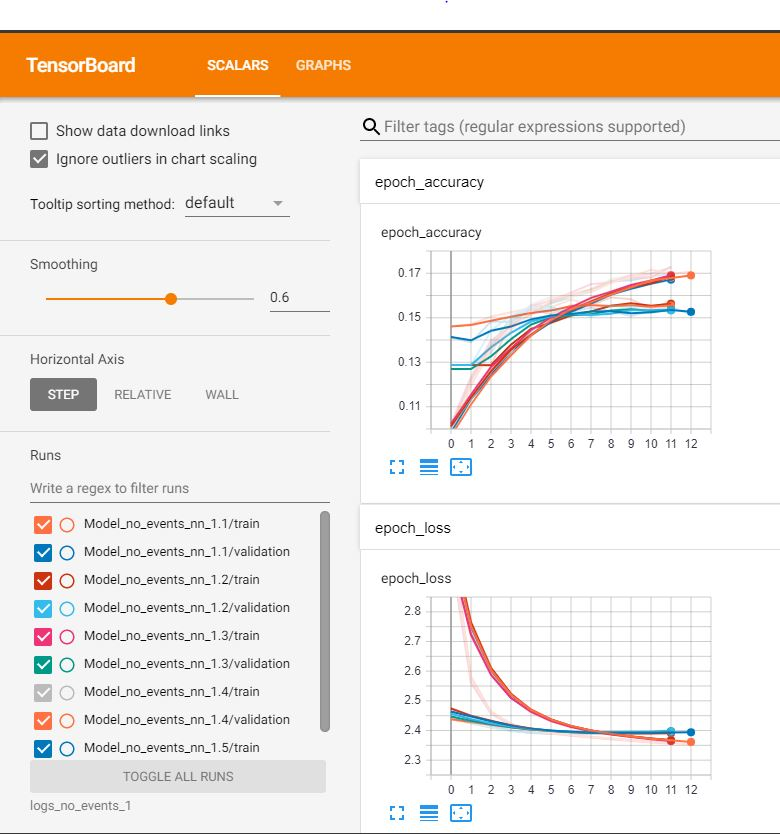

In [180]:
Image('Pred/tensorboard1.jpg')

##### Train Prediction

In [107]:
#Predicting Train class labels probality
#Taking average of value predicted for each seed
train_pred_avg_no_events_1=np.zeros((X_all_train.shape[0],12))
for i in range(len(model_1)):
    train_pred=model_1[i].predict_proba(X_all_train)
    train_pred_avg_no_events_1+=train_pred
train_pred_avg_no_events_1/=len(model_1)

##### CV Prediction

In [110]:
#Predicting CV class labels probalities
#Taking average of value predicted for each seed
cv_pred_avg_no_events_1=np.zeros((X_all_cv.shape[0],12))
for i in range(len(model_1)):
    cv_pred=model_1[i].predict_proba(X_all_cv)
    cv_pred_avg_no_events_1+=cv_pred
cv_pred_avg_no_events_1/=len(model_1)

##### Confusion Matrix

Train Average Log-Loss:  2.3575881615884535
-------------------- Confusion matrix --------------------


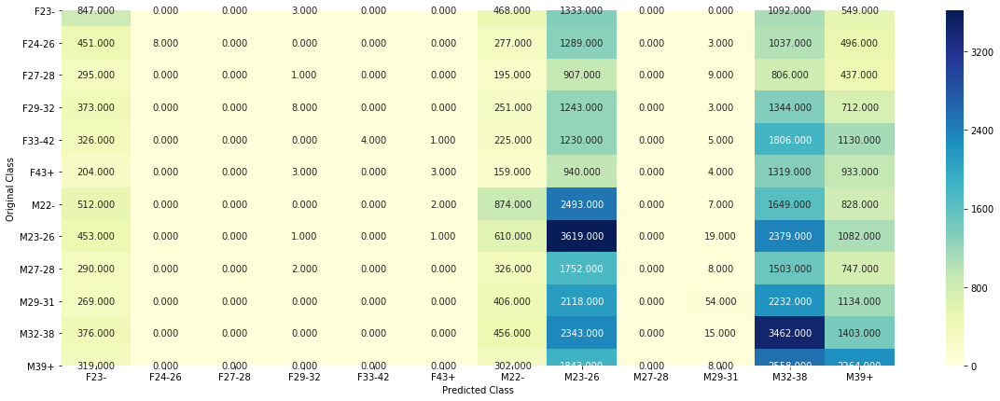

-------------------- Precision matrix (Columm Sum=1) --------------------


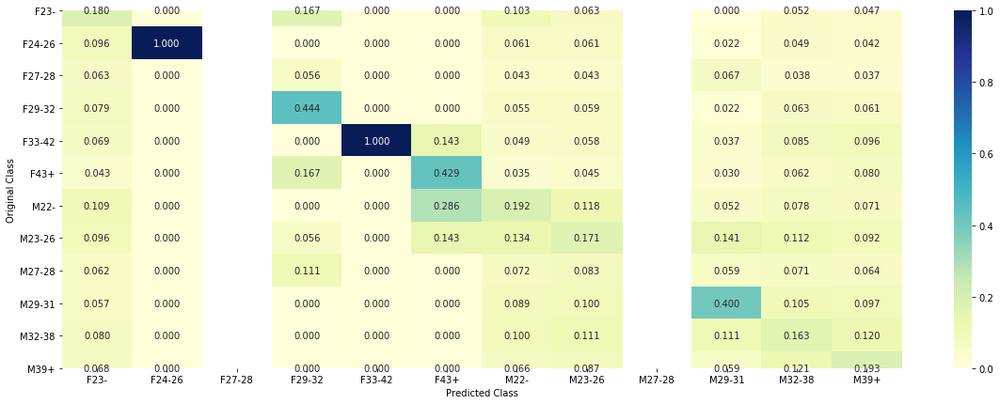

-------------------- Recall matrix (Row sum=1) --------------------


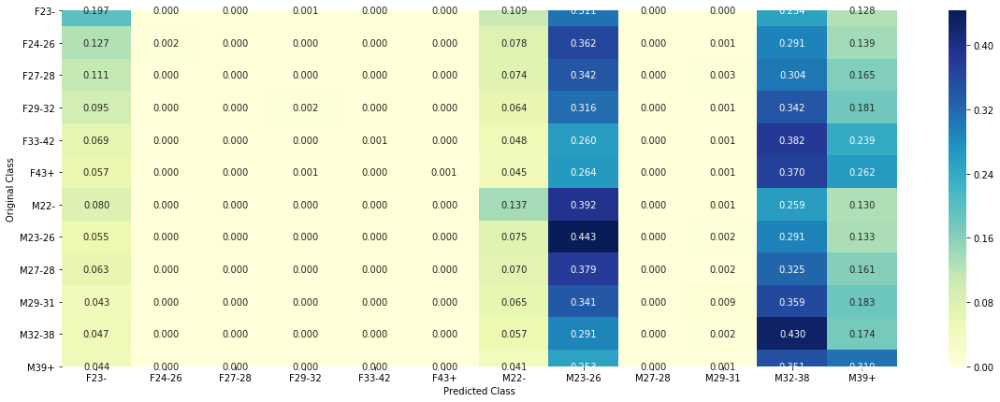

CV Average Log-Loss:  2.3556733242344774
-------------------- Confusion matrix --------------------


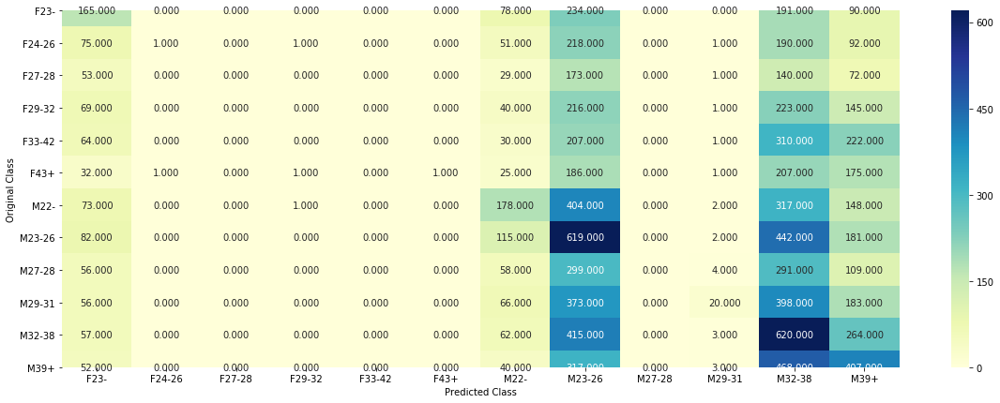

-------------------- Precision matrix (Columm Sum=1) --------------------


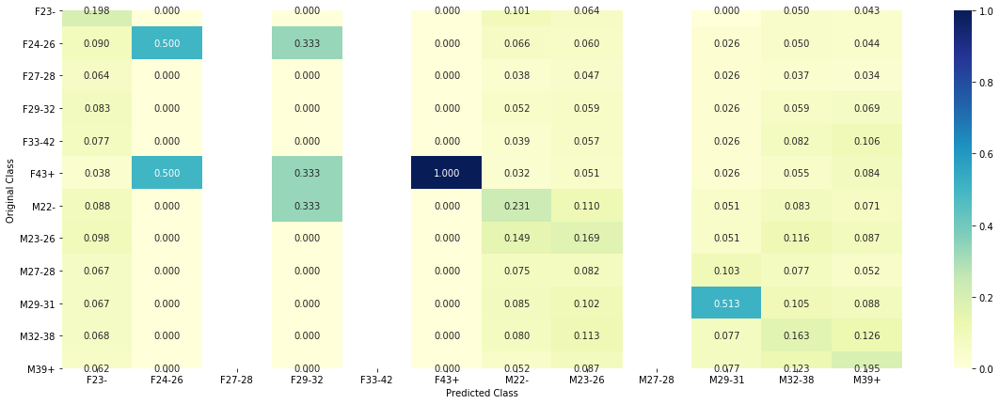

-------------------- Recall matrix (Row sum=1) --------------------


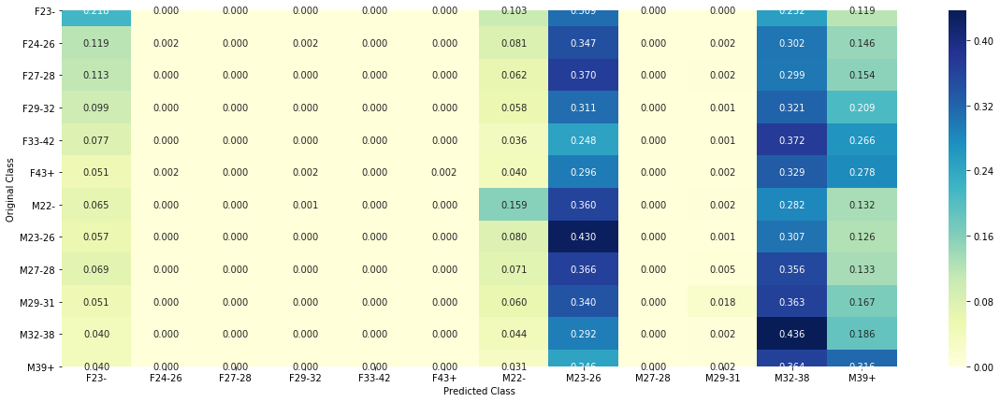

In [111]:
#Printing Confusion Matrix For Train and CV preditcions
print("Train Average Log-Loss: ",log_loss(Y_all_train, train_pred_avg_no_events_1))
no_events_nn_1_avg_train_predicted_classes=np.argmax(train_pred_avg_no_events_1, axis=1)
plot_confusion_matrix(Y_all_train,no_events_nn_1_avg_train_predicted_classes)

print(60*'=')

print("CV Average Log-Loss: ",log_loss(Y_all_cv, cv_pred_avg_no_events_1))
no_events_nn_1_avg_cv_predicted_classes=np.argmax(cv_pred_avg_no_events_1, axis=1)
plot_confusion_matrix(Y_all_cv,no_events_nn_1_avg_cv_predicted_classes)

##### Test Prediction

In [112]:
#Predicting the probabilities of class labels for Test data
#Taking average of value predicted for each seed
test_pred_avg_no_events_1=np.zeros((X_no_events_test.shape[0],12))
for i in range(len(model_1)):
    test_pred=model_1[i].predict_proba(X_no_events_test.tocsr())
    test_pred_avg_no_events_1+=test_pred
test_pred_avg_no_events_1/=len(model_1)

##### Neural network 2

In [113]:
#Loading NN model
model_no_events_2 = load_model('Models/no_events_2/no_events_nn_2.h5')

In [514]:
#https://www.kaggle.com/c/talkingdata-mobile-user-demographics/discussion/23424
#Refered from the above kaggle discussion
#Defining model
def model_no_events_nn_2(input_dim,output_dim, learRate=0.0025):
    
    model = Sequential()
    model.add(Dense(500, input_shape=(input_dim,), init='uniform'))
    model.add(PReLU(init='zero'))
    model.add(Dropout(0.82))
    model.add(Dense(output_dim, init='uniform'))
    model.add(Activation('softmax'))
    opt = Adagrad(lr=learRate, epsilon=1e-08)
    model.compile(loss='categorical_crossentropy',
                  optimizer=opt,
                  metrics=['accuracy'])
    return model

In [515]:
model_no_events_2=model_no_events_nn_1(x_ohe_train.shape[1])
model_no_events_2.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_25 (Dense)             (None, 256)               443136    
_________________________________________________________________
p_re_lu_17 (PReLU)           (None, 256)               256       
_________________________________________________________________
batch_normalization_17 (Batc (None, 256)               1024      
_________________________________________________________________
dropout_17 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_26 (Dense)             (None, 64)                16448     
_________________________________________________________________
p_re_lu_18 (PReLU)           (None, 64)                64        
_________________________________________________________________
batch_normalization_18 (Batc (None, 64)               

In [522]:
#Changin class labels to categorical values for NN
y_train_nn=np_utils.to_categorical(Y_all_train)
y_cv_nn=np_utils.to_categorical(Y_all_cv)

In [523]:
#Setting Log Directory
logdir = os.path.join("logs_no_events_2","Model_no_events_2")
t_callback_2=TensorBoard(log_dir=logdir)

In [524]:
#Running model on train data and validating against test data
model_no_events_2.fit(X_all_train, y_train_nn, batch_size=350, epochs=30, verbose=1, validation_data=(X_all_cv, y_cv_nn),callbacks=[early_stop_1,t_callback_2])

Train on 63448 samples, validate on 11197 samples
Epoch 1/30
63448/63448 [==============================] - ETA: 1:37 - loss: 2.4014 - accuracy: 0.15 - ETA: 37s - loss: 2.3908 - accuracy: 0.1581 - ETA: 23s - loss: 2.3827 - accuracy: 0.153 - ETA: 16s - loss: 2.3744 - accuracy: 0.157 - ETA: 12s - loss: 2.3771 - accuracy: 0.158 - ETA: 11s - loss: 2.3746 - accuracy: 0.159 - ETA: 10s - loss: 2.3755 - accuracy: 0.157 - ETA: 8s - loss: 2.3735 - accuracy: 0.160 - ETA: 8s - loss: 2.3726 - accuracy: 0.16 - ETA: 7s - loss: 2.3732 - accuracy: 0.15 - ETA: 7s - loss: 2.3753 - accuracy: 0.15 - ETA: 6s - loss: 2.3743 - accuracy: 0.15 - ETA: 6s - loss: 2.3748 - accuracy: 0.15 - ETA: 6s - loss: 2.3749 - accuracy: 0.15 - ETA: 5s - loss: 2.3762 - accuracy: 0.15 - ETA: 5s - loss: 2.3753 - accuracy: 0.16 - ETA: 5s - loss: 2.3749 - accuracy: 0.16 - ETA: 5s - loss: 2.3754 - accuracy: 0.16 - ETA: 4s - loss: 2.3766 - accuracy: 0.16 - ETA: 4s - loss: 2.3765 - accuracy: 0.16 - ETA: 4s - loss: 2.3773 - accuracy: 0

63448/63448 [==============================] - ETA: 4s - loss: 2.3329 - accuracy: 0.17 - ETA: 4s - loss: 2.3485 - accuracy: 0.16 - ETA: 3s - loss: 2.3567 - accuracy: 0.16 - ETA: 3s - loss: 2.3521 - accuracy: 0.16 - ETA: 3s - loss: 2.3541 - accuracy: 0.16 - ETA: 4s - loss: 2.3516 - accuracy: 0.16 - ETA: 4s - loss: 2.3504 - accuracy: 0.16 - ETA: 3s - loss: 2.3488 - accuracy: 0.17 - ETA: 3s - loss: 2.3482 - accuracy: 0.17 - ETA: 3s - loss: 2.3506 - accuracy: 0.17 - ETA: 3s - loss: 2.3513 - accuracy: 0.17 - ETA: 3s - loss: 2.3524 - accuracy: 0.17 - ETA: 3s - loss: 2.3530 - accuracy: 0.17 - ETA: 3s - loss: 2.3538 - accuracy: 0.17 - ETA: 3s - loss: 2.3564 - accuracy: 0.16 - ETA: 3s - loss: 2.3571 - accuracy: 0.16 - ETA: 3s - loss: 2.3573 - accuracy: 0.16 - ETA: 3s - loss: 2.3577 - accuracy: 0.16 - ETA: 3s - loss: 2.3597 - accuracy: 0.16 - ETA: 3s - loss: 2.3612 - accuracy: 0.16 - ETA: 3s - loss: 2.3618 - accuracy: 0.16 - ETA: 3s - loss: 2.3625 - accuracy: 0.16 - ETA: 3s - loss: 2.3619 - accu

63448/63448 [==============================] - ETA: 4s - loss: 2.3446 - accuracy: 0.17 - ETA: 5s - loss: 2.3421 - accuracy: 0.16 - ETA: 4s - loss: 2.3517 - accuracy: 0.17 - ETA: 5s - loss: 2.3501 - accuracy: 0.16 - ETA: 4s - loss: 2.3519 - accuracy: 0.16 - ETA: 4s - loss: 2.3498 - accuracy: 0.16 - ETA: 4s - loss: 2.3457 - accuracy: 0.17 - ETA: 4s - loss: 2.3468 - accuracy: 0.16 - ETA: 3s - loss: 2.3427 - accuracy: 0.17 - ETA: 3s - loss: 2.3453 - accuracy: 0.17 - ETA: 3s - loss: 2.3450 - accuracy: 0.16 - ETA: 3s - loss: 2.3443 - accuracy: 0.17 - ETA: 3s - loss: 2.3446 - accuracy: 0.17 - ETA: 3s - loss: 2.3467 - accuracy: 0.16 - ETA: 3s - loss: 2.3471 - accuracy: 0.17 - ETA: 3s - loss: 2.3481 - accuracy: 0.17 - ETA: 3s - loss: 2.3480 - accuracy: 0.17 - ETA: 3s - loss: 2.3484 - accuracy: 0.16 - ETA: 3s - loss: 2.3491 - accuracy: 0.16 - ETA: 3s - loss: 2.3481 - accuracy: 0.17 - ETA: 3s - loss: 2.3478 - accuracy: 0.16 - ETA: 3s - loss: 2.3486 - accuracy: 0.16 - ETA: 3s - loss: 2.3493 - accu

In [ ]:
# #Saving the model
# model_no_events_2.save('Models/no_events_2/no_events_nn_2.h5')

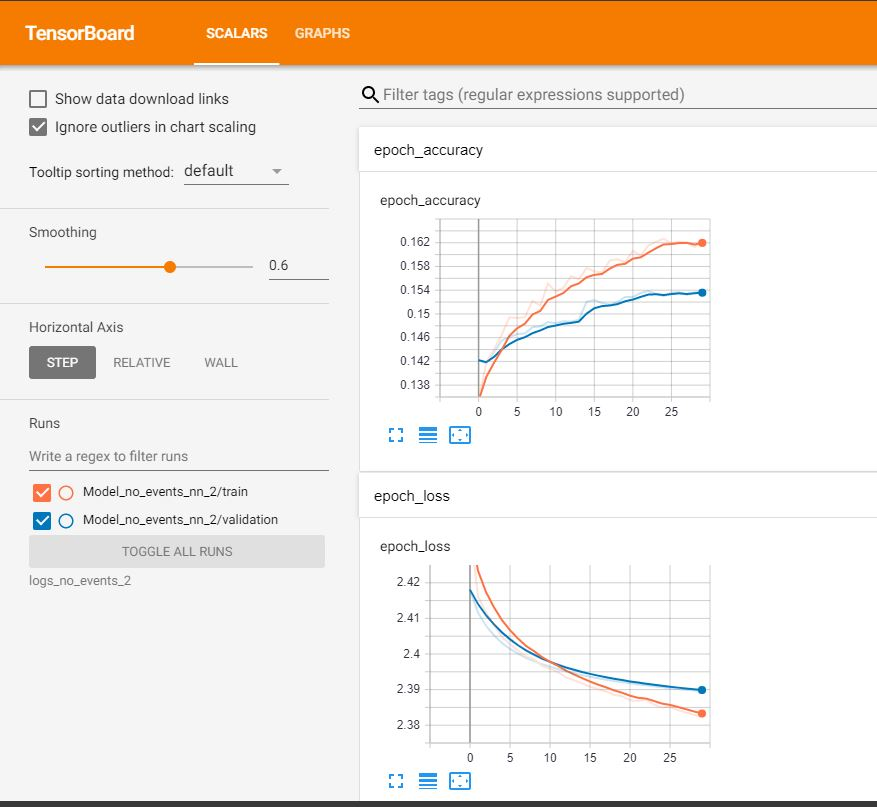

In [181]:
Image('Pred/tensorboard2.jpg')

##### Train Prediction and Confusion Matrix

Train Log-Loss:  2.352695338143375
-------------------- Confusion matrix --------------------


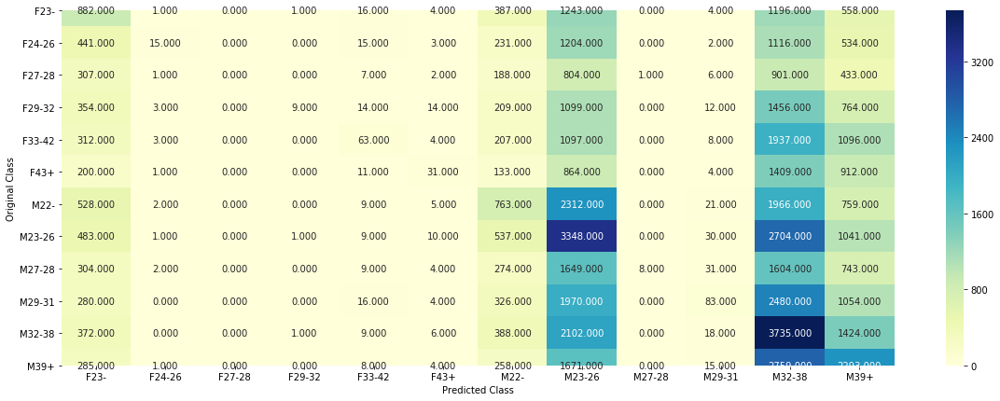

-------------------- Precision matrix (Columm Sum=1) --------------------


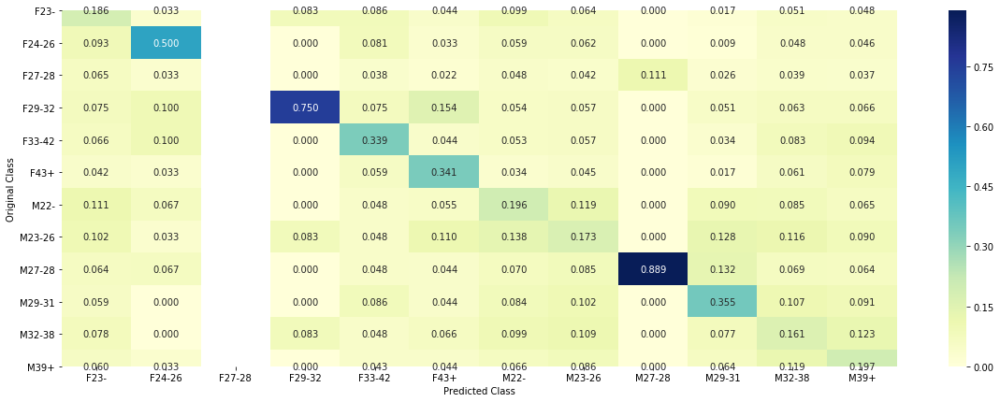

-------------------- Recall matrix (Row sum=1) --------------------


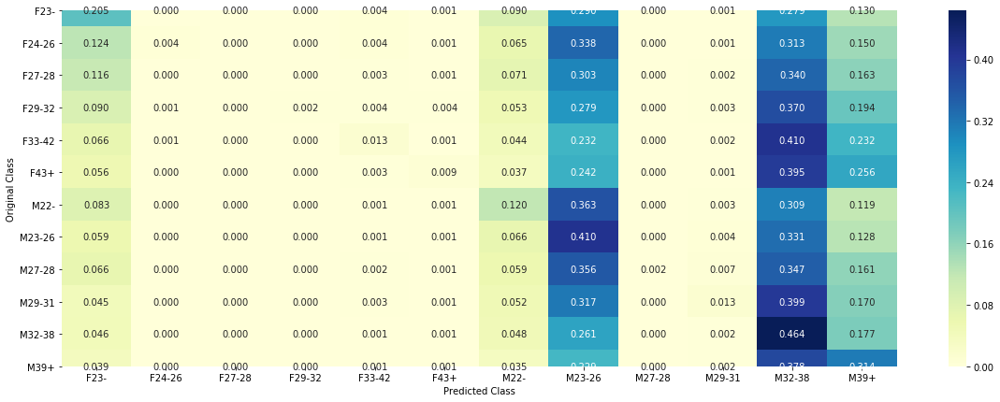

In [114]:
train_pred_avg_no_events_2=model_no_events_2.predict_proba(X_all_train)
print("Train Log-Loss: ",log_loss(Y_all_train, train_pred_avg_no_events_2))
no_events_nn_2_train_predicted_classes=np.argmax(train_pred_avg_no_events_2, axis=1)
plot_confusion_matrix(Y_all_train,no_events_nn_2_train_predicted_classes)

##### CV Prediction and Confusion Matrix

Train Log-Loss:  2.387814980548887
-------------------- Confusion matrix --------------------


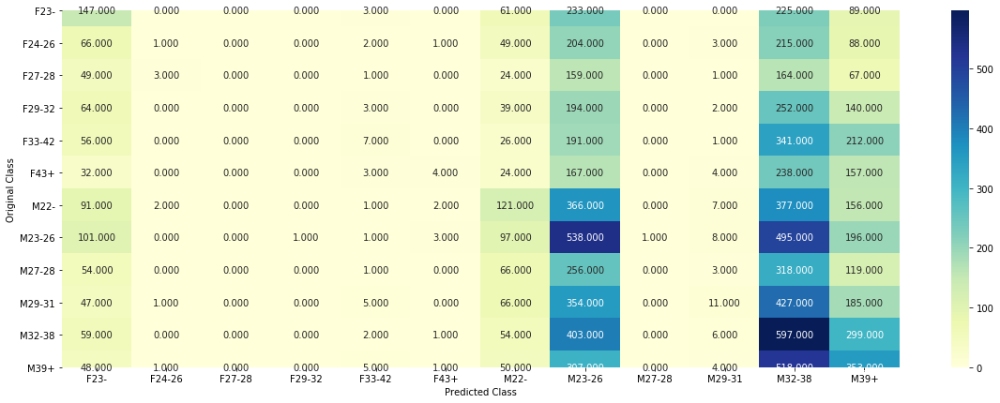

-------------------- Precision matrix (Columm Sum=1) --------------------


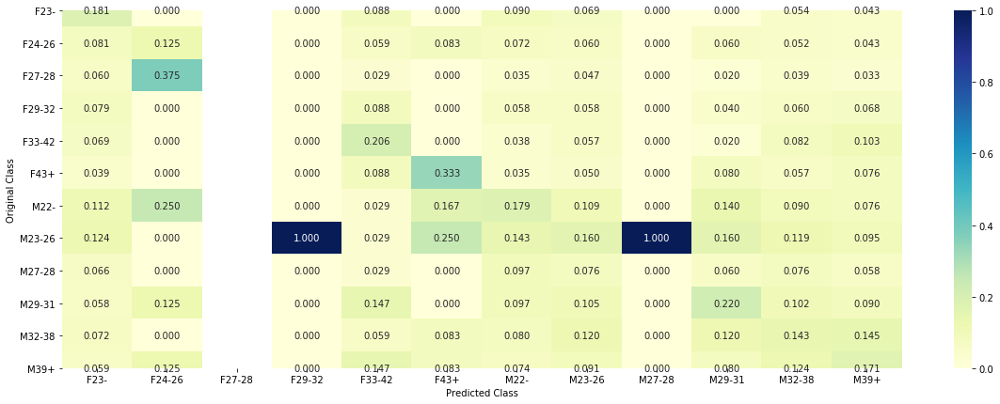

-------------------- Recall matrix (Row sum=1) --------------------


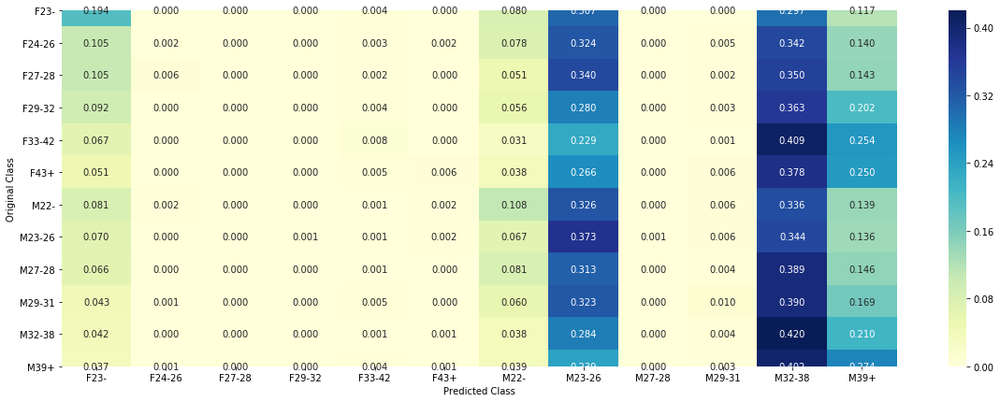

In [115]:
cv_pred_avg_no_events_2=model_no_events_2.predict_proba(X_all_cv)
print("Train Log-Loss: ",log_loss(Y_all_cv, cv_pred_avg_no_events_2))
no_events_nn_2_cv_predicted_classes=np.argmax(cv_pred_avg_no_events_2, axis=1)
plot_confusion_matrix(Y_all_cv,no_events_nn_2_cv_predicted_classes)

##### Test Prediction

In [116]:
test_pred_avg_no_events_2=model_no_events_2.predict_proba(X_no_events_test.tocsr())

### 5.2. Events Device

In [117]:
#Fetching the class labels
Y_events = having_events_data_train['group'].values

In [118]:
#Performing Train Test Split
X_events_train , X_events_cv , Y_events_train , Y_events_cv = train_test_split(X_having_events_train, Y_events,stratify=Y_events,test_size=0.20,random_state=9)
X_events_test = X_having_events_test

#### 5.2.1. KNN

In [229]:
from sklearn.neighbors import KNeighborsClassifier
k_size = [5,10,50,100]
for k_neighbour in k_size:
    knn_events_clf = KNeighborsClassifier(n_neighbors=k_neighbour, n_jobs=-1)
    knn_events_clf.fit(X_events_train, Y_events_train)
    #Using Model Calibration
    knn_events_sig_clf = CalibratedClassifierCV(knn_events_clf, method="sigmoid")
    knn_events_sig_clf.fit(X_events_train, Y_events_train)
    knn_events_predict_y = knn_events_sig_clf.predict_proba(X_events_cv)
    print('For values of K = ', k_neighbour, "The log loss is:",log_loss(Y_events_cv, knn_events_predict_y, labels=knn_events_clf.classes_, eps=1e-15))

For values of K =  5 The log loss is: 2.343914246548062
For values of K =  10 The log loss is: 2.3143817272282066
For values of K =  50 The log loss is: 2.2430287947253147
For values of K =  100 The log loss is: 2.2120937376664918


In [230]:
knn_events_clf = KNeighborsClassifier(n_neighbors=50, n_jobs=-1)
knn_events_clf.fit(X_events_train, Y_events_train)
#Using Model Calibration
knn_events_sig_clf = CalibratedClassifierCV(knn_events_clf, method="sigmoid")
knn_events_sig_clf.fit(X_events_train, Y_events_train)
knn_events_predict_y = knn_events_sig_clf.predict_proba(X_events_cv)
print('For values of K = ', k_neighbour, "The log loss is:",log_loss(Y_events_cv, knn_events_predict_y, labels=knn_events_clf.classes_, eps=1e-15))

For values of K =  100 The log loss is: 2.2430287947253147


In [231]:
knn_events_pred_train = knn_events_sig_clf.predict_proba(X_events_train)
print("Train Log-Loss is",log_loss(Y_events_train, knn_events_pred_train, labels=knn_events_clf.classes_, eps=1e-15))
knn_events_pred_cv = knn_events_sig_clf.predict_proba(X_events_cv)
print("CV Log-Loss is",log_loss(Y_events_cv, knn_events_pred_cv, labels=knn_events_clf.classes_, eps=1e-15))

Train Log-Loss is 2.153761278936381
CV Log-Loss is 2.2430287947253147


In [232]:
y_pred_events_train_classes_knn = np.argmax(knn_events_pred_train, axis=1)
y_pred_events_cv_classes_knn = np.argmax(knn_events_pred_cv, axis=1)

Train Log Loss : 2.153761278936381
-------------------- Confusion matrix --------------------


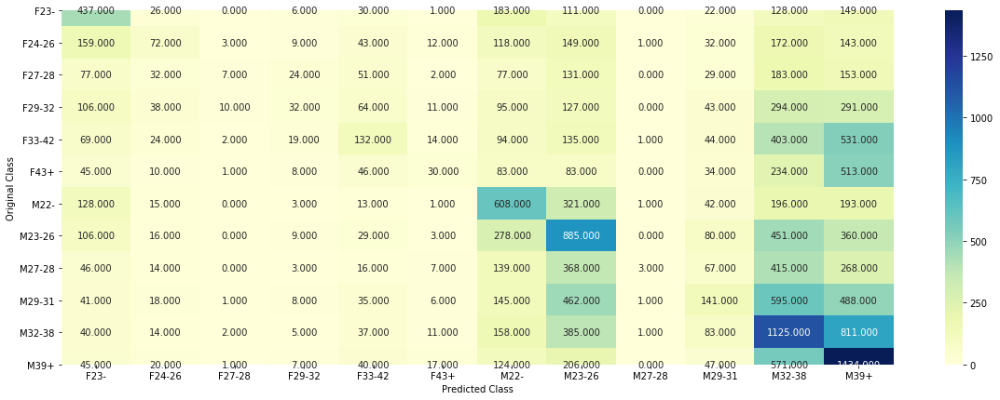

-------------------- Precision matrix (Columm Sum=1) --------------------


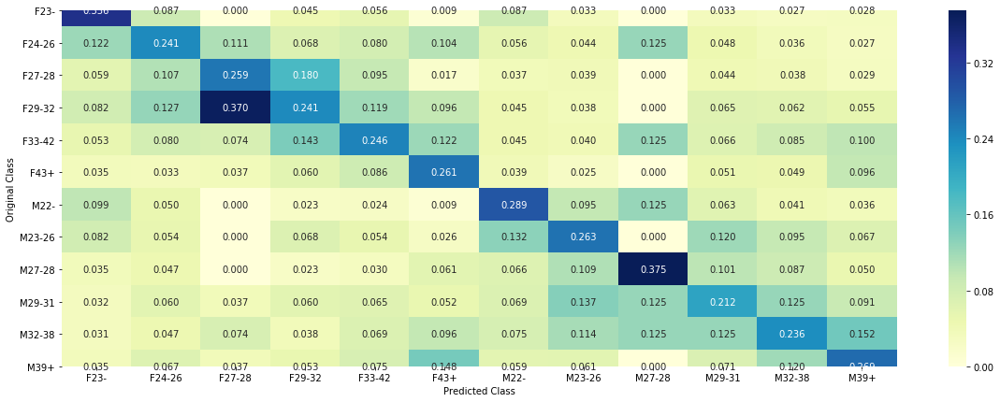

-------------------- Recall matrix (Row sum=1) --------------------


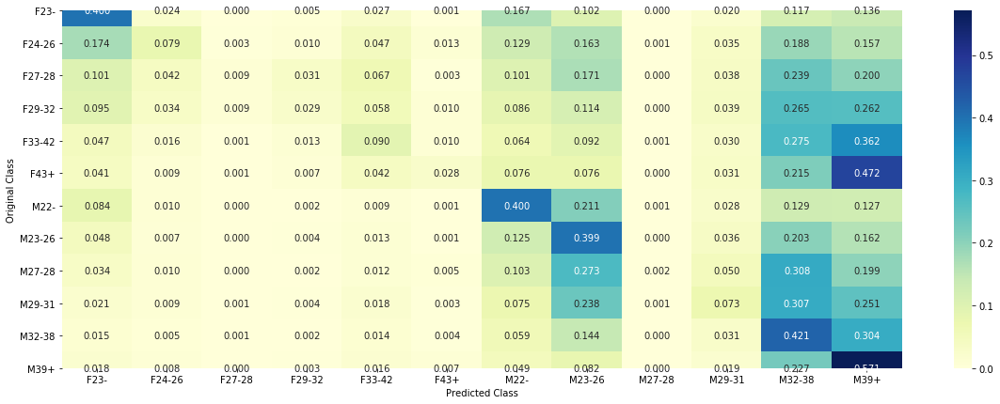

CV Log Loss : 2.2430287947253147
-------------------- Confusion matrix --------------------


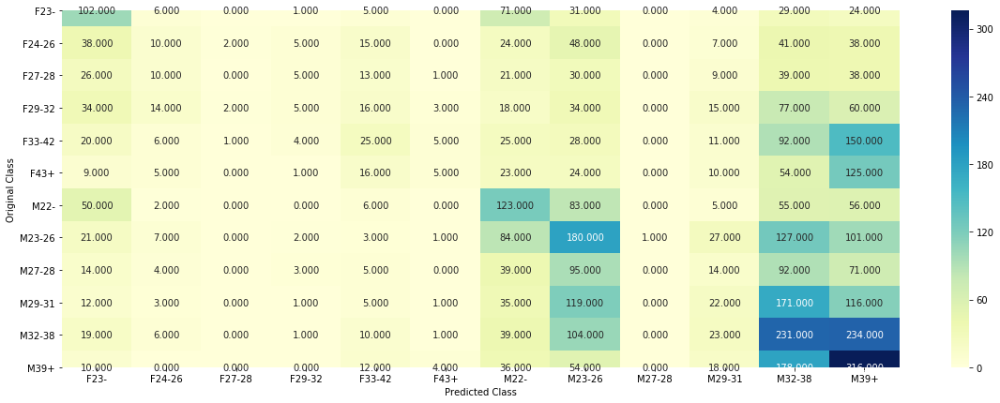

-------------------- Precision matrix (Columm Sum=1) --------------------


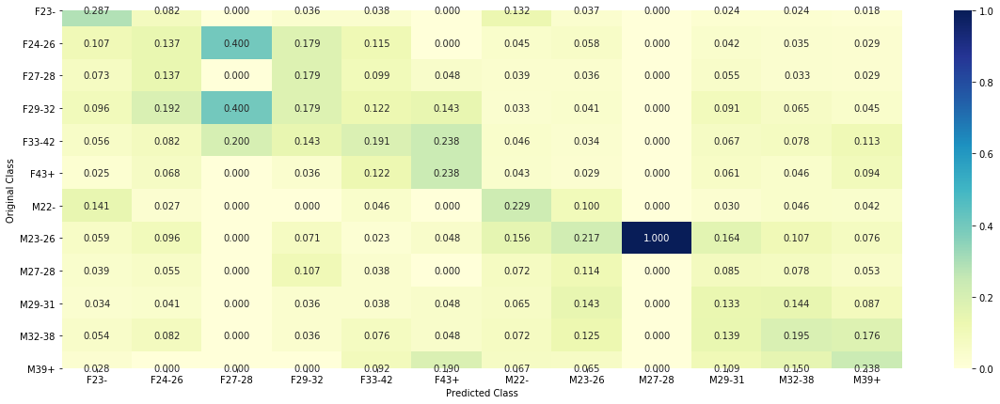

-------------------- Recall matrix (Row sum=1) --------------------


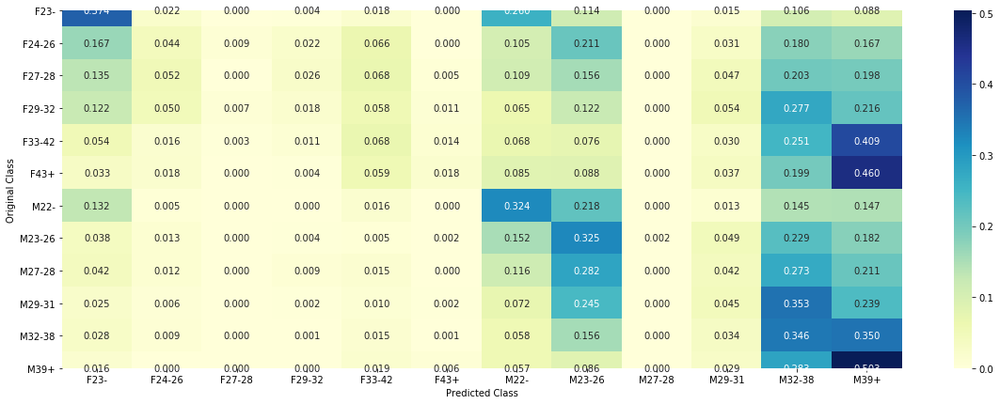

In [233]:
print("Train Log Loss :",log_loss(Y_events_train, knn_events_pred_train))
plot_confusion_matrix(Y_events_train,y_pred_events_train_classes_knn)

print("="*60)

print("CV Log Loss :",log_loss(Y_events_cv, knn_events_pred_cv))
plot_confusion_matrix(Y_events_cv,y_pred_events_cv_classes_knn)

In [301]:
y_events_pred_k_nearest_neighbours = knn_events_sig_clf.predict_proba(X_events_test)
# Multilabel class probalities are predicted
prediction_events_knn = pd.DataFrame(y_events_pred_k_nearest_neighbours,index = having_events_data_test.index,columns=targetencoder.classes_)
prediction_events_knn.head()
prediction_events_knn.to_csv("Predictions/prediction_events_knn.csv")

#### 5.2.2. SVM

In [237]:
from sklearn.linear_model import SGDClassifier
hyperparameters = [10**-2,10**-1,10**0, 10**1]
for c in hyperparameters:
    svm_events_clf = SGDClassifier(loss='hinge',alpha=c, class_weight='balanced',random_state=42)
    svm_events_clf.fit(X_events_train, Y_events_train)
    #Using Model Calibration
    svm_events_sig_clf = CalibratedClassifierCV(svm_events_clf, method="sigmoid")
    svm_events_sig_clf.fit(X_events_train, Y_events_train)
    svm_events_predict_y = svm_events_sig_clf.predict_proba(X_events_cv)
    print('For values of alpha = ', c, "The log loss is:",log_loss(Y_events_cv, svm_events_predict_y, labels=svm_events_clf.classes_, eps=1e-15))

For values of alpha =  0.01 The log loss is: 2.117849528589639
For values of alpha =  0.1 The log loss is: 2.2293116608139094
For values of alpha =  1 The log loss is: 2.3672057490767573
For values of alpha =  10 The log loss is: 2.40003498589291


In [238]:
svm_events_clf = SGDClassifier(loss='hinge',alpha=10**-1, class_weight='balanced',random_state=42)
svm_events_clf.fit(X_events_train, Y_events_train)
#Using Model Calibration
svm_events_sig_clf = CalibratedClassifierCV(svm_events_clf, method="sigmoid")
svm_events_sig_clf.fit(X_events_train, Y_events_train)
svm_events_predict_y = svm_events_sig_clf.predict_proba(X_events_cv)
print('For values of alpha = ', c, "The log loss is:",log_loss(Y_events_cv, svm_events_predict_y, labels=svm_events_clf.classes_, eps=1e-15))

For values of alpha =  10 The log loss is: 2.2293116608139094


In [239]:
svm_events_pred_train = svm_events_sig_clf.predict_proba(X_events_train)
print("Train Log-Loss is",log_loss(Y_events_train, svm_events_pred_train, labels=svm_events_clf.classes_, eps=1e-15))
svm_events_pred_cv = svm_events_sig_clf.predict_proba(X_events_cv)
print("CV Log-Loss is",log_loss(Y_events_cv, svm_events_pred_cv, labels=svm_events_clf.classes_, eps=1e-15))

Train Log-Loss is 2.1680112482745835
CV Log-Loss is 2.2293116608139094


In [240]:
y_pred_events_train_classes_svm = np.argmax(svm_events_pred_train, axis=1)
y_pred_events_cv_classes_svm = np.argmax(svm_events_pred_cv, axis=1)

Train Log Loss : 2.1680112482745835
-------------------- Confusion matrix --------------------


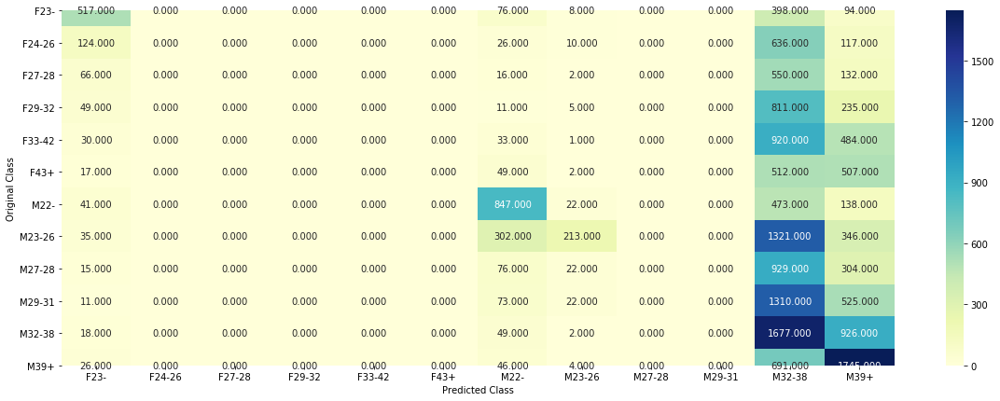

-------------------- Precision matrix (Columm Sum=1) --------------------


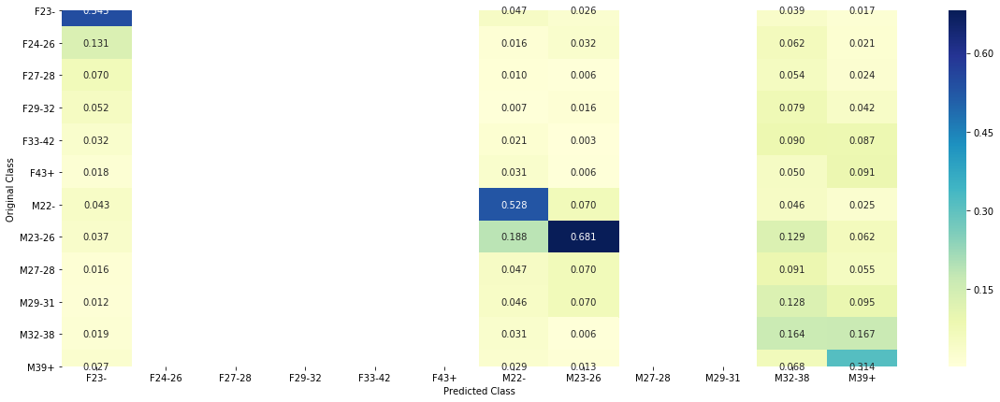

-------------------- Recall matrix (Row sum=1) --------------------


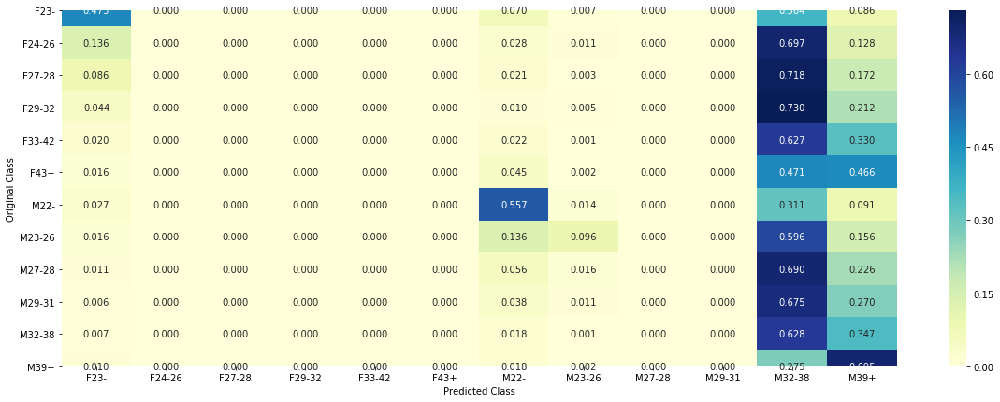

CV Log Loss : 2.2293116608139094
-------------------- Confusion matrix --------------------


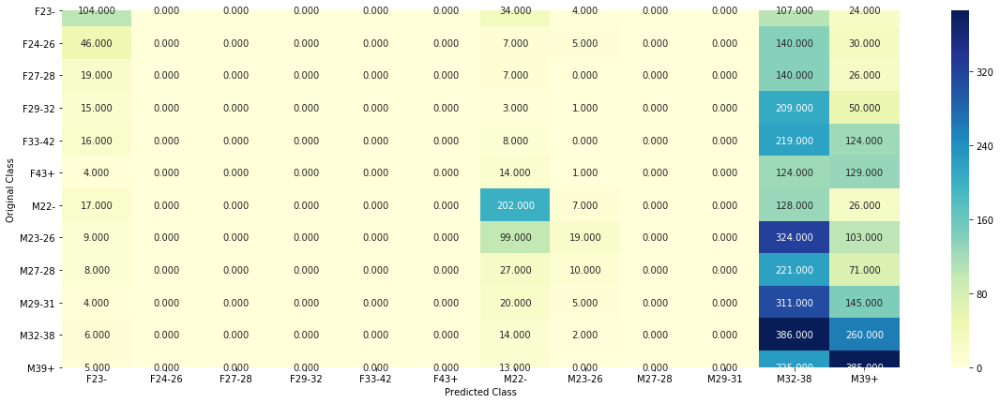

-------------------- Precision matrix (Columm Sum=1) --------------------


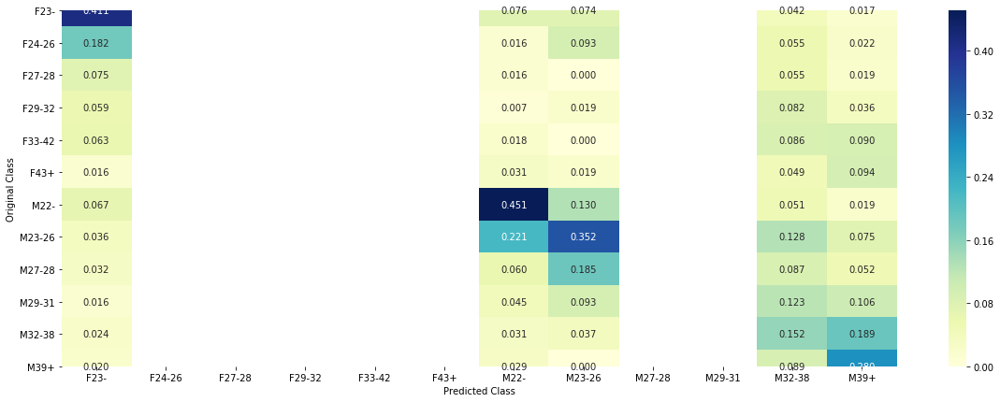

-------------------- Recall matrix (Row sum=1) --------------------


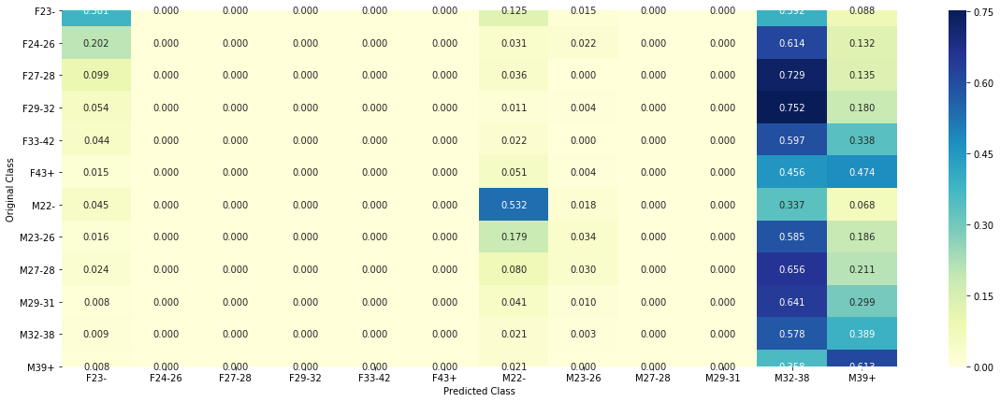

In [241]:
print("Train Log Loss :",log_loss(Y_events_train, svm_events_pred_train))
plot_confusion_matrix(Y_events_train,y_pred_events_train_classes_svm)

print("="*60)

print("CV Log Loss :",log_loss(Y_events_cv, svm_events_pred_cv))
plot_confusion_matrix(Y_events_cv,y_pred_events_cv_classes_svm)

In [302]:
y_events_pred_svm = svm_events_sig_clf.predict_proba(X_events_test)

# Multilabel class probalities are predicted
prediction_events_svm = pd.DataFrame(y_events_pred_svm,index = having_events_data_test.index,columns=targetencoder.classes_)
prediction_events_svm.head()
prediction_events_svm.to_csv("Predictions/prediction_events_svm.csv")

#### 5.2.3 Logistic Regression

In [128]:
# #Loading the model
# log_reg_events_sig_clf = joblib.load('Models/log_reg_events/events_logistic_regression.sav')

In [424]:
hyperparameters = [10**-4, 10**-3,10**-2,10**-1,10**0, 10**1, 10**2,10**3,10**4]
cv_log_error_array = []
for c in hyperparameters:
    log_reg_events_clf = LogisticRegression(C=c, class_weight='balanced', multi_class='multinomial',solver='lbfgs' ,random_state=42)
    log_reg_events_clf.fit(X_events_train, Y_events_train)
    #Using Model Calibration
    log_reg_events_sig_clf = CalibratedClassifierCV(log_reg_events_clf, method="sigmoid")
    log_reg_events_sig_clf.fit(X_events_train, Y_events_train)
    log_reg_events_predict_y = log_reg_events_sig_clf.predict_proba(X_events_cv)
    print('For values of C = ', c, "The log loss is:",log_loss(Y_events_cv, log_reg_events_predict_y, labels=log_reg_events_sig_clf.classes_, eps=1e-15))

For values of C =  0.0001 The log loss is: 2.195634357544072
For values of C =  0.001 The log loss is: 2.0992408439935297
For values of C =  0.01 The log loss is: 2.021074377675445
For values of C =  0.1 The log loss is: 2.0407353146729488
For values of C =  1 The log loss is: 2.1092748831094887
For values of C =  10 The log loss is: 2.126140261538226
For values of C =  100 The log loss is: 2.1273864200405233
For values of C =  1000 The log loss is: 2.1348130714885483
For values of C =  10000 The log loss is: 2.1349921423751335


In [124]:
#Training Model With best Hyperparameters
best_c = 10**-2
log_reg_events_clf = LogisticRegression(C=best_c, class_weight='balanced', multi_class='multinomial', solver='lbfgs',random_state=42)
log_reg_events_clf.fit(X_events_train, Y_events_train)
log_reg_events_sig_clf = CalibratedClassifierCV(log_reg_events_clf, method="sigmoid")
log_reg_events_sig_clf.fit(X_events_train, Y_events_train)

CalibratedClassifierCV(base_estimator=LogisticRegression(C=0.01,
                                                         class_weight='balanced',
                                                         dual=False,
                                                         fit_intercept=True,
                                                         intercept_scaling=1,
                                                         l1_ratio=None,
                                                         max_iter=100,
                                                         multi_class='multinomial',
                                                         n_jobs=None,
                                                         penalty='l2',
                                                         random_state=42,
                                                         solver='lbfgs',
                                                         tol=0.0001, verbose=0,
                                  

In [127]:
# #Saving the model
# jobl.dump(log_reg_events_sig_clf,'Models/log_reg_events/events_logistic_regression.sav')

In [129]:
#Printing log loss
log_reg_events_pred_train = log_reg_events_sig_clf.predict_proba(X_events_train)
print("Train Log-Loss is",log_loss(Y_events_train, log_reg_events_pred_train, labels=log_reg_events_clf.classes_, eps=1e-15))
log_reg_events_pred_cv = log_reg_events_sig_clf.predict_proba(X_events_cv)
print("CV Log-Loss is",log_loss(Y_events_cv, log_reg_events_pred_cv, labels=log_reg_events_clf.classes_, eps=1e-15))

Train Log-Loss is 1.88945546600425
CV Log-Loss is 2.021074377675445


In [130]:
y_pred_events_train_classes_log_reg = np.argmax(log_reg_events_pred_train, axis=1)
y_pred_events_cv_classes_log_reg = np.argmax(log_reg_events_pred_cv, axis=1)

Train Log Loss : 1.88945546600425
-------------------- Confusion matrix --------------------


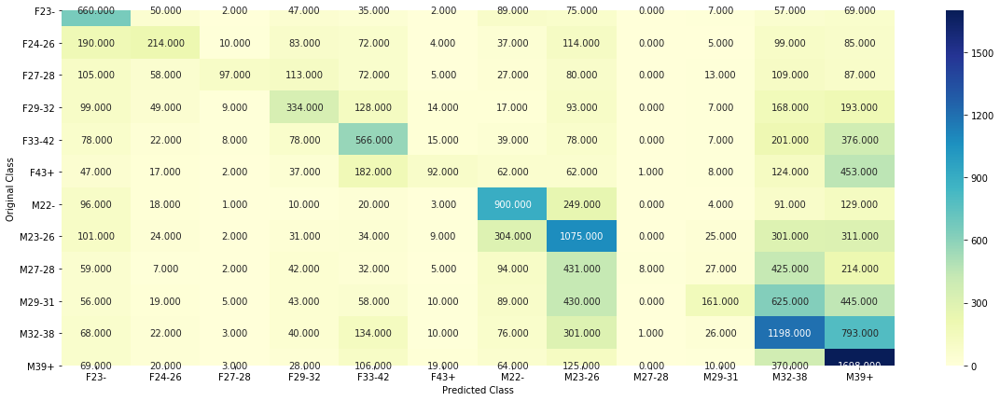

-------------------- Precision matrix (Columm Sum=1) --------------------


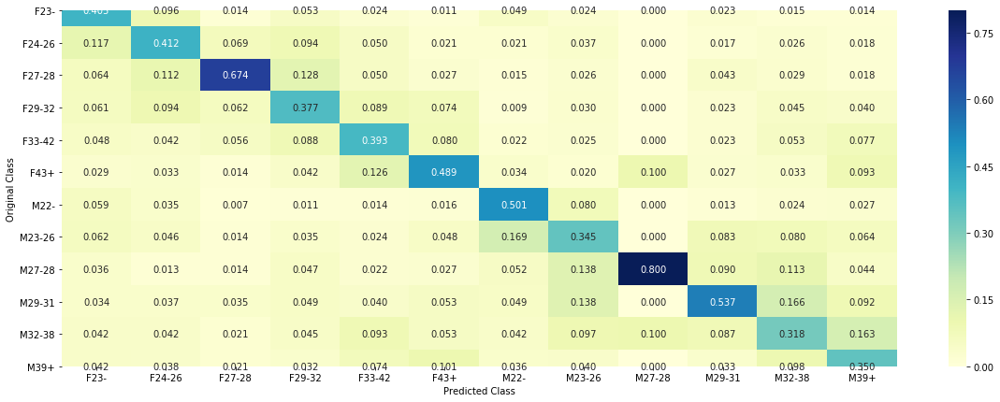

-------------------- Recall matrix (Row sum=1) --------------------


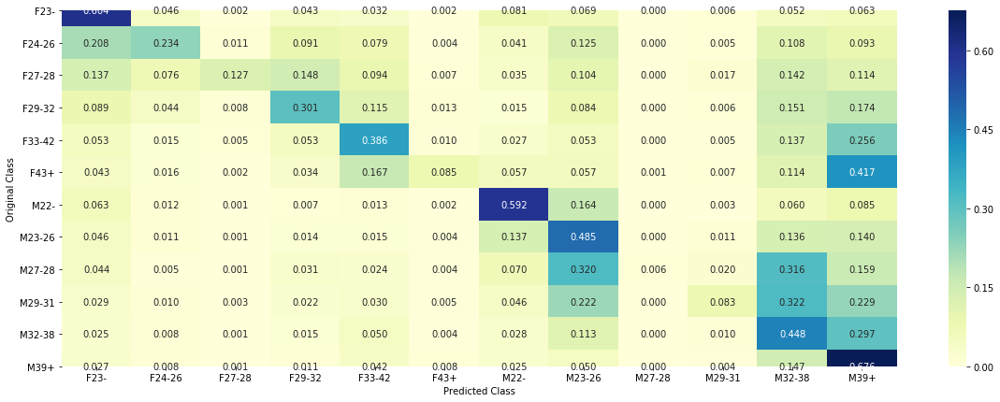

CV Log Loss : 2.021074377675445
-------------------- Confusion matrix --------------------


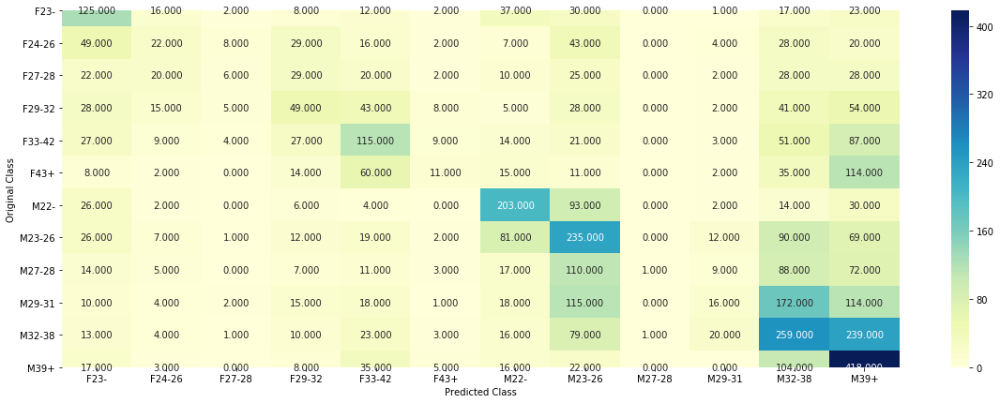

-------------------- Precision matrix (Columm Sum=1) --------------------


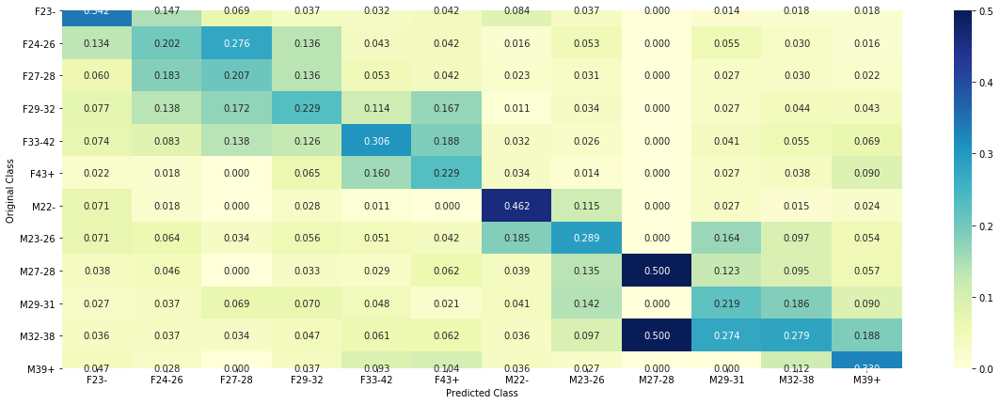

-------------------- Recall matrix (Row sum=1) --------------------


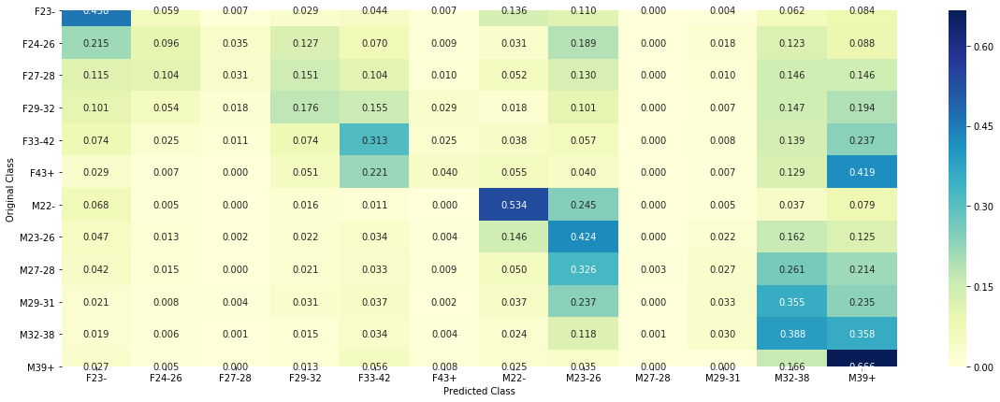

In [131]:
#Printing confusion matrix
print("Train Log Loss :",log_loss(Y_events_train, log_reg_events_pred_train))
plot_confusion_matrix(Y_events_train,y_pred_events_train_classes_log_reg)

print("="*60)

print("CV Log Loss :",log_loss(Y_events_cv, log_reg_events_pred_cv))
plot_confusion_matrix(Y_events_cv,y_pred_events_cv_classes_log_reg)

In [132]:
#Predicting Class Labels probalities for test data
y_events_pred_logistic_regression = log_reg_events_sig_clf.predict_proba(X_events_test)
prediction_events_log_reg = pd.DataFrame(y_events_pred_logistic_regression,index = having_events_data_test.index,columns=targetencoder.classes_)
prediction_events_log_reg.to_csv("Predictions/prediction_events_log_reg.csv")

#### 5.2.4. XGBoost

In [431]:
# https://www.kaggle.com/c/talkingdata-mobile-user-demographics/discussion/23424
# Best max_depth will be 5(Got from the above link discussion)
max_depth= [2,3,4,5]
n_estimator = [250,350,450]
for depth in max_depth:
    for estimator in n_estimator:
        xgb_events_clf=XGBClassifier(n_estimators=estimator,n_jobs=-1,learning_rate=0.05, colsample_bytree=0.7, max_depth=depth,subsample=0.7,objective='multi:softprob',num_class=12,eval_metric='mlogloss')
        xgb_events_clf.fit(X_events_train, Y_events_train)
        xgb_events_sig_clf = CalibratedClassifierCV(xgb_events_clf)
        xgb_events_sig_clf.fit(X_events_train, Y_events_train)
        predict_events_xgb_y = xgb_events_sig_clf.predict_proba(X_events_cv)
        print ('log_loss for n_estimator = ',estimator,'and maxdepth =',depth,'is',log_loss(Y_events_cv, predict_events_xgb_y, labels=xgb_events_clf.classes_, eps=1e-15))

In [252]:
xgb_events_clf=XGBClassifier(n_estimators=350,n_jobs=-1,learning_rate=0.05, colsample_bytree=0.7, max_depth=4,subsample=0.7,objective='multi:softprob',num_class=12,eval_metric='mlogloss')
xgb_events_clf.fit(X_events_train, Y_events_train)
xgb_events_sig_clf = CalibratedClassifierCV(xgb_events_clf)
xgb_events_sig_clf.fit(X_events_train, Y_events_train)
xgb_events_predict_y = xgb_events_sig_clf.predict_proba(X_events_cv)
print ('log_loss for n_estimator = ',350,'and maxdepth =',4,'is',log_loss(Y_events_cv, xgb_events_predict_y, labels=xgb_events_clf.classes_, eps=1e-15))

log_loss for n_estimator =  350 and maxdepth = 4 is 2.065546582627574


In [253]:
xgb_events_pred_train = xgb_events_sig_clf.predict_proba(X_events_train)
print("Train Log-Loss is",log_loss(Y_events_train, xgb_events_pred_train, labels=xgb_events_clf.classes_, eps=1e-15))
xgb_events_pred_cv = xgb_events_sig_clf.predict_proba(X_events_cv)
print("CV Log-Loss is",log_loss(Y_events_cv, xgb_events_pred_cv, labels=xgb_events_clf.classes_, eps=1e-15))

Train Log-Loss is 1.4814399080847296
CV Log-Loss is 2.065546582627574


In [254]:
y_pred_events_train_classes_xgb = np.argmax(xgb_events_pred_train, axis=1)
y_pred_events_cv_classes_xgb = np.argmax(xgb_events_pred_cv, axis=1)

Train Log Loss : 1.4814399080847296
-------------------- Confusion matrix --------------------


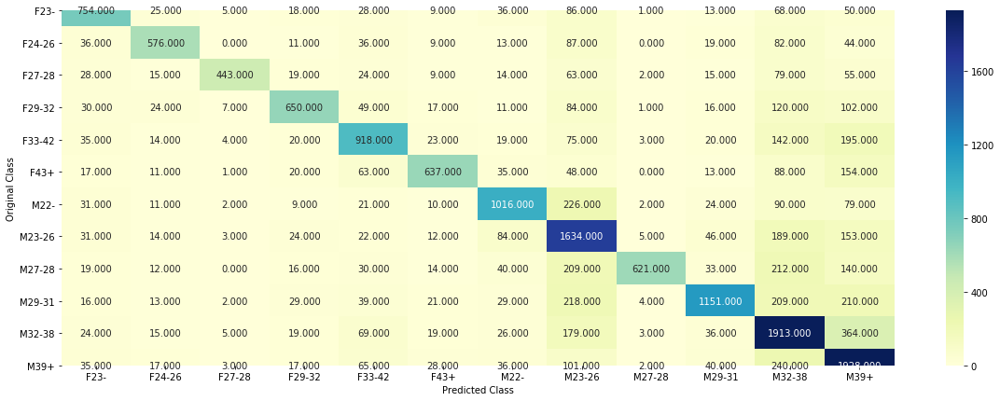

-------------------- Precision matrix (Columm Sum=1) --------------------


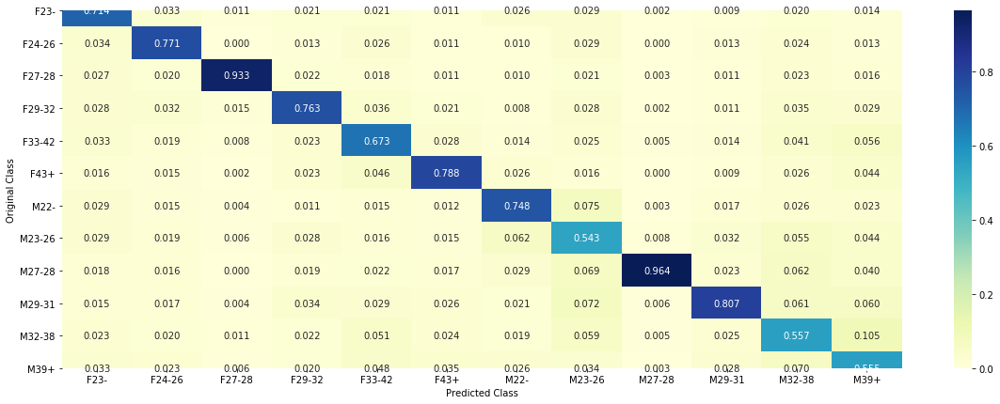

-------------------- Recall matrix (Row sum=1) --------------------


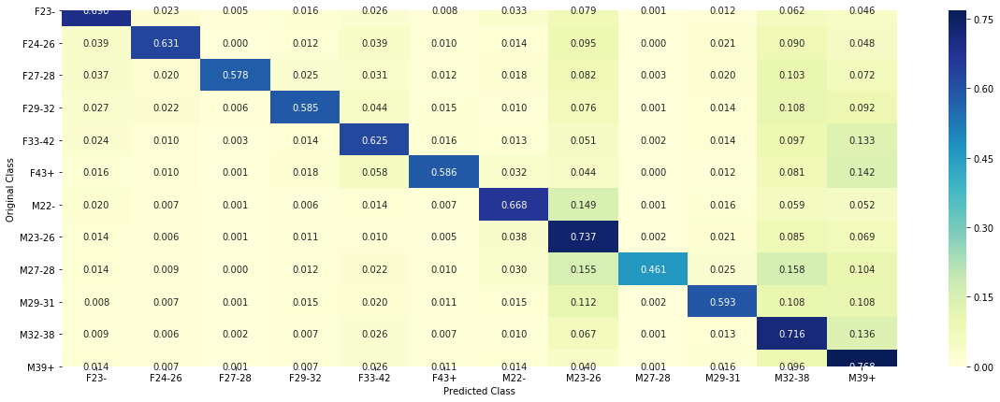

CV Log Loss : 2.065546582627574
-------------------- Confusion matrix --------------------


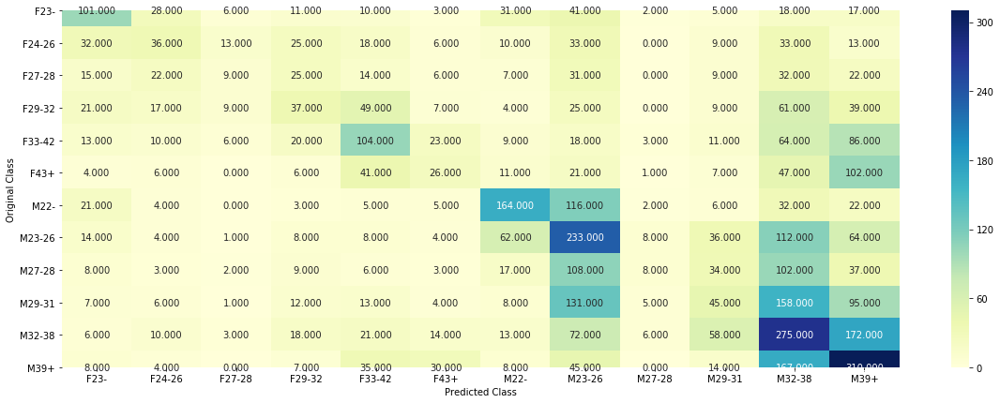

-------------------- Precision matrix (Columm Sum=1) --------------------


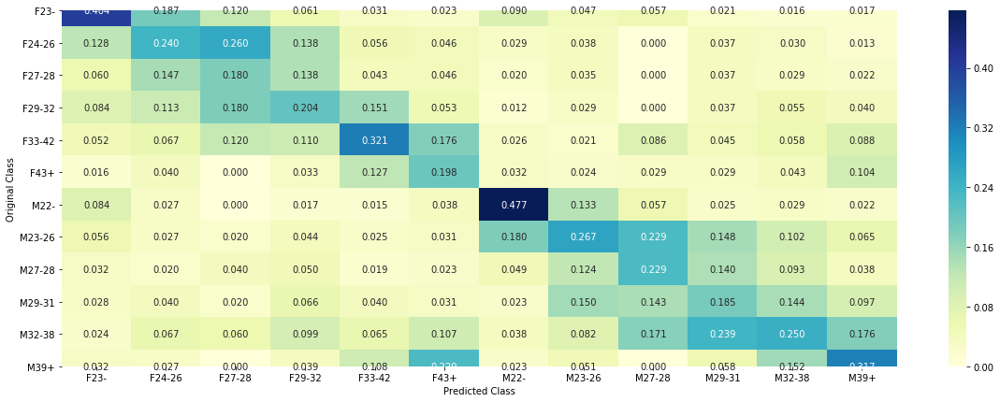

-------------------- Recall matrix (Row sum=1) --------------------


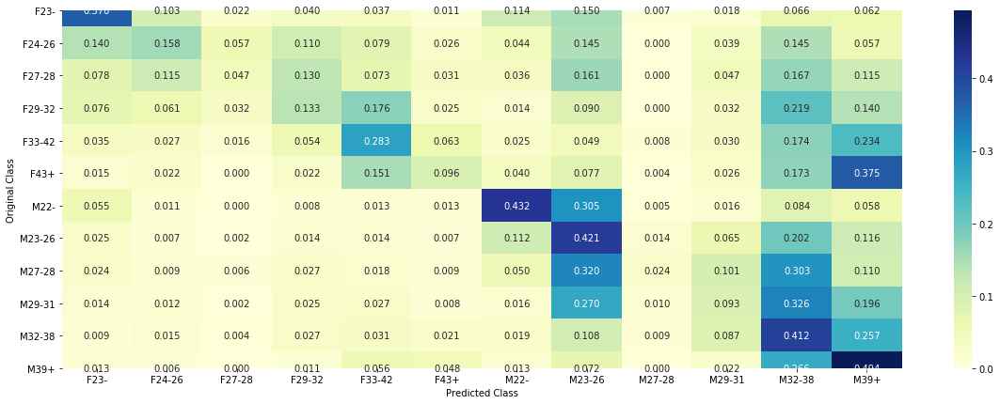

In [255]:
print("Train Log Loss :",log_loss(Y_events_train, xgb_events_pred_train))
plot_confusion_matrix(Y_events_train,y_pred_events_train_classes_xgb)

print("="*60)

print("CV Log Loss :",log_loss(Y_events_cv, xgb_events_pred_cv))
plot_confusion_matrix(Y_events_cv,y_pred_events_cv_classes_xgb)

In [308]:
y_events_pred_xgboost = xgb_events_sig_clf.predict_proba(X_events_test)

# Multilabel class probalities are predicted
prediction_events_xgb = pd.DataFrame(y_events_pred_xgboost,index = having_events_data_test.index,columns=targetencoder.classes_)
prediction_events_xgb.head()
prediction_events_xgb.to_csv("Predictions/prediction_events_xgb.csv")

#### 5.2.5. Random Forest

In [258]:
from sklearn.ensemble import RandomForestClassifier
max_depth = [3, 4, 5, 6]
n_estimator = [350,450,550]
for depth in max_depth:
    for estimator in n_estimator:
        rf_events_clf=RandomForestClassifier(n_estimators=estimator,n_jobs=-1, max_depth=depth)
        rf_events_clf.fit(X_events_train, Y_events_train)
        rf_events_sig_clf = CalibratedClassifierCV(rf_events_clf, method="sigmoid")
        rf_events_sig_clf.fit(X_events_train, Y_events_train)
        rf_events_predict_y = rf_events_sig_clf.predict_proba(X_events_cv)
        print ('log_loss for n_estimator = ',estimator,'and maxdepth =',depth,'is',log_loss(Y_events_cv, rf_events_predict_y, labels=rf_events_clf.classes_, eps=1e-15))

log_loss for n_estimator =  350 and maxdepth = 3 is 2.171986027538312
log_loss for n_estimator =  450 and maxdepth = 3 is 2.1707237438136486
log_loss for n_estimator =  550 and maxdepth = 3 is 2.1666960153128603
log_loss for n_estimator =  350 and maxdepth = 4 is 2.1587664328560816
log_loss for n_estimator =  450 and maxdepth = 4 is 2.159469938622786
log_loss for n_estimator =  550 and maxdepth = 4 is 2.158241615093273
log_loss for n_estimator =  350 and maxdepth = 5 is 2.1499067761911177
log_loss for n_estimator =  450 and maxdepth = 5 is 2.1517681616612356
log_loss for n_estimator =  550 and maxdepth = 5 is 2.150181618268085
log_loss for n_estimator =  350 and maxdepth = 6 is 2.1440397949344283
log_loss for n_estimator =  450 and maxdepth = 6 is 2.144281228180726
log_loss for n_estimator =  550 and maxdepth = 6 is 2.1448643367241362


In [259]:
rf_events_clf=RandomForestClassifier(n_estimators=350,n_jobs=-1, max_depth=5)
rf_events_clf.fit(X_events_train, Y_events_train)
rf_events_sig_clf = CalibratedClassifierCV(rf_events_clf, method="sigmoid")
rf_events_sig_clf.fit(X_events_train, Y_events_train)
rf_events_predict_y = rf_events_sig_clf.predict_proba(X_events_cv)
print ('log_loss for n_estimator = ',estimator,'and maxdepth =',depth,'is',log_loss(Y_events_cv, rf_events_predict_y, labels=rf_events_clf.classes_, eps=1e-15))

log_loss for n_estimator =  550 and maxdepth = 6 is 2.1516574269127413


In [260]:
rf_events_pred_train = rf_events_sig_clf.predict_proba(X_events_train)
print("Train Log-Loss is",log_loss(Y_events_train, rf_events_pred_train, labels=rf_events_clf.classes_, eps=1e-15))
rf_events_pred_cv = rf_events_sig_clf.predict_proba(X_events_cv)
print("CV Log-Loss is",log_loss(Y_events_cv, rf_events_pred_cv, labels=rf_events_clf.classes_, eps=1e-15))

Train Log-Loss is 2.065628925771852
CV Log-Loss is 2.1516574269127404


In [261]:
y_pred_events_train_classes_rf = np.argmax(rf_events_pred_train, axis=1)
y_pred_events_cv_classes_rf = np.argmax(rf_events_pred_cv, axis=1)

Train Log Loss : 2.065628925771852
-------------------- Confusion matrix --------------------


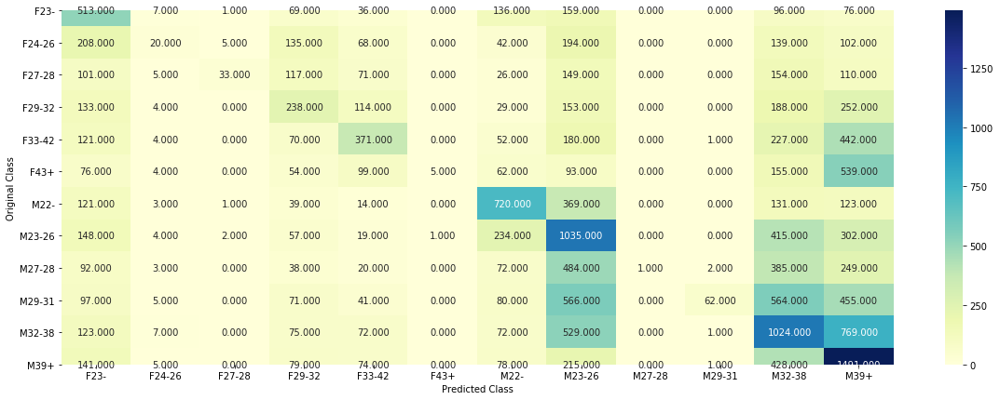

-------------------- Precision matrix (Columm Sum=1) --------------------


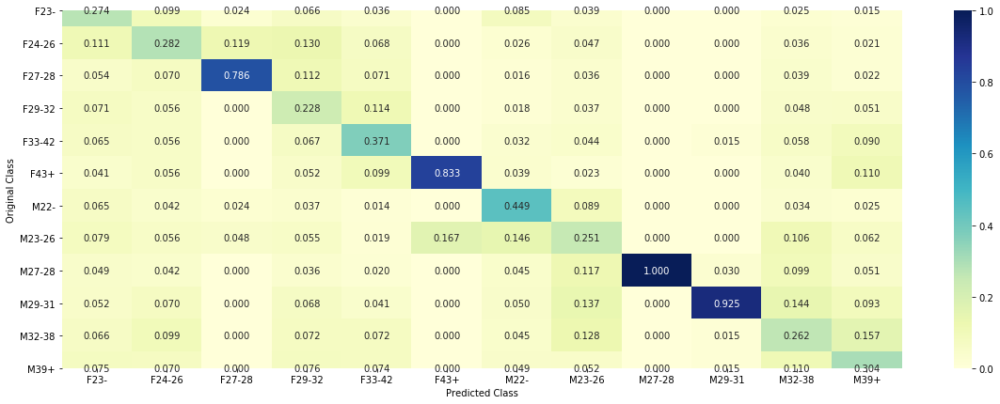

-------------------- Recall matrix (Row sum=1) --------------------


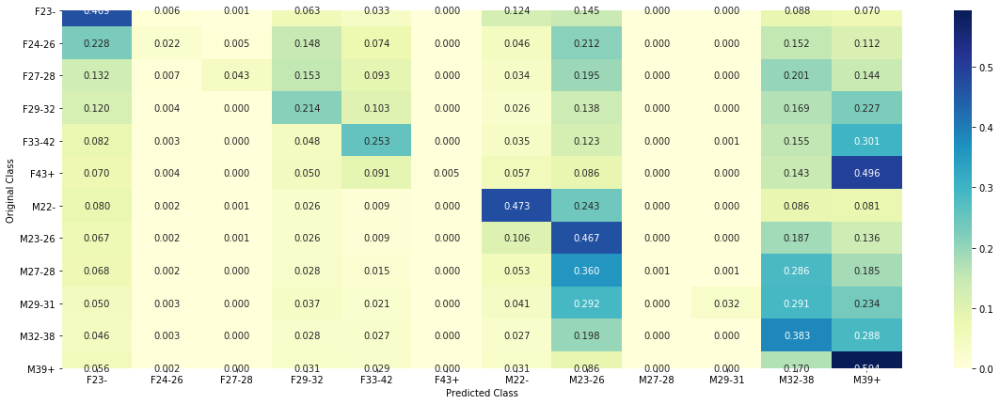

CV Log Loss : 2.1516574269127404
-------------------- Confusion matrix --------------------


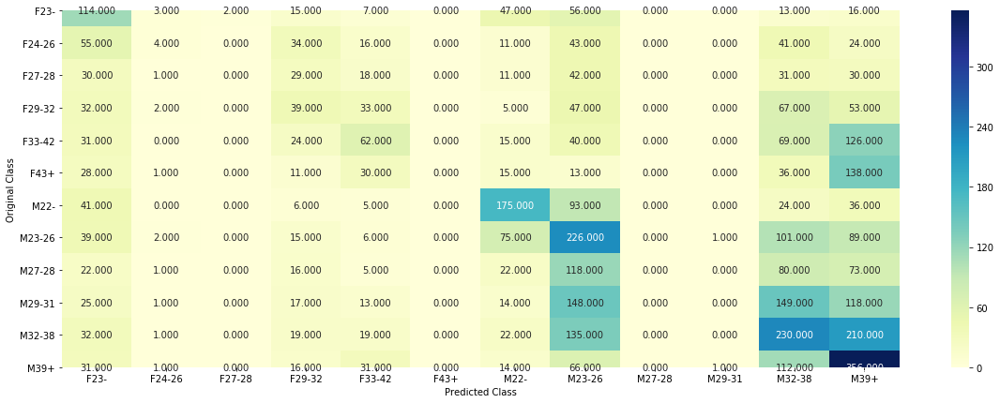

-------------------- Precision matrix (Columm Sum=1) --------------------


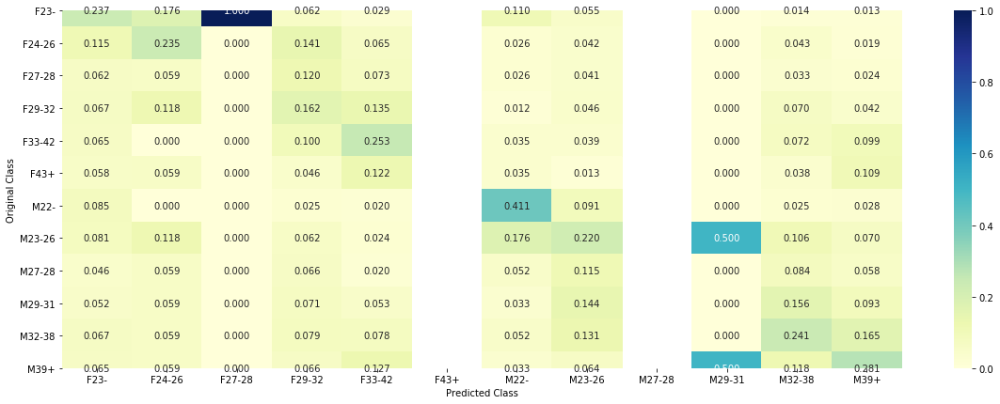

-------------------- Recall matrix (Row sum=1) --------------------


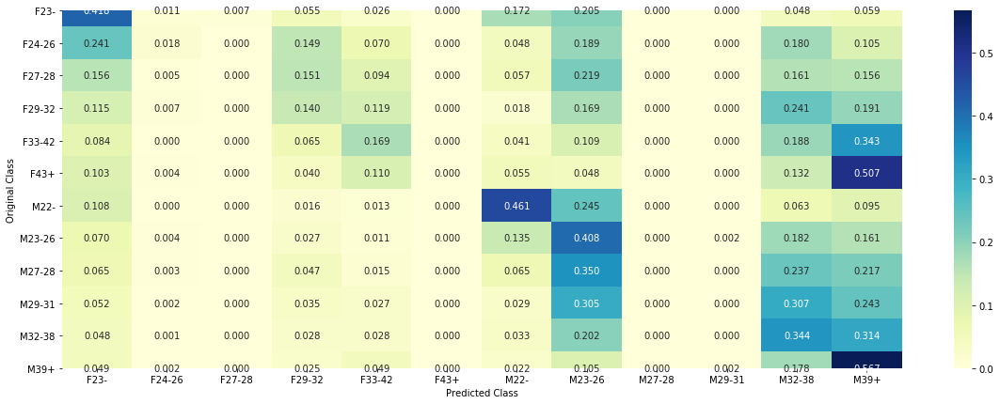

In [262]:
print("Train Log Loss :",log_loss(Y_events_train, rf_events_pred_train))
plot_confusion_matrix(Y_events_train,y_pred_events_train_classes_rf)

print("="*60)

print("CV Log Loss :",log_loss(Y_events_cv, rf_events_pred_cv))
plot_confusion_matrix(Y_events_cv,y_pred_events_cv_classes_rf)

In [309]:
y_events_pred_random_forest = rf_events_sig_clf.predict_proba(X_events_test)
# Multilabel class probalities are predicted
prediction_events_rf = pd.DataFrame(y_events_pred_random_forest,index = having_events_data_test.index,columns=targetencoder.classes_)
prediction_events_rf.head()
prediction_events_rf.to_csv("Predictions/prediction_events_rf.csv")

#### 5.2.6. Decision tree

In [264]:
from sklearn.tree import DecisionTreeClassifier
max_depth = [3, 4, 5, 6]
min_samples_split_values = [5,10,100,500]
for depth in max_depth:
    for min_sample in min_samples_split_values:
        dt_events_clf=DecisionTreeClassifier(min_samples_split=min_sample,max_depth=depth,class_weight='balanced')
        dt_events_clf.fit(X_events_train, Y_events_train)
        dt_events_sig_clf = CalibratedClassifierCV(dt_events_clf, method="sigmoid")
        dt_events_sig_clf.fit(X_events_train, Y_events_train)
        dt_events_predict_y = dt_events_sig_clf.predict_proba(X_events_cv)
        print ('log_loss for min_sample_split = ',min_sample,'and maxdepth =',depth,'is',log_loss(Y_events_cv, dt_events_predict_y, labels=dt_events_clf.classes_, eps=1e-15))

log_loss for min_sample_split =  5 and maxdepth = 3 is 2.315839347233516
log_loss for min_sample_split =  10 and maxdepth = 3 is 2.315839347233516
log_loss for min_sample_split =  100 and maxdepth = 3 is 2.315839347233516
log_loss for min_sample_split =  500 and maxdepth = 3 is 2.31707491638645
log_loss for min_sample_split =  5 and maxdepth = 4 is 2.30180234699013
log_loss for min_sample_split =  10 and maxdepth = 4 is 2.3018589548413813
log_loss for min_sample_split =  100 and maxdepth = 4 is 2.3013630958317686
log_loss for min_sample_split =  500 and maxdepth = 4 is 2.3020708580201035
log_loss for min_sample_split =  5 and maxdepth = 5 is 2.290405248033235
log_loss for min_sample_split =  10 and maxdepth = 5 is 2.2899796601859848
log_loss for min_sample_split =  100 and maxdepth = 5 is 2.2857231291819793
log_loss for min_sample_split =  500 and maxdepth = 5 is 2.286207462685353
log_loss for min_sample_split =  5 and maxdepth = 6 is 2.2902936563875276
log_loss for min_sample_split = 

In [265]:
dt_events_clf=DecisionTreeClassifier(min_samples_split=100,max_depth=5,class_weight='balanced')
dt_events_clf.fit(X_events_train, Y_events_train)
dt_events_sig_clf = CalibratedClassifierCV(dt_events_clf, method="sigmoid")
dt_events_sig_clf.fit(X_events_train, Y_events_train)
dt_events_predict_y = dt_events_sig_clf.predict_proba(X_events_cv)
print ('log_loss for min_sample_split = ',100,'and maxdepth =',5,'is',log_loss(Y_events_cv, dt_events_predict_y, labels=dt_events_clf.classes_, eps=1e-15))

log_loss for min_sample_split =  100 and maxdepth = 5 is 2.2857231291819793


In [266]:
dt_events_pred_train = dt_events_sig_clf.predict_proba(X_events_train)
print("Train Log-Loss is",log_loss(Y_events_train, dt_events_pred_train, labels=dt_events_clf.classes_, eps=1e-15))
dt_events_pred_cv = dt_events_sig_clf.predict_proba(X_events_cv)
print("CV Log-Loss is",log_loss(Y_events_cv, dt_events_pred_cv, labels=dt_events_clf.classes_, eps=1e-15))

Train Log-Loss is 2.2673973721615237
CV Log-Loss is 2.2857231291819793


In [267]:
y_pred_events_train_classes_dt = np.argmax(dt_events_pred_train, axis=1)
y_pred_events_cv_classes_dt = np.argmax(dt_events_pred_cv, axis=1)

Train Log Loss : 2.2673973721615237
-------------------- Confusion matrix --------------------


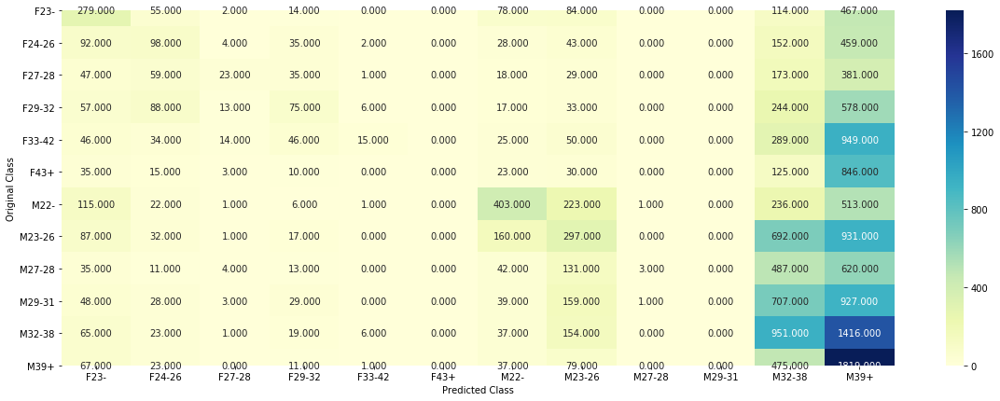

-------------------- Precision matrix (Columm Sum=1) --------------------


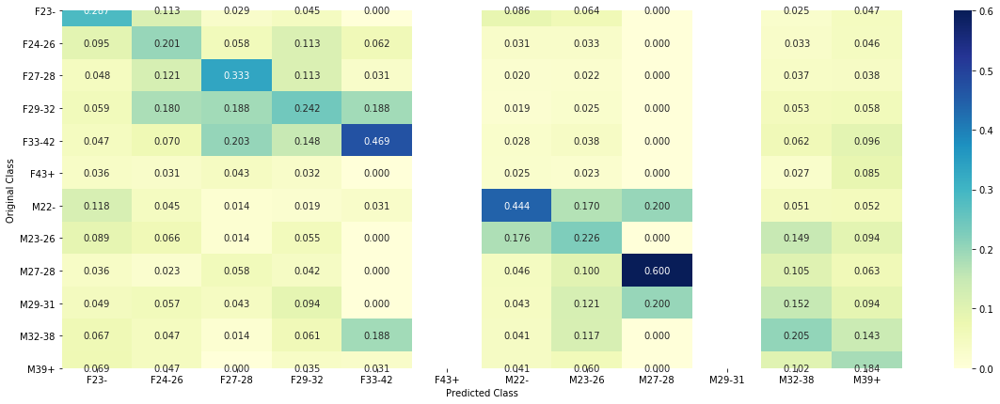

-------------------- Recall matrix (Row sum=1) --------------------


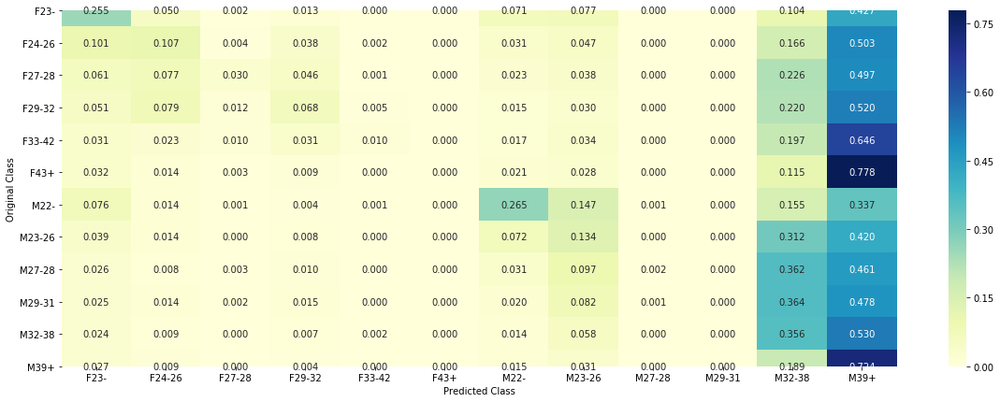

CV Log Loss : 2.2857231291819793
-------------------- Confusion matrix --------------------


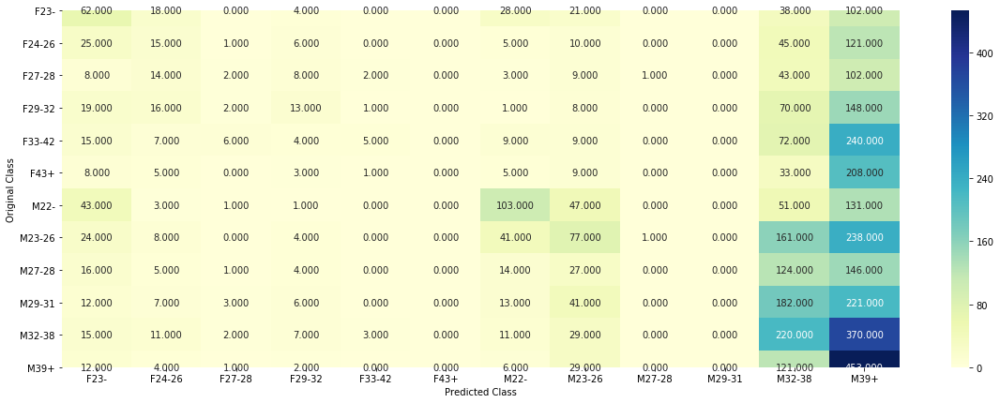

-------------------- Precision matrix (Columm Sum=1) --------------------


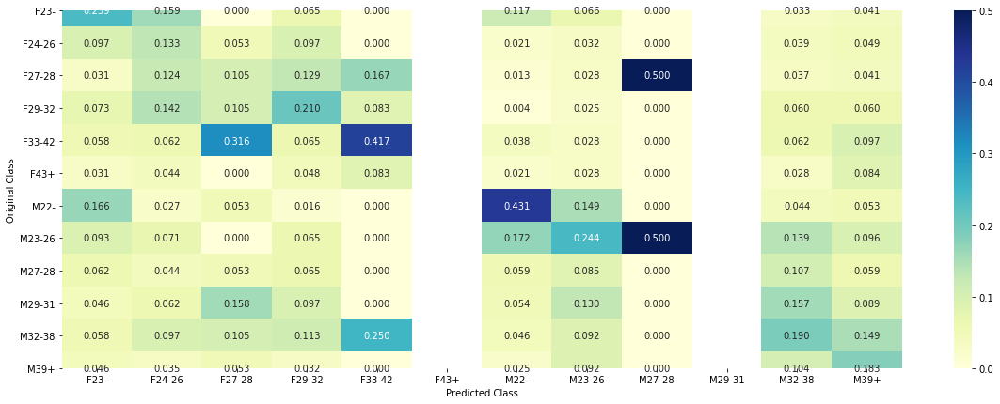

-------------------- Recall matrix (Row sum=1) --------------------


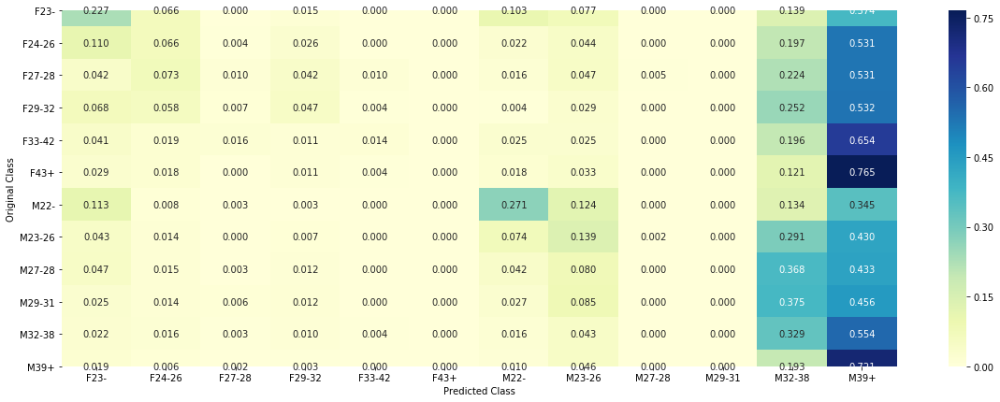

In [268]:
print("Train Log Loss :",log_loss(Y_events_train, dt_events_pred_train))
plot_confusion_matrix(Y_events_train,y_pred_events_train_classes_dt)

print("="*60)

print("CV Log Loss :",log_loss(Y_events_cv, dt_events_pred_cv))
plot_confusion_matrix(Y_events_cv,y_pred_events_cv_classes_dt)

In [271]:
y_events_pred_decision_tree = dt_events_sig_clf.predict_proba(X_events_test)

In [310]:
# Multilabel class probalities are predicted
prediction_events_dt = pd.DataFrame(y_events_pred_decision_tree,index = having_events_data_test.index,columns=targetencoder.classes_)
prediction_events_dt.head()
prediction_events_dt.to_csv("Predictions/prediction_events_dt.csv")

#### 5.2.7. Deep Learning - Neural Networks

##### Neural Network 1
Here the train data is trained from 20 times and validated against the cv data.
Then the average of all the predicted class labels are taken.

In [133]:
# #loading models
# model_2 = []
# for i in range(20):
#     model_2.append(load_model('Models/events_1/events_nn_1_'+str(i+1)+'.h5'))

In [134]:
#Coverting to categorical for NN
y_train_events=np_utils.to_categorical(Y_events_train)
y_cv_events=np_utils.to_categorical(Y_events_cv)

In [525]:
#https://www.kaggle.com/c/talkingdata-mobile-user-demographics/discussion/23424
#Refered From above kaggle dicussion
def model_events_nn_1(input_dim,output_dim):
    model = Sequential()
    model.add(Dropout(0.15, input_shape=(input_dim,)))
    model.add(Dense(240, init='uniform'))
    model.add(PReLU(init='zero'))
    model.add(Dropout(0.8))
    model.add(Dense(240, init='uniform'))
    model.add(PReLU(init='zero', weights=None))
    model.add(Dropout(0.35))
    model.add(Dense(260, init='uniform'))
    model.add(PReLU(init='zero', weights=None))
    model.add(Dropout(0.40))
    model.add(Dense(output_dim, init='uniform'))
    model.add(Activation('softmax'))

    opt = Adagrad(lr=0.008, epsilon=1e-08)
    model.compile(loss='categorical_crossentropy',
                  optimizer=opt,
                  metrics=['accuracy'])
    return model

In [526]:
model_events_1=model_events_nn_1(X_events_train.shape[1],12)
model_events_1.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_19 (Dropout)         (None, 21566)             0         
_________________________________________________________________
dense_28 (Dense)             (None, 240)               5176080   
_________________________________________________________________
p_re_lu_19 (PReLU)           (None, 240)               240       
_________________________________________________________________
dropout_20 (Dropout)         (None, 240)               0         
_________________________________________________________________
dense_29 (Dense)             (None, 240)               57840     
_________________________________________________________________
p_re_lu_20 (PReLU)           (None, 240)               240       
_________________________________________________________________
dropout_21 (Dropout)         (None, 240)             

In [530]:
model_2=[]
avg_cv_loss=0
for i in range(20):
    model=model_events_nn_1(X_events_train.shape[1],12)
    logdir = os.path.join("logs_events_1","Model_events_1."+str(i+1))
    t_callback=TensorBoard(log_dir=logdir)
    model.fit(X_events_train, y_train_events, batch_size=149, epochs=20, verbose=1, validation_data=(X_events_cv, y_cv_events),callbacks=[early_stop_1,t_callback])
    model_cv_prediction=model.predict_proba(X_events_cv)
    cv_loss=log_loss(Y_events_cv, model_cv_prediction)
    print("CV Log Loss of Best Weights Model in Current Run: ",cv_loss)
    model_2.append(model)
    avg_cv_loss+=cv_loss
avg_cv_loss/=n_models
print("Average CV Loss of "+str(n_models)+" Runs :",avg_cv_loss)
return model_2

Train on 18647 samples, validate on 4662 samples
Epoch 1/20
18647/18647 [==============================] - ETA: 41s - loss: 2.4761 - accuracy: 0.181 - ETA: 28s - loss: 2.4803 - accuracy: 0.164 - ETA: 25s - loss: 2.4717 - accuracy: 0.143 - ETA: 22s - loss: 2.4638 - accuracy: 0.146 - ETA: 21s - loss: 2.4573 - accuracy: 0.146 - ETA: 19s - loss: 2.4566 - accuracy: 0.143 - ETA: 19s - loss: 2.4467 - accuracy: 0.148 - ETA: 18s - loss: 2.4363 - accuracy: 0.148 - ETA: 17s - loss: 2.4400 - accuracy: 0.146 - ETA: 17s - loss: 2.4381 - accuracy: 0.145 - ETA: 17s - loss: 2.4319 - accuracy: 0.144 - ETA: 16s - loss: 2.4302 - accuracy: 0.142 - ETA: 16s - loss: 2.4210 - accuracy: 0.142 - ETA: 16s - loss: 2.4231 - accuracy: 0.143 - ETA: 16s - loss: 2.4224 - accuracy: 0.143 - ETA: 15s - loss: 2.4185 - accuracy: 0.144 - ETA: 15s - loss: 2.4175 - accuracy: 0.142 - ETA: 15s - loss: 2.4151 - accuracy: 0.142 - ETA: 15s - loss: 2.4124 - accuracy: 0.143 - ETA: 14s - loss: 2.4129 - accuracy: 0.141 - ETA: 14s - lo

18647/18647 [==============================] - ETA: 18s - loss: 2.1495 - accuracy: 0.194 - ETA: 18s - loss: 2.1105 - accuracy: 0.224 - ETA: 18s - loss: 2.0986 - accuracy: 0.232 - ETA: 18s - loss: 2.1481 - accuracy: 0.214 - ETA: 17s - loss: 2.1560 - accuracy: 0.206 - ETA: 17s - loss: 2.1516 - accuracy: 0.206 - ETA: 17s - loss: 2.1382 - accuracy: 0.208 - ETA: 16s - loss: 2.1444 - accuracy: 0.209 - ETA: 16s - loss: 2.1453 - accuracy: 0.214 - ETA: 16s - loss: 2.1385 - accuracy: 0.217 - ETA: 16s - loss: 2.1478 - accuracy: 0.212 - ETA: 16s - loss: 2.1494 - accuracy: 0.219 - ETA: 16s - loss: 2.1487 - accuracy: 0.224 - ETA: 16s - loss: 2.1471 - accuracy: 0.227 - ETA: 16s - loss: 2.1435 - accuracy: 0.228 - ETA: 16s - loss: 2.1476 - accuracy: 0.229 - ETA: 16s - loss: 2.1492 - accuracy: 0.230 - ETA: 15s - loss: 2.1549 - accuracy: 0.229 - ETA: 15s - loss: 2.1571 - accuracy: 0.227 - ETA: 15s - loss: 2.1587 - accuracy: 0.225 - ETA: 15s - loss: 2.1539 - accuracy: 0.229 - ETA: 15s - loss: 2.1512 - acc

18647/18647 [==============================] - ETA: 18s - loss: 2.0572 - accuracy: 0.261 - ETA: 18s - loss: 2.0805 - accuracy: 0.278 - ETA: 18s - loss: 2.0852 - accuracy: 0.264 - ETA: 18s - loss: 2.0934 - accuracy: 0.265 - ETA: 18s - loss: 2.0875 - accuracy: 0.260 - ETA: 18s - loss: 2.1118 - accuracy: 0.252 - ETA: 17s - loss: 2.0936 - accuracy: 0.269 - ETA: 17s - loss: 2.0912 - accuracy: 0.265 - ETA: 17s - loss: 2.0793 - accuracy: 0.269 - ETA: 17s - loss: 2.0824 - accuracy: 0.268 - ETA: 17s - loss: 2.0733 - accuracy: 0.270 - ETA: 17s - loss: 2.0728 - accuracy: 0.269 - ETA: 17s - loss: 2.0712 - accuracy: 0.270 - ETA: 16s - loss: 2.0802 - accuracy: 0.265 - ETA: 16s - loss: 2.0794 - accuracy: 0.261 - ETA: 16s - loss: 2.0810 - accuracy: 0.262 - ETA: 16s - loss: 2.0767 - accuracy: 0.261 - ETA: 16s - loss: 2.0794 - accuracy: 0.261 - ETA: 16s - loss: 2.0811 - accuracy: 0.263 - ETA: 16s - loss: 2.0815 - accuracy: 0.262 - ETA: 15s - loss: 2.0834 - accuracy: 0.262 - ETA: 15s - loss: 2.0799 - acc

18647/18647 [==============================] - ETA: 18s - loss: 2.1441 - accuracy: 0.275 - ETA: 19s - loss: 2.0659 - accuracy: 0.291 - ETA: 18s - loss: 2.0453 - accuracy: 0.295 - ETA: 18s - loss: 2.0769 - accuracy: 0.281 - ETA: 18s - loss: 2.0920 - accuracy: 0.277 - ETA: 17s - loss: 2.0690 - accuracy: 0.286 - ETA: 17s - loss: 2.0714 - accuracy: 0.289 - ETA: 17s - loss: 2.0652 - accuracy: 0.290 - ETA: 17s - loss: 2.0673 - accuracy: 0.285 - ETA: 17s - loss: 2.0564 - accuracy: 0.289 - ETA: 17s - loss: 2.0475 - accuracy: 0.291 - ETA: 16s - loss: 2.0461 - accuracy: 0.294 - ETA: 16s - loss: 2.0470 - accuracy: 0.291 - ETA: 16s - loss: 2.0477 - accuracy: 0.291 - ETA: 16s - loss: 2.0458 - accuracy: 0.290 - ETA: 16s - loss: 2.0535 - accuracy: 0.287 - ETA: 16s - loss: 2.0584 - accuracy: 0.284 - ETA: 16s - loss: 2.0557 - accuracy: 0.283 - ETA: 15s - loss: 2.0612 - accuracy: 0.280 - ETA: 15s - loss: 2.0579 - accuracy: 0.277 - ETA: 15s - loss: 2.0472 - accuracy: 0.282 - ETA: 15s - loss: 2.0419 - acc

18647/18647 [==============================] - ETA: 17s - loss: 2.0249 - accuracy: 0.315 - ETA: 18s - loss: 1.9783 - accuracy: 0.315 - ETA: 18s - loss: 1.9894 - accuracy: 0.313 - ETA: 18s - loss: 1.9967 - accuracy: 0.312 - ETA: 17s - loss: 1.9882 - accuracy: 0.311 - ETA: 17s - loss: 1.9881 - accuracy: 0.308 - ETA: 17s - loss: 1.9969 - accuracy: 0.302 - ETA: 17s - loss: 1.9921 - accuracy: 0.299 - ETA: 17s - loss: 1.9871 - accuracy: 0.296 - ETA: 17s - loss: 1.9783 - accuracy: 0.296 - ETA: 16s - loss: 1.9799 - accuracy: 0.297 - ETA: 16s - loss: 1.9905 - accuracy: 0.296 - ETA: 16s - loss: 1.9959 - accuracy: 0.296 - ETA: 16s - loss: 1.9848 - accuracy: 0.301 - ETA: 16s - loss: 1.9763 - accuracy: 0.302 - ETA: 16s - loss: 1.9774 - accuracy: 0.301 - ETA: 15s - loss: 1.9834 - accuracy: 0.302 - ETA: 15s - loss: 1.9730 - accuracy: 0.301 - ETA: 15s - loss: 1.9783 - accuracy: 0.300 - ETA: 15s - loss: 1.9784 - accuracy: 0.298 - ETA: 15s - loss: 1.9778 - accuracy: 0.299 - ETA: 15s - loss: 1.9840 - acc

18647/18647 [==============================] - ETA: 17s - loss: 1.9402 - accuracy: 0.315 - ETA: 17s - loss: 1.9620 - accuracy: 0.298 - ETA: 17s - loss: 1.9658 - accuracy: 0.315 - ETA: 17s - loss: 1.9609 - accuracy: 0.318 - ETA: 17s - loss: 1.9637 - accuracy: 0.306 - ETA: 17s - loss: 1.9509 - accuracy: 0.300 - ETA: 17s - loss: 1.9428 - accuracy: 0.304 - ETA: 17s - loss: 1.9441 - accuracy: 0.306 - ETA: 17s - loss: 1.9522 - accuracy: 0.299 - ETA: 17s - loss: 1.9465 - accuracy: 0.300 - ETA: 16s - loss: 1.9512 - accuracy: 0.297 - ETA: 16s - loss: 1.9447 - accuracy: 0.299 - ETA: 16s - loss: 1.9353 - accuracy: 0.304 - ETA: 16s - loss: 1.9496 - accuracy: 0.297 - ETA: 16s - loss: 1.9494 - accuracy: 0.300 - ETA: 16s - loss: 1.9471 - accuracy: 0.302 - ETA: 16s - loss: 1.9575 - accuracy: 0.302 - ETA: 15s - loss: 1.9586 - accuracy: 0.300 - ETA: 15s - loss: 1.9568 - accuracy: 0.301 - ETA: 15s - loss: 1.9556 - accuracy: 0.302 - ETA: 15s - loss: 1.9527 - accuracy: 0.303 - ETA: 15s - loss: 1.9515 - acc

18647/18647 [==============================] - ETA: 17s - loss: 1.9450 - accuracy: 0.261 - ETA: 18s - loss: 2.0064 - accuracy: 0.271 - ETA: 17s - loss: 1.9863 - accuracy: 0.293 - ETA: 17s - loss: 1.9733 - accuracy: 0.291 - ETA: 17s - loss: 1.9597 - accuracy: 0.306 - ETA: 17s - loss: 1.9608 - accuracy: 0.305 - ETA: 17s - loss: 1.9567 - accuracy: 0.304 - ETA: 17s - loss: 1.9713 - accuracy: 0.302 - ETA: 17s - loss: 1.9569 - accuracy: 0.309 - ETA: 17s - loss: 1.9495 - accuracy: 0.309 - ETA: 16s - loss: 1.9370 - accuracy: 0.309 - ETA: 16s - loss: 1.9354 - accuracy: 0.313 - ETA: 16s - loss: 1.9421 - accuracy: 0.307 - ETA: 16s - loss: 1.9337 - accuracy: 0.309 - ETA: 16s - loss: 1.9329 - accuracy: 0.311 - ETA: 16s - loss: 1.9349 - accuracy: 0.309 - ETA: 16s - loss: 1.9360 - accuracy: 0.307 - ETA: 15s - loss: 1.9300 - accuracy: 0.308 - ETA: 15s - loss: 1.9335 - accuracy: 0.308 - ETA: 15s - loss: 1.9302 - accuracy: 0.309 - ETA: 15s - loss: 1.9328 - accuracy: 0.307 - ETA: 15s - loss: 1.9381 - acc

18647/18647 [==============================] - ETA: 18s - loss: 1.8328 - accuracy: 0.302 - ETA: 18s - loss: 1.8876 - accuracy: 0.312 - ETA: 18s - loss: 1.9021 - accuracy: 0.311 - ETA: 18s - loss: 1.9065 - accuracy: 0.313 - ETA: 18s - loss: 1.9084 - accuracy: 0.318 - ETA: 19s - loss: 1.9217 - accuracy: 0.319 - ETA: 19s - loss: 1.9140 - accuracy: 0.318 - ETA: 19s - loss: 1.9148 - accuracy: 0.321 - ETA: 19s - loss: 1.9139 - accuracy: 0.322 - ETA: 18s - loss: 1.9119 - accuracy: 0.324 - ETA: 18s - loss: 1.9097 - accuracy: 0.327 - ETA: 18s - loss: 1.9210 - accuracy: 0.323 - ETA: 18s - loss: 1.9265 - accuracy: 0.321 - ETA: 18s - loss: 1.9356 - accuracy: 0.314 - ETA: 18s - loss: 1.9251 - accuracy: 0.316 - ETA: 18s - loss: 1.9299 - accuracy: 0.314 - ETA: 18s - loss: 1.9296 - accuracy: 0.313 - ETA: 17s - loss: 1.9380 - accuracy: 0.311 - ETA: 17s - loss: 1.9349 - accuracy: 0.311 - ETA: 17s - loss: 1.9317 - accuracy: 0.311 - ETA: 17s - loss: 1.9379 - accuracy: 0.309 - ETA: 17s - loss: 1.9388 - acc

18647/18647 [==============================] - ETA: 17s - loss: 1.8640 - accuracy: 0.349 - ETA: 17s - loss: 1.8410 - accuracy: 0.362 - ETA: 18s - loss: 1.8553 - accuracy: 0.331 - ETA: 17s - loss: 1.8644 - accuracy: 0.327 - ETA: 17s - loss: 1.8828 - accuracy: 0.319 - ETA: 17s - loss: 1.8735 - accuracy: 0.309 - ETA: 17s - loss: 1.8711 - accuracy: 0.313 - ETA: 17s - loss: 1.8765 - accuracy: 0.317 - ETA: 17s - loss: 1.8816 - accuracy: 0.312 - ETA: 17s - loss: 1.8943 - accuracy: 0.309 - ETA: 16s - loss: 1.9021 - accuracy: 0.307 - ETA: 16s - loss: 1.9131 - accuracy: 0.305 - ETA: 16s - loss: 1.9140 - accuracy: 0.304 - ETA: 16s - loss: 1.9181 - accuracy: 0.303 - ETA: 16s - loss: 1.9261 - accuracy: 0.302 - ETA: 16s - loss: 1.9317 - accuracy: 0.299 - ETA: 16s - loss: 1.9270 - accuracy: 0.302 - ETA: 15s - loss: 1.9262 - accuracy: 0.302 - ETA: 15s - loss: 1.9268 - accuracy: 0.303 - ETA: 15s - loss: 1.9293 - accuracy: 0.304 - ETA: 15s - loss: 1.9243 - accuracy: 0.303 - ETA: 15s - loss: 1.9247 - acc

18647/18647 [==============================] - ETA: 18s - loss: 1.8365 - accuracy: 0.342 - ETA: 18s - loss: 1.9457 - accuracy: 0.318 - ETA: 18s - loss: 1.8864 - accuracy: 0.326 - ETA: 18s - loss: 1.8605 - accuracy: 0.330 - ETA: 18s - loss: 1.8881 - accuracy: 0.323 - ETA: 18s - loss: 1.8657 - accuracy: 0.334 - ETA: 18s - loss: 1.8794 - accuracy: 0.335 - ETA: 17s - loss: 1.8732 - accuracy: 0.333 - ETA: 17s - loss: 1.8670 - accuracy: 0.331 - ETA: 17s - loss: 1.8536 - accuracy: 0.333 - ETA: 17s - loss: 1.8605 - accuracy: 0.334 - ETA: 17s - loss: 1.8738 - accuracy: 0.327 - ETA: 17s - loss: 1.8739 - accuracy: 0.328 - ETA: 17s - loss: 1.8811 - accuracy: 0.324 - ETA: 17s - loss: 1.8809 - accuracy: 0.325 - ETA: 16s - loss: 1.8813 - accuracy: 0.325 - ETA: 16s - loss: 1.8824 - accuracy: 0.321 - ETA: 16s - loss: 1.8811 - accuracy: 0.324 - ETA: 16s - loss: 1.8801 - accuracy: 0.325 - ETA: 16s - loss: 1.8755 - accuracy: 0.328 - ETA: 15s - loss: 1.8702 - accuracy: 0.328 - ETA: 15s - loss: 1.8686 - acc

18647/18647 [==============================] - ETA: 17s - loss: 1.8323 - accuracy: 0.382 - ETA: 17s - loss: 1.8499 - accuracy: 0.355 - ETA: 17s - loss: 1.8981 - accuracy: 0.337 - ETA: 17s - loss: 1.8752 - accuracy: 0.340 - ETA: 17s - loss: 1.8651 - accuracy: 0.357 - ETA: 16s - loss: 1.8630 - accuracy: 0.355 - ETA: 16s - loss: 1.8655 - accuracy: 0.350 - ETA: 16s - loss: 1.8827 - accuracy: 0.350 - ETA: 16s - loss: 1.8817 - accuracy: 0.349 - ETA: 16s - loss: 1.8768 - accuracy: 0.349 - ETA: 16s - loss: 1.8806 - accuracy: 0.341 - ETA: 16s - loss: 1.8807 - accuracy: 0.338 - ETA: 16s - loss: 1.8727 - accuracy: 0.342 - ETA: 16s - loss: 1.8792 - accuracy: 0.342 - ETA: 15s - loss: 1.8724 - accuracy: 0.342 - ETA: 15s - loss: 1.8673 - accuracy: 0.345 - ETA: 15s - loss: 1.8632 - accuracy: 0.345 - ETA: 15s - loss: 1.8650 - accuracy: 0.343 - ETA: 15s - loss: 1.8626 - accuracy: 0.343 - ETA: 15s - loss: 1.8659 - accuracy: 0.341 - ETA: 15s - loss: 1.8647 - accuracy: 0.342 - ETA: 15s - loss: 1.8639 - acc

18647/18647 [==============================] - ETA: 17s - loss: 1.9113 - accuracy: 0.349 - ETA: 17s - loss: 1.8346 - accuracy: 0.375 - ETA: 17s - loss: 1.9064 - accuracy: 0.346 - ETA: 17s - loss: 1.8721 - accuracy: 0.355 - ETA: 17s - loss: 1.8623 - accuracy: 0.350 - ETA: 16s - loss: 1.8533 - accuracy: 0.361 - ETA: 17s - loss: 1.8577 - accuracy: 0.359 - ETA: 16s - loss: 1.8707 - accuracy: 0.344 - ETA: 16s - loss: 1.8623 - accuracy: 0.346 - ETA: 16s - loss: 1.8515 - accuracy: 0.350 - ETA: 16s - loss: 1.8464 - accuracy: 0.345 - ETA: 16s - loss: 1.8476 - accuracy: 0.343 - ETA: 16s - loss: 1.8511 - accuracy: 0.336 - ETA: 16s - loss: 1.8477 - accuracy: 0.332 - ETA: 16s - loss: 1.8535 - accuracy: 0.331 - ETA: 16s - loss: 1.8477 - accuracy: 0.332 - ETA: 15s - loss: 1.8499 - accuracy: 0.331 - ETA: 15s - loss: 1.8530 - accuracy: 0.331 - ETA: 15s - loss: 1.8511 - accuracy: 0.333 - ETA: 15s - loss: 1.8469 - accuracy: 0.334 - ETA: 15s - loss: 1.8494 - accuracy: 0.335 - ETA: 15s - loss: 1.8496 - acc

18647/18647 [==============================] - ETA: 20s - loss: 1.7817 - accuracy: 0.369 - ETA: 21s - loss: 1.7580 - accuracy: 0.372 - ETA: 21s - loss: 1.8046 - accuracy: 0.357 - ETA: 20s - loss: 1.8079 - accuracy: 0.354 - ETA: 20s - loss: 1.8050 - accuracy: 0.349 - ETA: 20s - loss: 1.7932 - accuracy: 0.354 - ETA: 20s - loss: 1.7791 - accuracy: 0.368 - ETA: 19s - loss: 1.7751 - accuracy: 0.372 - ETA: 19s - loss: 1.7912 - accuracy: 0.369 - ETA: 19s - loss: 1.7924 - accuracy: 0.371 - ETA: 19s - loss: 1.7981 - accuracy: 0.369 - ETA: 19s - loss: 1.8032 - accuracy: 0.363 - ETA: 19s - loss: 1.7986 - accuracy: 0.365 - ETA: 19s - loss: 1.8045 - accuracy: 0.361 - ETA: 19s - loss: 1.8059 - accuracy: 0.359 - ETA: 19s - loss: 1.8075 - accuracy: 0.357 - ETA: 18s - loss: 1.7980 - accuracy: 0.359 - ETA: 18s - loss: 1.7902 - accuracy: 0.361 - ETA: 18s - loss: 1.7855 - accuracy: 0.364 - ETA: 18s - loss: 1.7885 - accuracy: 0.362 - ETA: 17s - loss: 1.7907 - accuracy: 0.363 - ETA: 17s - loss: 1.7948 - acc

18647/18647 [==============================] - ETA: 18s - loss: 1.8266 - accuracy: 0.396 - ETA: 18s - loss: 1.7654 - accuracy: 0.426 - ETA: 19s - loss: 1.7759 - accuracy: 0.411 - ETA: 19s - loss: 1.7730 - accuracy: 0.402 - ETA: 18s - loss: 1.7688 - accuracy: 0.387 - ETA: 18s - loss: 1.8062 - accuracy: 0.365 - ETA: 18s - loss: 1.8201 - accuracy: 0.358 - ETA: 18s - loss: 1.8181 - accuracy: 0.359 - ETA: 18s - loss: 1.8172 - accuracy: 0.358 - ETA: 17s - loss: 1.8167 - accuracy: 0.357 - ETA: 17s - loss: 1.8124 - accuracy: 0.360 - ETA: 17s - loss: 1.8031 - accuracy: 0.366 - ETA: 17s - loss: 1.8012 - accuracy: 0.365 - ETA: 17s - loss: 1.7917 - accuracy: 0.366 - ETA: 17s - loss: 1.8005 - accuracy: 0.364 - ETA: 16s - loss: 1.8003 - accuracy: 0.364 - ETA: 16s - loss: 1.8085 - accuracy: 0.360 - ETA: 16s - loss: 1.8059 - accuracy: 0.364 - ETA: 16s - loss: 1.8198 - accuracy: 0.358 - ETA: 16s - loss: 1.8165 - accuracy: 0.360 - ETA: 16s - loss: 1.8120 - accuracy: 0.361 - ETA: 15s - loss: 1.8105 - acc

18647/18647 [==============================] - ETA: 18s - loss: 1.7473 - accuracy: 0.382 - ETA: 19s - loss: 1.7956 - accuracy: 0.369 - ETA: 18s - loss: 1.8604 - accuracy: 0.353 - ETA: 19s - loss: 1.8405 - accuracy: 0.360 - ETA: 19s - loss: 1.8752 - accuracy: 0.334 - ETA: 19s - loss: 1.8649 - accuracy: 0.332 - ETA: 19s - loss: 1.8553 - accuracy: 0.333 - ETA: 19s - loss: 1.8447 - accuracy: 0.334 - ETA: 19s - loss: 1.8416 - accuracy: 0.338 - ETA: 19s - loss: 1.8400 - accuracy: 0.341 - ETA: 19s - loss: 1.8434 - accuracy: 0.341 - ETA: 19s - loss: 1.8448 - accuracy: 0.340 - ETA: 19s - loss: 1.8284 - accuracy: 0.344 - ETA: 19s - loss: 1.8313 - accuracy: 0.344 - ETA: 19s - loss: 1.8353 - accuracy: 0.345 - ETA: 18s - loss: 1.8374 - accuracy: 0.344 - ETA: 18s - loss: 1.8402 - accuracy: 0.347 - ETA: 18s - loss: 1.8356 - accuracy: 0.350 - ETA: 18s - loss: 1.8289 - accuracy: 0.351 - ETA: 18s - loss: 1.8272 - accuracy: 0.351 - ETA: 17s - loss: 1.8234 - accuracy: 0.351 - ETA: 17s - loss: 1.8215 - acc

18647/18647 [==============================] - ETA: 17s - loss: 1.7951 - accuracy: 0.375 - ETA: 17s - loss: 1.8424 - accuracy: 0.352 - ETA: 17s - loss: 1.8225 - accuracy: 0.357 - ETA: 17s - loss: 1.8231 - accuracy: 0.350 - ETA: 17s - loss: 1.8169 - accuracy: 0.342 - ETA: 17s - loss: 1.8302 - accuracy: 0.346 - ETA: 17s - loss: 1.8133 - accuracy: 0.348 - ETA: 17s - loss: 1.8182 - accuracy: 0.349 - ETA: 17s - loss: 1.8102 - accuracy: 0.346 - ETA: 17s - loss: 1.8108 - accuracy: 0.345 - ETA: 17s - loss: 1.8204 - accuracy: 0.345 - ETA: 17s - loss: 1.8076 - accuracy: 0.351 - ETA: 16s - loss: 1.8026 - accuracy: 0.355 - ETA: 16s - loss: 1.8113 - accuracy: 0.352 - ETA: 16s - loss: 1.8117 - accuracy: 0.356 - ETA: 16s - loss: 1.8091 - accuracy: 0.358 - ETA: 16s - loss: 1.8156 - accuracy: 0.355 - ETA: 16s - loss: 1.8111 - accuracy: 0.356 - ETA: 15s - loss: 1.8083 - accuracy: 0.356 - ETA: 15s - loss: 1.8074 - accuracy: 0.356 - ETA: 15s - loss: 1.8088 - accuracy: 0.357 - ETA: 15s - loss: 1.8046 - acc

18647/18647 [==============================] - ETA: 17s - loss: 1.7710 - accuracy: 0.402 - ETA: 18s - loss: 1.7299 - accuracy: 0.385 - ETA: 18s - loss: 1.7226 - accuracy: 0.369 - ETA: 18s - loss: 1.7544 - accuracy: 0.370 - ETA: 18s - loss: 1.7616 - accuracy: 0.362 - ETA: 18s - loss: 1.7791 - accuracy: 0.352 - ETA: 18s - loss: 1.7790 - accuracy: 0.353 - ETA: 18s - loss: 1.7948 - accuracy: 0.353 - ETA: 20s - loss: 1.7995 - accuracy: 0.360 - ETA: 20s - loss: 1.8031 - accuracy: 0.359 - ETA: 19s - loss: 1.7985 - accuracy: 0.356 - ETA: 19s - loss: 1.7941 - accuracy: 0.358 - ETA: 19s - loss: 1.7899 - accuracy: 0.357 - ETA: 18s - loss: 1.7879 - accuracy: 0.354 - ETA: 18s - loss: 1.7827 - accuracy: 0.359 - ETA: 18s - loss: 1.7788 - accuracy: 0.360 - ETA: 18s - loss: 1.7791 - accuracy: 0.357 - ETA: 17s - loss: 1.7818 - accuracy: 0.357 - ETA: 17s - loss: 1.7752 - accuracy: 0.358 - ETA: 17s - loss: 1.7824 - accuracy: 0.356 - ETA: 17s - loss: 1.7845 - accuracy: 0.354 - ETA: 16s - loss: 1.7781 - acc

18647/18647 [==============================] - ETA: 17s - loss: 1.8964 - accuracy: 0.355 - ETA: 17s - loss: 1.7759 - accuracy: 0.372 - ETA: 17s - loss: 1.7637 - accuracy: 0.364 - ETA: 17s - loss: 1.7757 - accuracy: 0.347 - ETA: 17s - loss: 1.7640 - accuracy: 0.361 - ETA: 17s - loss: 1.7552 - accuracy: 0.361 - ETA: 17s - loss: 1.7619 - accuracy: 0.361 - ETA: 17s - loss: 1.7904 - accuracy: 0.348 - ETA: 16s - loss: 1.7934 - accuracy: 0.352 - ETA: 16s - loss: 1.7846 - accuracy: 0.352 - ETA: 16s - loss: 1.7815 - accuracy: 0.353 - ETA: 16s - loss: 1.7804 - accuracy: 0.352 - ETA: 16s - loss: 1.7825 - accuracy: 0.350 - ETA: 17s - loss: 1.7804 - accuracy: 0.353 - ETA: 17s - loss: 1.7747 - accuracy: 0.354 - ETA: 17s - loss: 1.7741 - accuracy: 0.357 - ETA: 17s - loss: 1.7753 - accuracy: 0.358 - ETA: 16s - loss: 1.7738 - accuracy: 0.359 - ETA: 16s - loss: 1.7720 - accuracy: 0.359 - ETA: 16s - loss: 1.7674 - accuracy: 0.362 - ETA: 16s - loss: 1.7700 - accuracy: 0.362 - ETA: 16s - loss: 1.7687 - acc

18647/18647 [==============================] - ETA: 16s - loss: 1.8220 - accuracy: 0.302 - ETA: 17s - loss: 1.7979 - accuracy: 0.305 - ETA: 17s - loss: 1.7913 - accuracy: 0.322 - ETA: 16s - loss: 1.7949 - accuracy: 0.328 - ETA: 16s - loss: 1.7820 - accuracy: 0.342 - ETA: 16s - loss: 1.7911 - accuracy: 0.347 - ETA: 16s - loss: 1.7692 - accuracy: 0.359 - ETA: 16s - loss: 1.7722 - accuracy: 0.356 - ETA: 16s - loss: 1.7749 - accuracy: 0.356 - ETA: 16s - loss: 1.7746 - accuracy: 0.355 - ETA: 16s - loss: 1.7756 - accuracy: 0.355 - ETA: 16s - loss: 1.7796 - accuracy: 0.354 - ETA: 16s - loss: 1.7825 - accuracy: 0.353 - ETA: 15s - loss: 1.7776 - accuracy: 0.356 - ETA: 15s - loss: 1.7812 - accuracy: 0.356 - ETA: 15s - loss: 1.7790 - accuracy: 0.358 - ETA: 15s - loss: 1.7696 - accuracy: 0.361 - ETA: 15s - loss: 1.7670 - accuracy: 0.365 - ETA: 15s - loss: 1.7726 - accuracy: 0.363 - ETA: 15s - loss: 1.7750 - accuracy: 0.364 - ETA: 15s - loss: 1.7723 - accuracy: 0.366 - ETA: 14s - loss: 1.7729 - acc

18647/18647 [==============================] - ETA: 16s - loss: 1.7210 - accuracy: 0.382 - ETA: 16s - loss: 1.7404 - accuracy: 0.345 - ETA: 16s - loss: 1.7126 - accuracy: 0.355 - ETA: 16s - loss: 1.7690 - accuracy: 0.349 - ETA: 16s - loss: 1.7872 - accuracy: 0.347 - ETA: 16s - loss: 1.7784 - accuracy: 0.351 - ETA: 16s - loss: 1.7860 - accuracy: 0.354 - ETA: 16s - loss: 1.7820 - accuracy: 0.350 - ETA: 16s - loss: 1.7693 - accuracy: 0.356 - ETA: 16s - loss: 1.7648 - accuracy: 0.357 - ETA: 16s - loss: 1.7551 - accuracy: 0.361 - ETA: 16s - loss: 1.7550 - accuracy: 0.363 - ETA: 16s - loss: 1.7618 - accuracy: 0.359 - ETA: 15s - loss: 1.7654 - accuracy: 0.355 - ETA: 15s - loss: 1.7588 - accuracy: 0.359 - ETA: 15s - loss: 1.7615 - accuracy: 0.358 - ETA: 15s - loss: 1.7576 - accuracy: 0.363 - ETA: 15s - loss: 1.7531 - accuracy: 0.365 - ETA: 15s - loss: 1.7505 - accuracy: 0.366 - ETA: 15s - loss: 1.7583 - accuracy: 0.367 - ETA: 15s - loss: 1.7624 - accuracy: 0.366 - ETA: 15s - loss: 1.7551 - acc

18647/18647 [==============================] - ETA: 33s - loss: 2.4905 - accuracy: 0.067 - ETA: 24s - loss: 2.4780 - accuracy: 0.080 - ETA: 22s - loss: 2.4597 - accuracy: 0.105 - ETA: 20s - loss: 2.4503 - accuracy: 0.100 - ETA: 19s - loss: 2.4491 - accuracy: 0.108 - ETA: 19s - loss: 2.4448 - accuracy: 0.117 - ETA: 18s - loss: 2.4467 - accuracy: 0.117 - ETA: 18s - loss: 2.4387 - accuracy: 0.122 - ETA: 17s - loss: 2.4382 - accuracy: 0.130 - ETA: 17s - loss: 2.4393 - accuracy: 0.128 - ETA: 17s - loss: 2.4388 - accuracy: 0.125 - ETA: 16s - loss: 2.4371 - accuracy: 0.125 - ETA: 16s - loss: 2.4300 - accuracy: 0.126 - ETA: 16s - loss: 2.4248 - accuracy: 0.128 - ETA: 16s - loss: 2.4193 - accuracy: 0.131 - ETA: 16s - loss: 2.4154 - accuracy: 0.133 - ETA: 16s - loss: 2.4127 - accuracy: 0.136 - ETA: 16s - loss: 2.4105 - accuracy: 0.138 - ETA: 15s - loss: 2.4091 - accuracy: 0.138 - ETA: 15s - loss: 2.4057 - accuracy: 0.136 - ETA: 15s - loss: 2.4059 - accuracy: 0.139 - ETA: 15s - loss: 2.4018 - acc

18647/18647 [==============================] - ETA: 17s - loss: 2.2410 - accuracy: 0.214 - ETA: 18s - loss: 2.2334 - accuracy: 0.218 - ETA: 19s - loss: 2.2479 - accuracy: 0.208 - ETA: 19s - loss: 2.2100 - accuracy: 0.213 - ETA: 19s - loss: 2.1860 - accuracy: 0.236 - ETA: 20s - loss: 2.1829 - accuracy: 0.231 - ETA: 20s - loss: 2.1902 - accuracy: 0.226 - ETA: 20s - loss: 2.1803 - accuracy: 0.224 - ETA: 19s - loss: 2.1861 - accuracy: 0.226 - ETA: 19s - loss: 2.1849 - accuracy: 0.220 - ETA: 19s - loss: 2.1937 - accuracy: 0.219 - ETA: 19s - loss: 2.1909 - accuracy: 0.223 - ETA: 19s - loss: 2.1845 - accuracy: 0.224 - ETA: 19s - loss: 2.1872 - accuracy: 0.228 - ETA: 19s - loss: 2.1860 - accuracy: 0.228 - ETA: 18s - loss: 2.1889 - accuracy: 0.227 - ETA: 18s - loss: 2.1883 - accuracy: 0.228 - ETA: 18s - loss: 2.1889 - accuracy: 0.229 - ETA: 18s - loss: 2.1923 - accuracy: 0.226 - ETA: 18s - loss: 2.1904 - accuracy: 0.227 - ETA: 18s - loss: 2.1886 - accuracy: 0.228 - ETA: 17s - loss: 2.1843 - acc

18647/18647 [==============================] - ETA: 23s - loss: 1.9612 - accuracy: 0.308 - ETA: 23s - loss: 1.9853 - accuracy: 0.288 - ETA: 23s - loss: 2.0271 - accuracy: 0.270 - ETA: 22s - loss: 2.0311 - accuracy: 0.263 - ETA: 22s - loss: 2.0284 - accuracy: 0.260 - ETA: 22s - loss: 2.0525 - accuracy: 0.250 - ETA: 22s - loss: 2.0573 - accuracy: 0.249 - ETA: 22s - loss: 2.0578 - accuracy: 0.251 - ETA: 22s - loss: 2.0647 - accuracy: 0.258 - ETA: 22s - loss: 2.0757 - accuracy: 0.255 - ETA: 22s - loss: 2.0770 - accuracy: 0.255 - ETA: 22s - loss: 2.0751 - accuracy: 0.253 - ETA: 21s - loss: 2.0803 - accuracy: 0.253 - ETA: 21s - loss: 2.0824 - accuracy: 0.255 - ETA: 21s - loss: 2.0816 - accuracy: 0.255 - ETA: 21s - loss: 2.0807 - accuracy: 0.257 - ETA: 21s - loss: 2.0837 - accuracy: 0.256 - ETA: 21s - loss: 2.0857 - accuracy: 0.256 - ETA: 20s - loss: 2.0874 - accuracy: 0.257 - ETA: 20s - loss: 2.0894 - accuracy: 0.259 - ETA: 20s - loss: 2.0868 - accuracy: 0.258 - ETA: 20s - loss: 2.0871 - acc

KeyboardInterrupt: 

In [ ]:
# #Saving Models
# for i in range(len(model_2)):
#     model_2[i].save('Models/events_1/events_nn_1_'+str(i+1)+'.h5')  

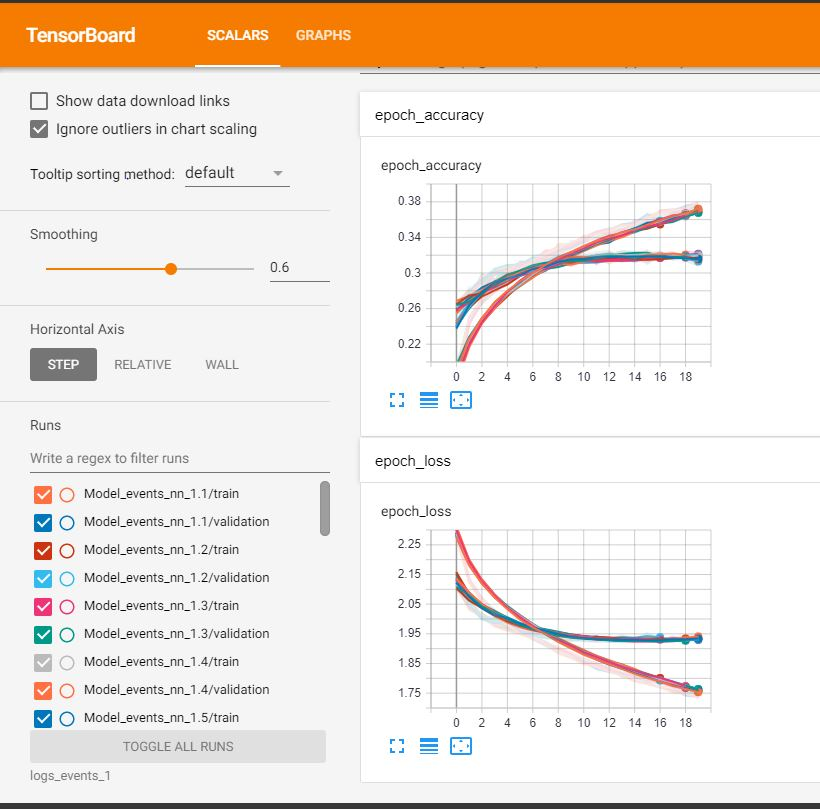

In [182]:
Image('Pred/tensorboard3.jpg')

##### Train Prediction And Confusion matrix

In [135]:
train_pred_avg_events_1=np.zeros((X_events_train.shape[0],12))
#Taking average of all the model predictions
for i in range(len(model_2)):
    train_pred=model_2[i].predict_proba(X_events_train)
    train_pred_avg_events_1+=train_pred
train_pred_avg_events_1/=len(model_2)

Train Average Log-Loss:  1.5883830015371585
-------------------- Confusion matrix --------------------


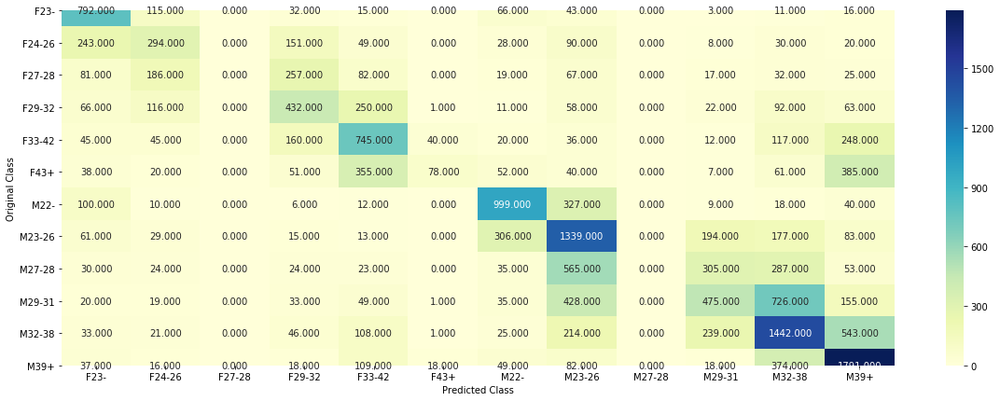

-------------------- Precision matrix (Columm Sum=1) --------------------


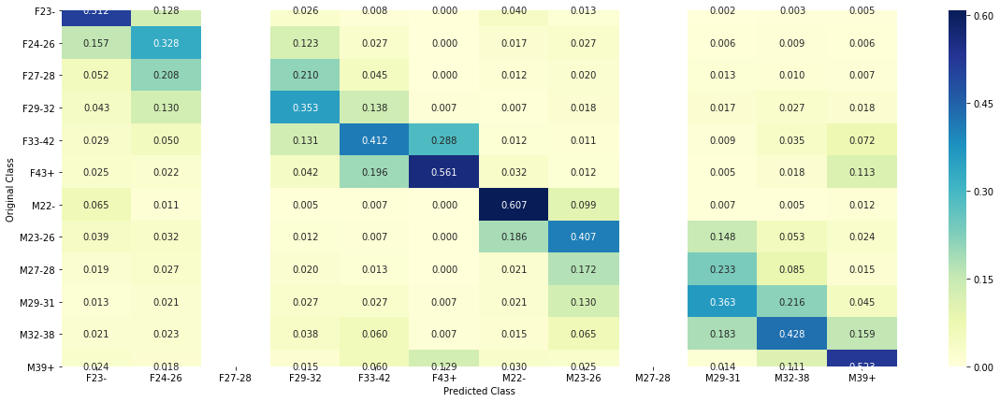

-------------------- Recall matrix (Row sum=1) --------------------


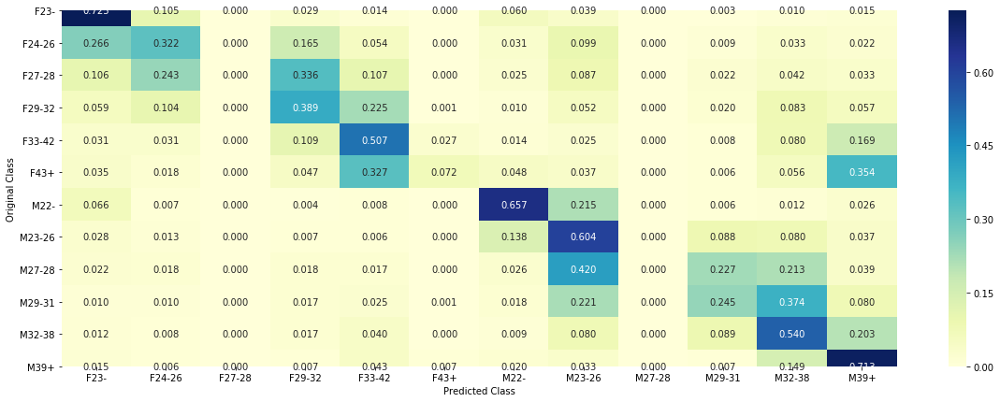

In [136]:
print("Train Average Log-Loss: ",log_loss(Y_events_train, train_pred_avg_events_1))
events_nn_1_avg_train_predicted_classes=np.argmax(train_pred_avg_events_1, axis=1)
plot_confusion_matrix(Y_events_train,events_nn_1_avg_train_predicted_classes)

#### CV Prediction and Confusion matrix

In [137]:
cv_pred_avg_events_1=np.zeros((X_events_cv.shape[0],12))
#Taking average of all the model predictions
for i in range(len(model_2)):
    cv_pred=model_2[i].predict_proba(X_events_cv)
    cv_pred_avg_events_1+=cv_pred
cv_pred_avg_events_1/=len(model_2)

CV Average Log-Loss:  1.906501488636026
-------------------- Confusion matrix --------------------


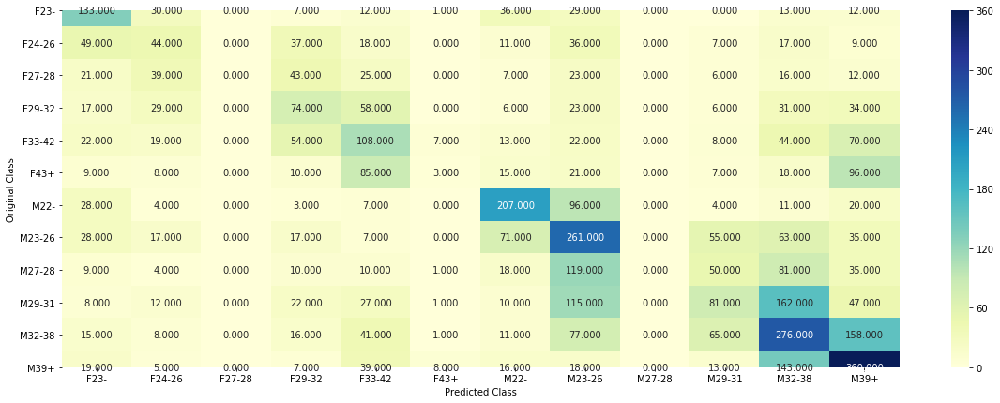

-------------------- Precision matrix (Columm Sum=1) --------------------


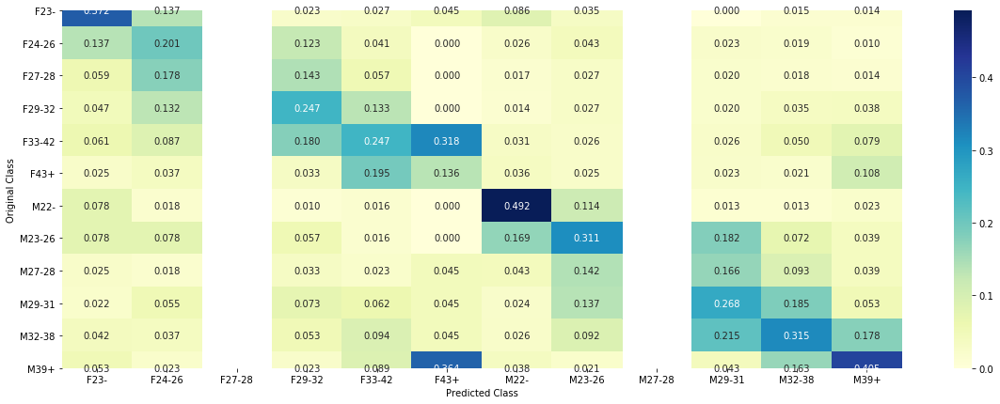

-------------------- Recall matrix (Row sum=1) --------------------


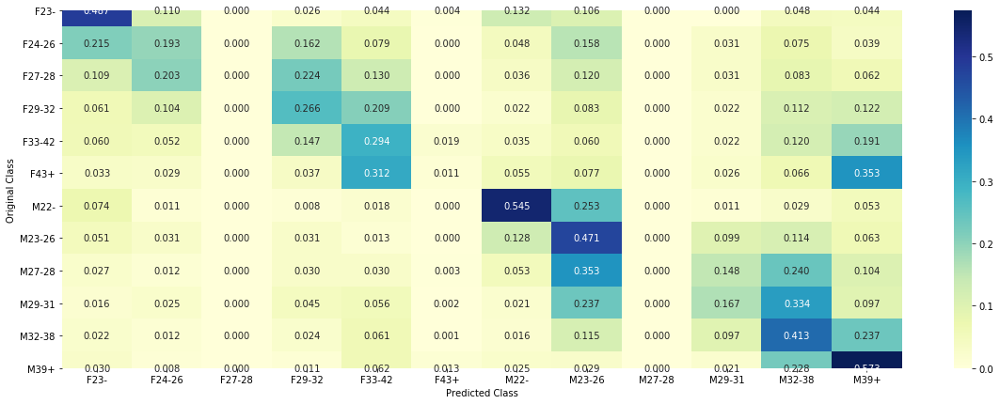

In [138]:
print("CV Average Log-Loss: ",log_loss(Y_events_cv, cv_pred_avg_events_1))
events_nn_1_avg_cv_predicted_classes=np.argmax(cv_pred_avg_events_1, axis=1)
plot_confusion_matrix(Y_events_cv,events_nn_1_avg_cv_predicted_classes)

##### Test Prediction

In [139]:
test_pred_avg_events_1=np.zeros((X_events_test.shape[0],12))
#Taking average of all the model predictions
for i in range(len(model_2)):
    test_pred=model_2[i].predict_proba(X_events_test.tocsr())
    test_pred_avg_events_1+=test_pred
test_pred_avg_events_1/=len(model_2)

##### Neural Network 2
Here the train data is trained from 20 times and validated against the cv data.
Then the average of all the predicted class labels are taken.

In [140]:
# #Loading the Models
# model_3 = []
# for i in range(20):
#     model_3.append(load_model('Models/events_2/events_nn_2_'+str(i+1)+'.h5'))

In [531]:
#https://github.com/chechir/talking_data
#Refered from the above github link
def model_events_nn_2(input_dim,output_dim):
    model = Sequential()
    model.add(Dropout(0.4, input_shape=(input_dim,)))
    model.add(Dense(75))
    model.add(PReLU())
    model.add(Dropout(0.30))
    model.add(Dense(50, init='normal', activation='tanh'))
    model.add(PReLU())
    model.add(Dropout(0.20))
    model.add(Dense(output_dim, init='normal', activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer='adadelta', metrics=['accuracy'])
    return model

In [532]:
model_events_2=model_events_nn_2(X_events_train.shape[1],12)
model_events_2.summary()

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_35 (Dropout)         (None, 21566)             0         
_________________________________________________________________
dense_44 (Dense)             (None, 75)                1617525   
_________________________________________________________________
p_re_lu_31 (PReLU)           (None, 75)                75        
_________________________________________________________________
dropout_36 (Dropout)         (None, 75)                0         
_________________________________________________________________
dense_45 (Dense)             (None, 50)                3800      
_________________________________________________________________
p_re_lu_32 (PReLU)           (None, 50)                50        
_________________________________________________________________
dropout_37 (Dropout)         (None, 50)              

In [535]:
#Running the Model
model_3=[]
avg_cv_loss=0
for i in range(20):
    model=model_events_nn_2(X_events_train.shape[1],12)
    logdir = os.path.join("logs_events_2","Model_events_2."+str(i+1))
    t_callback=TensorBoard(log_dir=logdir)
    model.fit(X_events_train, y_train_events, batch_size=149, epochs=20, verbose=1, validation_data=(X_events_cv, y_cv_events),callbacks=[early_stop_1,t_callback])
    model_cv_prediction=model.predict_proba(X_events_cv)
    cv_loss=log_loss(y_cv_events, model_cv_prediction)
    print("CV Log Loss of Best Weights Model in Current Run: ",cv_loss)
    model_3.append(model)
    avg_cv_loss+=cv_loss
avg_cv_loss/=n_models
print("Average CV Loss of "+str(n_models)+" Runs :",avg_cv_loss)
return model_3

Train on 18647 samples, validate on 4662 samples
Epoch 1/20
18647/18647 [==============================] - ETA: 41s - loss: 2.4844 - accuracy: 0.087 - ETA: 27s - loss: 2.4837 - accuracy: 0.090 - ETA: 23s - loss: 2.4834 - accuracy: 0.102 - ETA: 21s - loss: 2.4816 - accuracy: 0.117 - ETA: 19s - loss: 2.4806 - accuracy: 0.114 - ETA: 18s - loss: 2.4798 - accuracy: 0.114 - ETA: 17s - loss: 2.4789 - accuracy: 0.115 - ETA: 16s - loss: 2.4777 - accuracy: 0.115 - ETA: 16s - loss: 2.4743 - accuracy: 0.127 - ETA: 15s - loss: 2.4706 - accuracy: 0.130 - ETA: 15s - loss: 2.4684 - accuracy: 0.131 - ETA: 15s - loss: 2.4661 - accuracy: 0.133 - ETA: 14s - loss: 2.4620 - accuracy: 0.132 - ETA: 14s - loss: 2.4613 - accuracy: 0.133 - ETA: 14s - loss: 2.4565 - accuracy: 0.135 - ETA: 13s - loss: 2.4553 - accuracy: 0.131 - ETA: 13s - loss: 2.4551 - accuracy: 0.129 - ETA: 13s - loss: 2.4525 - accuracy: 0.130 - ETA: 13s - loss: 2.4501 - accuracy: 0.132 - ETA: 12s - loss: 2.4480 - accuracy: 0.133 - ETA: 12s - lo

18647/18647 [==============================] - ETA: 12s - loss: 2.2549 - accuracy: 0.201 - ETA: 12s - loss: 2.2243 - accuracy: 0.234 - ETA: 12s - loss: 2.2058 - accuracy: 0.241 - ETA: 12s - loss: 2.2093 - accuracy: 0.233 - ETA: 12s - loss: 2.2033 - accuracy: 0.244 - ETA: 12s - loss: 2.2005 - accuracy: 0.243 - ETA: 12s - loss: 2.2073 - accuracy: 0.236 - ETA: 12s - loss: 2.2063 - accuracy: 0.229 - ETA: 12s - loss: 2.2043 - accuracy: 0.227 - ETA: 12s - loss: 2.1947 - accuracy: 0.229 - ETA: 12s - loss: 2.1950 - accuracy: 0.230 - ETA: 12s - loss: 2.1885 - accuracy: 0.233 - ETA: 12s - loss: 2.1830 - accuracy: 0.229 - ETA: 12s - loss: 2.1873 - accuracy: 0.226 - ETA: 12s - loss: 2.1895 - accuracy: 0.227 - ETA: 12s - loss: 2.1888 - accuracy: 0.227 - ETA: 11s - loss: 2.1868 - accuracy: 0.231 - ETA: 11s - loss: 2.1842 - accuracy: 0.234 - ETA: 11s - loss: 2.1853 - accuracy: 0.232 - ETA: 11s - loss: 2.1867 - accuracy: 0.230 - ETA: 11s - loss: 2.1848 - accuracy: 0.233 - ETA: 11s - loss: 2.1827 - acc

18647/18647 [==============================] - ETA: 15s - loss: 2.0819 - accuracy: 0.248 - ETA: 15s - loss: 2.0926 - accuracy: 0.268 - ETA: 15s - loss: 2.1034 - accuracy: 0.257 - ETA: 15s - loss: 2.0917 - accuracy: 0.258 - ETA: 14s - loss: 2.1138 - accuracy: 0.247 - ETA: 14s - loss: 2.1145 - accuracy: 0.249 - ETA: 14s - loss: 2.1064 - accuracy: 0.252 - ETA: 13s - loss: 2.1067 - accuracy: 0.258 - ETA: 13s - loss: 2.1078 - accuracy: 0.261 - ETA: 13s - loss: 2.1057 - accuracy: 0.259 - ETA: 13s - loss: 2.1034 - accuracy: 0.259 - ETA: 13s - loss: 2.1085 - accuracy: 0.260 - ETA: 12s - loss: 2.1062 - accuracy: 0.260 - ETA: 12s - loss: 2.1092 - accuracy: 0.258 - ETA: 12s - loss: 2.1060 - accuracy: 0.256 - ETA: 12s - loss: 2.0974 - accuracy: 0.260 - ETA: 12s - loss: 2.0944 - accuracy: 0.260 - ETA: 12s - loss: 2.0949 - accuracy: 0.259 - ETA: 12s - loss: 2.0902 - accuracy: 0.261 - ETA: 12s - loss: 2.0905 - accuracy: 0.261 - ETA: 11s - loss: 2.0863 - accuracy: 0.265 - ETA: 11s - loss: 2.0841 - acc

18647/18647 [==============================] - ETA: 12s - loss: 2.0992 - accuracy: 0.248 - ETA: 13s - loss: 2.0193 - accuracy: 0.308 - ETA: 12s - loss: 2.0194 - accuracy: 0.306 - ETA: 12s - loss: 2.0337 - accuracy: 0.307 - ETA: 12s - loss: 2.0210 - accuracy: 0.311 - ETA: 12s - loss: 2.0223 - accuracy: 0.302 - ETA: 12s - loss: 2.0459 - accuracy: 0.286 - ETA: 12s - loss: 2.0535 - accuracy: 0.286 - ETA: 12s - loss: 2.0444 - accuracy: 0.289 - ETA: 12s - loss: 2.0482 - accuracy: 0.287 - ETA: 12s - loss: 2.0519 - accuracy: 0.282 - ETA: 12s - loss: 2.0543 - accuracy: 0.281 - ETA: 12s - loss: 2.0598 - accuracy: 0.277 - ETA: 11s - loss: 2.0591 - accuracy: 0.277 - ETA: 11s - loss: 2.0493 - accuracy: 0.279 - ETA: 11s - loss: 2.0529 - accuracy: 0.280 - ETA: 11s - loss: 2.0595 - accuracy: 0.276 - ETA: 11s - loss: 2.0559 - accuracy: 0.280 - ETA: 11s - loss: 2.0504 - accuracy: 0.282 - ETA: 11s - loss: 2.0522 - accuracy: 0.283 - ETA: 11s - loss: 2.0450 - accuracy: 0.285 - ETA: 11s - loss: 2.0445 - acc

18647/18647 [==============================] - ETA: 15s - loss: 2.0133 - accuracy: 0.255 - ETA: 15s - loss: 2.0749 - accuracy: 0.271 - ETA: 15s - loss: 2.0900 - accuracy: 0.270 - ETA: 15s - loss: 2.0631 - accuracy: 0.275 - ETA: 15s - loss: 2.0518 - accuracy: 0.287 - ETA: 15s - loss: 2.0506 - accuracy: 0.279 - ETA: 15s - loss: 2.0604 - accuracy: 0.275 - ETA: 15s - loss: 2.0580 - accuracy: 0.274 - ETA: 14s - loss: 2.0526 - accuracy: 0.275 - ETA: 14s - loss: 2.0523 - accuracy: 0.275 - ETA: 14s - loss: 2.0481 - accuracy: 0.277 - ETA: 14s - loss: 2.0480 - accuracy: 0.271 - ETA: 14s - loss: 2.0375 - accuracy: 0.277 - ETA: 14s - loss: 2.0302 - accuracy: 0.281 - ETA: 14s - loss: 2.0194 - accuracy: 0.285 - ETA: 14s - loss: 2.0180 - accuracy: 0.285 - ETA: 13s - loss: 2.0173 - accuracy: 0.285 - ETA: 13s - loss: 2.0163 - accuracy: 0.282 - ETA: 13s - loss: 2.0224 - accuracy: 0.281 - ETA: 13s - loss: 2.0240 - accuracy: 0.280 - ETA: 13s - loss: 2.0247 - accuracy: 0.281 - ETA: 12s - loss: 2.0287 - acc

18647/18647 [==============================] - ETA: 15s - loss: 1.9236 - accuracy: 0.308 - ETA: 15s - loss: 1.9591 - accuracy: 0.302 - ETA: 15s - loss: 1.9806 - accuracy: 0.297 - ETA: 15s - loss: 1.9881 - accuracy: 0.307 - ETA: 15s - loss: 1.9981 - accuracy: 0.296 - ETA: 15s - loss: 2.0072 - accuracy: 0.300 - ETA: 15s - loss: 2.0218 - accuracy: 0.292 - ETA: 15s - loss: 2.0085 - accuracy: 0.291 - ETA: 14s - loss: 2.0067 - accuracy: 0.294 - ETA: 14s - loss: 2.0070 - accuracy: 0.291 - ETA: 14s - loss: 2.0061 - accuracy: 0.290 - ETA: 13s - loss: 2.0112 - accuracy: 0.292 - ETA: 13s - loss: 2.0032 - accuracy: 0.292 - ETA: 13s - loss: 1.9965 - accuracy: 0.297 - ETA: 13s - loss: 1.9935 - accuracy: 0.298 - ETA: 13s - loss: 2.0018 - accuracy: 0.295 - ETA: 13s - loss: 2.0083 - accuracy: 0.300 - ETA: 13s - loss: 2.0078 - accuracy: 0.299 - ETA: 13s - loss: 2.0104 - accuracy: 0.298 - ETA: 13s - loss: 2.0102 - accuracy: 0.298 - ETA: 12s - loss: 2.0113 - accuracy: 0.295 - ETA: 12s - loss: 2.0114 - acc

18647/18647 [==============================] - ETA: 12s - loss: 2.1478 - accuracy: 0.181 - ETA: 12s - loss: 2.0867 - accuracy: 0.251 - ETA: 12s - loss: 2.0780 - accuracy: 0.255 - ETA: 12s - loss: 2.0720 - accuracy: 0.245 - ETA: 12s - loss: 2.0465 - accuracy: 0.257 - ETA: 12s - loss: 2.0374 - accuracy: 0.259 - ETA: 12s - loss: 2.0288 - accuracy: 0.268 - ETA: 12s - loss: 2.0220 - accuracy: 0.270 - ETA: 11s - loss: 2.0168 - accuracy: 0.274 - ETA: 11s - loss: 2.0063 - accuracy: 0.281 - ETA: 11s - loss: 2.0064 - accuracy: 0.281 - ETA: 11s - loss: 2.0137 - accuracy: 0.275 - ETA: 11s - loss: 2.0051 - accuracy: 0.281 - ETA: 11s - loss: 2.0039 - accuracy: 0.284 - ETA: 11s - loss: 1.9948 - accuracy: 0.289 - ETA: 11s - loss: 1.9910 - accuracy: 0.290 - ETA: 11s - loss: 1.9930 - accuracy: 0.291 - ETA: 11s - loss: 1.9918 - accuracy: 0.292 - ETA: 11s - loss: 1.9868 - accuracy: 0.293 - ETA: 11s - loss: 1.9897 - accuracy: 0.291 - ETA: 10s - loss: 1.9897 - accuracy: 0.292 - ETA: 10s - loss: 1.9886 - acc

18647/18647 [==============================] - ETA: 12s - loss: 1.9126 - accuracy: 0.268 - ETA: 12s - loss: 1.9335 - accuracy: 0.295 - ETA: 13s - loss: 1.9221 - accuracy: 0.319 - ETA: 12s - loss: 1.9668 - accuracy: 0.310 - ETA: 12s - loss: 1.9578 - accuracy: 0.314 - ETA: 12s - loss: 1.9729 - accuracy: 0.309 - ETA: 12s - loss: 1.9890 - accuracy: 0.305 - ETA: 12s - loss: 1.9634 - accuracy: 0.311 - ETA: 12s - loss: 1.9696 - accuracy: 0.307 - ETA: 12s - loss: 1.9561 - accuracy: 0.317 - ETA: 12s - loss: 1.9492 - accuracy: 0.317 - ETA: 12s - loss: 1.9608 - accuracy: 0.314 - ETA: 12s - loss: 1.9584 - accuracy: 0.314 - ETA: 11s - loss: 1.9554 - accuracy: 0.314 - ETA: 11s - loss: 1.9524 - accuracy: 0.315 - ETA: 11s - loss: 1.9511 - accuracy: 0.315 - ETA: 11s - loss: 1.9505 - accuracy: 0.311 - ETA: 11s - loss: 1.9455 - accuracy: 0.314 - ETA: 11s - loss: 1.9431 - accuracy: 0.314 - ETA: 11s - loss: 1.9476 - accuracy: 0.311 - ETA: 11s - loss: 1.9460 - accuracy: 0.312 - ETA: 11s - loss: 1.9450 - acc

18647/18647 [==============================] - ETA: 14s - loss: 2.0225 - accuracy: 0.308 - ETA: 14s - loss: 1.9609 - accuracy: 0.349 - ETA: 14s - loss: 1.9513 - accuracy: 0.351 - ETA: 14s - loss: 1.9511 - accuracy: 0.347 - ETA: 14s - loss: 1.9477 - accuracy: 0.342 - ETA: 14s - loss: 1.9313 - accuracy: 0.335 - ETA: 14s - loss: 1.9294 - accuracy: 0.334 - ETA: 14s - loss: 1.9273 - accuracy: 0.329 - ETA: 14s - loss: 1.9205 - accuracy: 0.323 - ETA: 13s - loss: 1.9105 - accuracy: 0.324 - ETA: 13s - loss: 1.8977 - accuracy: 0.328 - ETA: 13s - loss: 1.9192 - accuracy: 0.319 - ETA: 13s - loss: 1.9246 - accuracy: 0.319 - ETA: 13s - loss: 1.9210 - accuracy: 0.318 - ETA: 13s - loss: 1.9138 - accuracy: 0.323 - ETA: 13s - loss: 1.9137 - accuracy: 0.323 - ETA: 13s - loss: 1.9084 - accuracy: 0.325 - ETA: 13s - loss: 1.9145 - accuracy: 0.321 - ETA: 13s - loss: 1.9177 - accuracy: 0.316 - ETA: 13s - loss: 1.9243 - accuracy: 0.313 - ETA: 12s - loss: 1.9288 - accuracy: 0.313 - ETA: 12s - loss: 1.9325 - acc

18647/18647 [==============================] - ETA: 12s - loss: 1.8279 - accuracy: 0.335 - ETA: 12s - loss: 1.8184 - accuracy: 0.359 - ETA: 12s - loss: 1.8443 - accuracy: 0.340 - ETA: 12s - loss: 1.8522 - accuracy: 0.362 - ETA: 12s - loss: 1.8522 - accuracy: 0.357 - ETA: 12s - loss: 1.8325 - accuracy: 0.359 - ETA: 12s - loss: 1.8503 - accuracy: 0.349 - ETA: 12s - loss: 1.8630 - accuracy: 0.349 - ETA: 12s - loss: 1.8664 - accuracy: 0.352 - ETA: 12s - loss: 1.8776 - accuracy: 0.344 - ETA: 12s - loss: 1.8831 - accuracy: 0.339 - ETA: 12s - loss: 1.8777 - accuracy: 0.339 - ETA: 11s - loss: 1.8792 - accuracy: 0.337 - ETA: 11s - loss: 1.8785 - accuracy: 0.337 - ETA: 11s - loss: 1.8816 - accuracy: 0.334 - ETA: 11s - loss: 1.8780 - accuracy: 0.338 - ETA: 11s - loss: 1.8863 - accuracy: 0.335 - ETA: 11s - loss: 1.8880 - accuracy: 0.332 - ETA: 11s - loss: 1.8908 - accuracy: 0.331 - ETA: 11s - loss: 1.8973 - accuracy: 0.329 - ETA: 11s - loss: 1.8983 - accuracy: 0.330 - ETA: 11s - loss: 1.9010 - acc

18647/18647 [==============================] - ETA: 12s - loss: 1.8818 - accuracy: 0.382 - ETA: 13s - loss: 1.8619 - accuracy: 0.345 - ETA: 12s - loss: 1.8863 - accuracy: 0.315 - ETA: 12s - loss: 1.9038 - accuracy: 0.318 - ETA: 12s - loss: 1.8882 - accuracy: 0.322 - ETA: 12s - loss: 1.9013 - accuracy: 0.330 - ETA: 12s - loss: 1.9115 - accuracy: 0.328 - ETA: 12s - loss: 1.9142 - accuracy: 0.329 - ETA: 12s - loss: 1.9064 - accuracy: 0.326 - ETA: 12s - loss: 1.9124 - accuracy: 0.324 - ETA: 12s - loss: 1.9075 - accuracy: 0.326 - ETA: 11s - loss: 1.8924 - accuracy: 0.330 - ETA: 11s - loss: 1.8875 - accuracy: 0.333 - ETA: 11s - loss: 1.8900 - accuracy: 0.332 - ETA: 11s - loss: 1.8895 - accuracy: 0.334 - ETA: 11s - loss: 1.8835 - accuracy: 0.338 - ETA: 11s - loss: 1.8836 - accuracy: 0.337 - ETA: 11s - loss: 1.8904 - accuracy: 0.335 - ETA: 11s - loss: 1.8902 - accuracy: 0.337 - ETA: 11s - loss: 1.8896 - accuracy: 0.339 - ETA: 11s - loss: 1.8933 - accuracy: 0.336 - ETA: 11s - loss: 1.8970 - acc

18647/18647 [==============================] - ETA: 11s - loss: 1.8983 - accuracy: 0.308 - ETA: 12s - loss: 1.8672 - accuracy: 0.302 - ETA: 12s - loss: 1.8890 - accuracy: 0.315 - ETA: 12s - loss: 1.8649 - accuracy: 0.340 - ETA: 12s - loss: 1.8822 - accuracy: 0.334 - ETA: 12s - loss: 1.8950 - accuracy: 0.331 - ETA: 12s - loss: 1.8908 - accuracy: 0.328 - ETA: 11s - loss: 1.8865 - accuracy: 0.326 - ETA: 11s - loss: 1.9023 - accuracy: 0.323 - ETA: 11s - loss: 1.8998 - accuracy: 0.321 - ETA: 11s - loss: 1.9036 - accuracy: 0.318 - ETA: 11s - loss: 1.9073 - accuracy: 0.317 - ETA: 11s - loss: 1.9079 - accuracy: 0.315 - ETA: 11s - loss: 1.9125 - accuracy: 0.318 - ETA: 11s - loss: 1.9086 - accuracy: 0.320 - ETA: 11s - loss: 1.9152 - accuracy: 0.316 - ETA: 11s - loss: 1.9100 - accuracy: 0.318 - ETA: 11s - loss: 1.9078 - accuracy: 0.319 - ETA: 11s - loss: 1.9039 - accuracy: 0.321 - ETA: 11s - loss: 1.9043 - accuracy: 0.322 - ETA: 10s - loss: 1.9056 - accuracy: 0.320 - ETA: 10s - loss: 1.9014 - acc

18647/18647 [==============================] - ETA: 11s - loss: 1.7946 - accuracy: 0.409 - ETA: 12s - loss: 1.8335 - accuracy: 0.372 - ETA: 12s - loss: 1.8495 - accuracy: 0.355 - ETA: 12s - loss: 1.8620 - accuracy: 0.347 - ETA: 12s - loss: 1.8399 - accuracy: 0.357 - ETA: 12s - loss: 1.8524 - accuracy: 0.349 - ETA: 12s - loss: 1.8454 - accuracy: 0.348 - ETA: 12s - loss: 1.8540 - accuracy: 0.346 - ETA: 12s - loss: 1.8668 - accuracy: 0.341 - ETA: 12s - loss: 1.8696 - accuracy: 0.342 - ETA: 11s - loss: 1.8616 - accuracy: 0.352 - ETA: 11s - loss: 1.8628 - accuracy: 0.350 - ETA: 11s - loss: 1.8663 - accuracy: 0.348 - ETA: 11s - loss: 1.8576 - accuracy: 0.353 - ETA: 11s - loss: 1.8594 - accuracy: 0.354 - ETA: 11s - loss: 1.8556 - accuracy: 0.354 - ETA: 11s - loss: 1.8514 - accuracy: 0.353 - ETA: 11s - loss: 1.8518 - accuracy: 0.357 - ETA: 11s - loss: 1.8574 - accuracy: 0.355 - ETA: 11s - loss: 1.8539 - accuracy: 0.355 - ETA: 11s - loss: 1.8621 - accuracy: 0.350 - ETA: 11s - loss: 1.8608 - acc

18647/18647 [==============================] - ETA: 15s - loss: 1.8236 - accuracy: 0.342 - ETA: 16s - loss: 1.8078 - accuracy: 0.355 - ETA: 16s - loss: 1.8248 - accuracy: 0.362 - ETA: 16s - loss: 1.8284 - accuracy: 0.355 - ETA: 16s - loss: 1.8432 - accuracy: 0.357 - ETA: 16s - loss: 1.8465 - accuracy: 0.357 - ETA: 15s - loss: 1.8443 - accuracy: 0.360 - ETA: 15s - loss: 1.8517 - accuracy: 0.358 - ETA: 14s - loss: 1.8337 - accuracy: 0.359 - ETA: 14s - loss: 1.8421 - accuracy: 0.359 - ETA: 14s - loss: 1.8402 - accuracy: 0.356 - ETA: 14s - loss: 1.8362 - accuracy: 0.354 - ETA: 13s - loss: 1.8322 - accuracy: 0.351 - ETA: 13s - loss: 1.8386 - accuracy: 0.350 - ETA: 13s - loss: 1.8397 - accuracy: 0.352 - ETA: 13s - loss: 1.8477 - accuracy: 0.350 - ETA: 13s - loss: 1.8565 - accuracy: 0.350 - ETA: 12s - loss: 1.8596 - accuracy: 0.350 - ETA: 12s - loss: 1.8532 - accuracy: 0.351 - ETA: 12s - loss: 1.8548 - accuracy: 0.353 - ETA: 12s - loss: 1.8515 - accuracy: 0.354 - ETA: 12s - loss: 1.8439 - acc

18647/18647 [==============================] - ETA: 11s - loss: 1.7822 - accuracy: 0.389 - ETA: 12s - loss: 1.8924 - accuracy: 0.349 - ETA: 12s - loss: 1.8878 - accuracy: 0.353 - ETA: 12s - loss: 1.8493 - accuracy: 0.365 - ETA: 12s - loss: 1.8351 - accuracy: 0.363 - ETA: 12s - loss: 1.8289 - accuracy: 0.360 - ETA: 12s - loss: 1.8217 - accuracy: 0.365 - ETA: 12s - loss: 1.8294 - accuracy: 0.368 - ETA: 12s - loss: 1.8301 - accuracy: 0.364 - ETA: 11s - loss: 1.8245 - accuracy: 0.365 - ETA: 11s - loss: 1.8402 - accuracy: 0.360 - ETA: 11s - loss: 1.8384 - accuracy: 0.360 - ETA: 11s - loss: 1.8433 - accuracy: 0.357 - ETA: 11s - loss: 1.8432 - accuracy: 0.361 - ETA: 11s - loss: 1.8498 - accuracy: 0.359 - ETA: 11s - loss: 1.8517 - accuracy: 0.357 - ETA: 11s - loss: 1.8482 - accuracy: 0.355 - ETA: 11s - loss: 1.8388 - accuracy: 0.359 - ETA: 11s - loss: 1.8416 - accuracy: 0.359 - ETA: 11s - loss: 1.8424 - accuracy: 0.358 - ETA: 11s - loss: 1.8419 - accuracy: 0.358 - ETA: 11s - loss: 1.8410 - acc

18647/18647 [==============================] - ETA: 13s - loss: 1.8718 - accuracy: 0.362 - ETA: 14s - loss: 1.8351 - accuracy: 0.342 - ETA: 13s - loss: 1.8389 - accuracy: 0.349 - ETA: 13s - loss: 1.7872 - accuracy: 0.367 - ETA: 13s - loss: 1.7963 - accuracy: 0.373 - ETA: 13s - loss: 1.7997 - accuracy: 0.374 - ETA: 13s - loss: 1.8027 - accuracy: 0.373 - ETA: 13s - loss: 1.7963 - accuracy: 0.377 - ETA: 12s - loss: 1.8112 - accuracy: 0.367 - ETA: 12s - loss: 1.8192 - accuracy: 0.361 - ETA: 12s - loss: 1.8204 - accuracy: 0.362 - ETA: 12s - loss: 1.8197 - accuracy: 0.361 - ETA: 12s - loss: 1.8197 - accuracy: 0.361 - ETA: 12s - loss: 1.8286 - accuracy: 0.356 - ETA: 12s - loss: 1.8276 - accuracy: 0.355 - ETA: 12s - loss: 1.8264 - accuracy: 0.354 - ETA: 12s - loss: 1.8400 - accuracy: 0.349 - ETA: 11s - loss: 1.8331 - accuracy: 0.353 - ETA: 11s - loss: 1.8372 - accuracy: 0.350 - ETA: 11s - loss: 1.8365 - accuracy: 0.353 - ETA: 11s - loss: 1.8411 - accuracy: 0.353 - ETA: 11s - loss: 1.8375 - acc

15049/18647 [=======================>......] - ETA: 12s - loss: 1.8254 - accuracy: 0.355 - ETA: 12s - loss: 1.8223 - accuracy: 0.345 - ETA: 12s - loss: 1.8392 - accuracy: 0.344 - ETA: 12s - loss: 1.8240 - accuracy: 0.350 - ETA: 12s - loss: 1.8355 - accuracy: 0.353 - ETA: 12s - loss: 1.8112 - accuracy: 0.361 - ETA: 12s - loss: 1.8285 - accuracy: 0.357 - ETA: 12s - loss: 1.8266 - accuracy: 0.357 - ETA: 12s - loss: 1.8236 - accuracy: 0.357 - ETA: 12s - loss: 1.8364 - accuracy: 0.355 - ETA: 12s - loss: 1.8292 - accuracy: 0.356 - ETA: 12s - loss: 1.8286 - accuracy: 0.354 - ETA: 12s - loss: 1.8281 - accuracy: 0.356 - ETA: 12s - loss: 1.8276 - accuracy: 0.357 - ETA: 11s - loss: 1.8358 - accuracy: 0.357 - ETA: 11s - loss: 1.8334 - accuracy: 0.360 - ETA: 11s - loss: 1.8337 - accuracy: 0.359 - ETA: 11s - loss: 1.8237 - accuracy: 0.361 - ETA: 11s - loss: 1.8250 - accuracy: 0.360 - ETA: 11s - loss: 1.8261 - accuracy: 0.360 - ETA: 11s - loss: 1.8264 - accuracy: 0.358 - ETA: 11s - loss: 1.8270 - acc

KeyboardInterrupt: 

In [ ]:
# #Saving Models
# for i in range(len(model_3)):
#     model_3[i].save('Models/events_2/events_nn_2_'+str(i+1)+'.h5')  

##### Train Prediction And Confusion Matrix

In [141]:
train_pred_avg_events_2=np.zeros((X_events_train.shape[0],12))
#Taking average of all the model predictions
for i in range(len(model_3)):
    train_pred=model_3[i].predict_proba(X_events_train)
    train_pred_avg_events_2+=train_pred
train_pred_avg_events_2/=len(model_3)

Train Average Log-Loss:  1.6678485562072904
-------------------- Confusion matrix --------------------


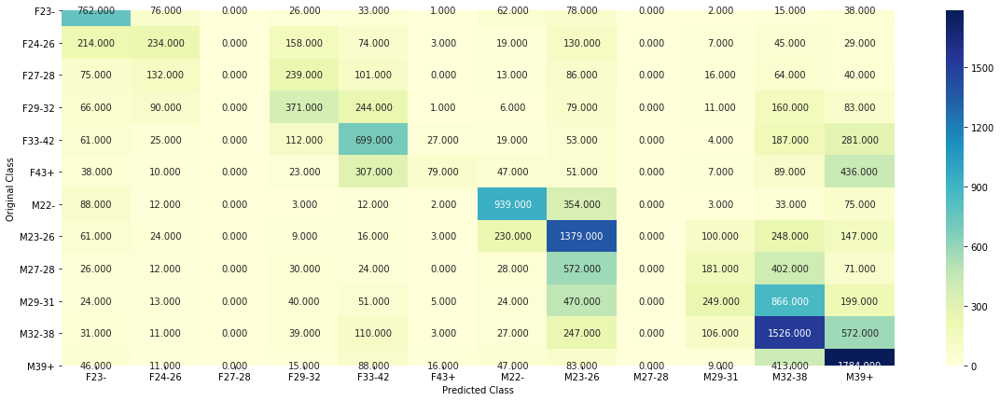

-------------------- Precision matrix (Columm Sum=1) --------------------


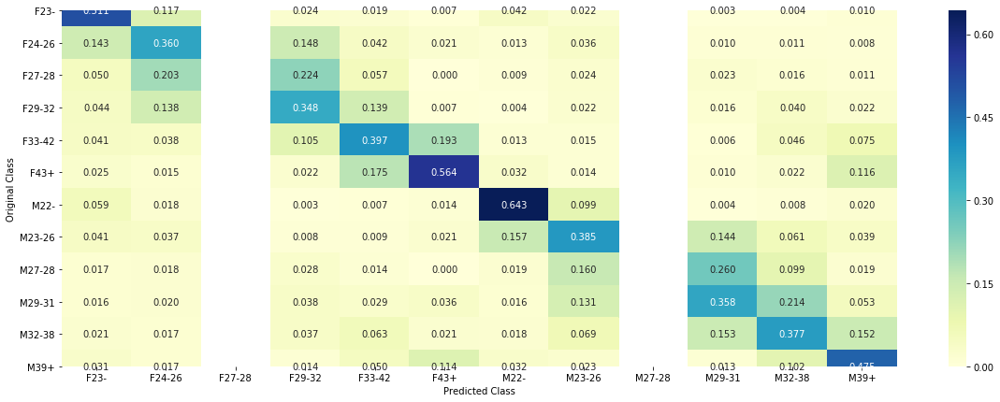

-------------------- Recall matrix (Row sum=1) --------------------


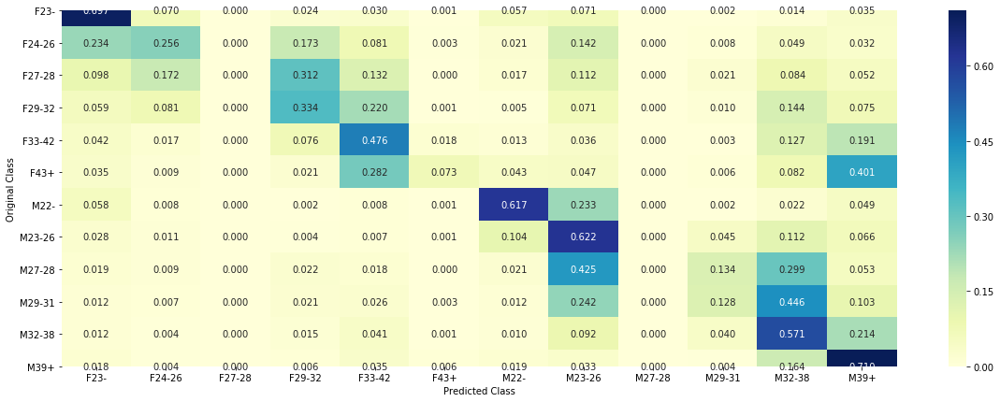

In [142]:
print("Train Average Log-Loss: ",log_loss(Y_events_train, train_pred_avg_events_2))
events_nn_2_avg_train_predicted_classes=np.argmax(train_pred_avg_events_2, axis=1)
plot_confusion_matrix(Y_events_train,events_nn_2_avg_train_predicted_classes)

##### CV Prediction and Confusion Matrix

In [143]:
cv_pred_avg_events_2=np.zeros((X_events_cv.shape[0],12))

In [144]:
#taing average of all the model predictions
for i in range(len(model_3)):
    cv_pred=model_3[i].predict_proba(X_events_cv)
    cv_pred_avg_events_2+=cv_pred
cv_pred_avg_events_2/=len(model_3)

CV Average Log-Loss:  1.8996915747356988
-------------------- Confusion matrix --------------------


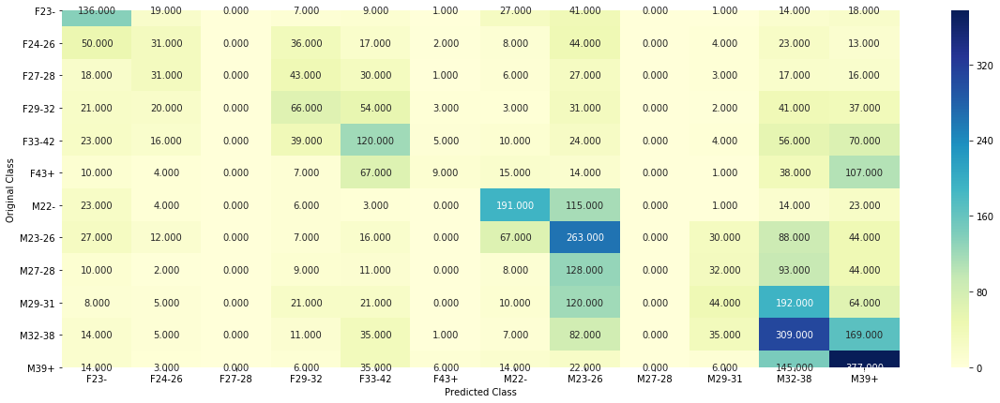

-------------------- Precision matrix (Columm Sum=1) --------------------


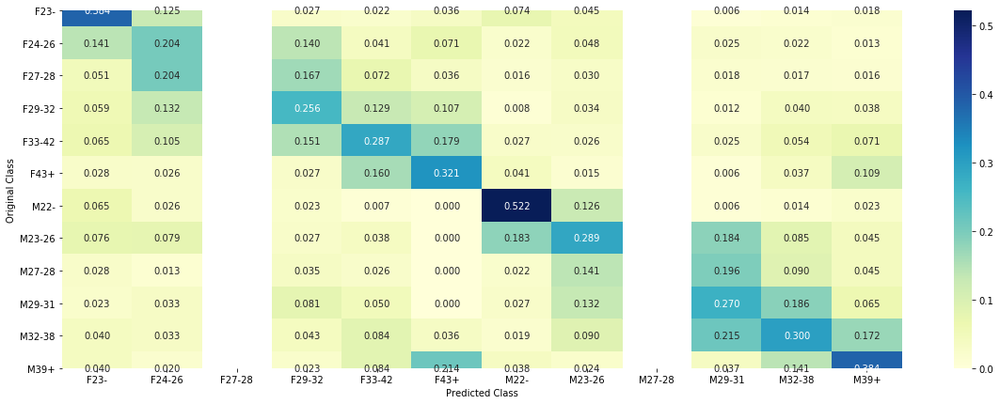

-------------------- Recall matrix (Row sum=1) --------------------


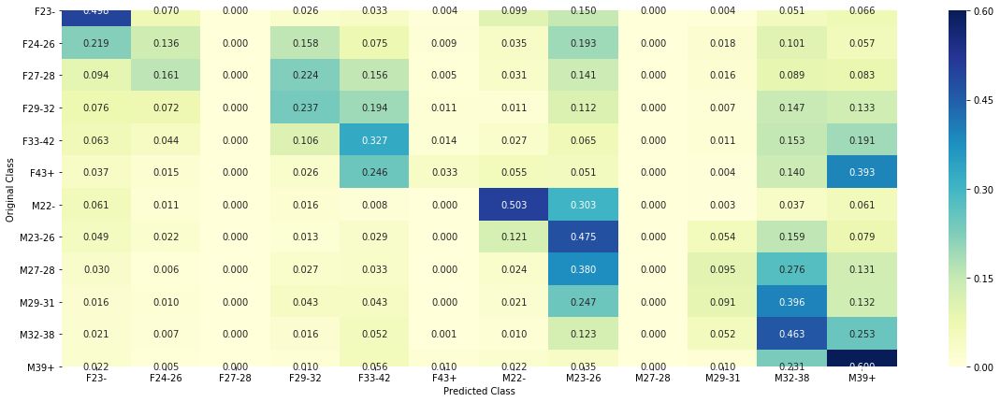

In [145]:
print("CV Average Log-Loss: ",log_loss(Y_events_cv, cv_pred_avg_events_2))
events_nn_2_avg_cv_predicted_classes=np.argmax(cv_pred_avg_events_2, axis=1)
plot_confusion_matrix(Y_events_cv,events_nn_2_avg_cv_predicted_classes)

##### Test Prediction

In [146]:
test_pred_avg_events_2=np.zeros((X_events_test.shape[0],12))
for i in range(len(model_3)):
    test_pred=model_3[i].predict_proba(X_events_test.tocsr())
    test_pred_avg_events_2+=test_pred
test_pred_avg_events_2/=len(model_3)

## 6. Predictions

### 6.1. KNN

In [311]:
predictions_knn = pd.concat([prediction_no_events_knn,prediction_events_knn],axis=0)
predictions_knn.to_csv('Predictions/result_knn.csv')

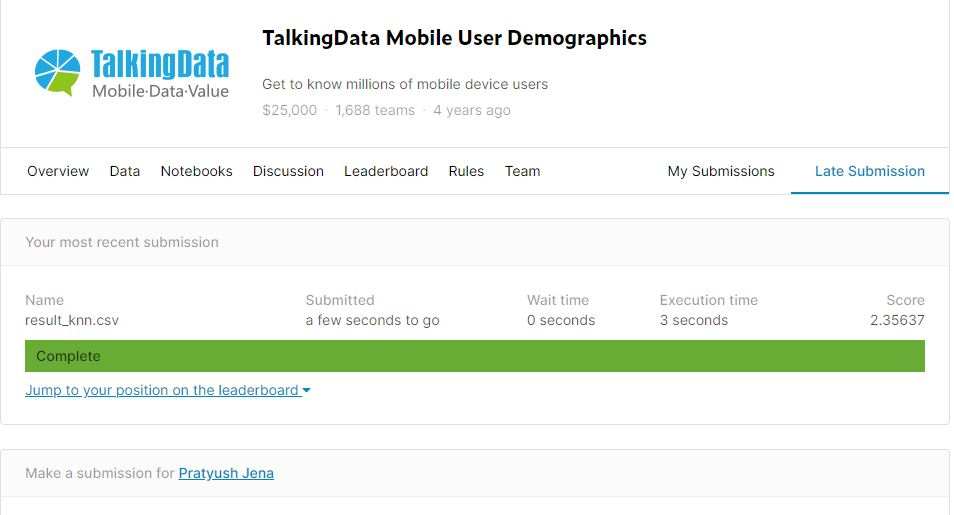

In [315]:
Image('Pred/knn.jpg')

### 6.2. SVM

In [316]:
predictions_svm = pd.concat([prediction_no_events_svm,prediction_events_svm],axis=0)
predictions_svm.to_csv('Predictions/result_svm.csv')

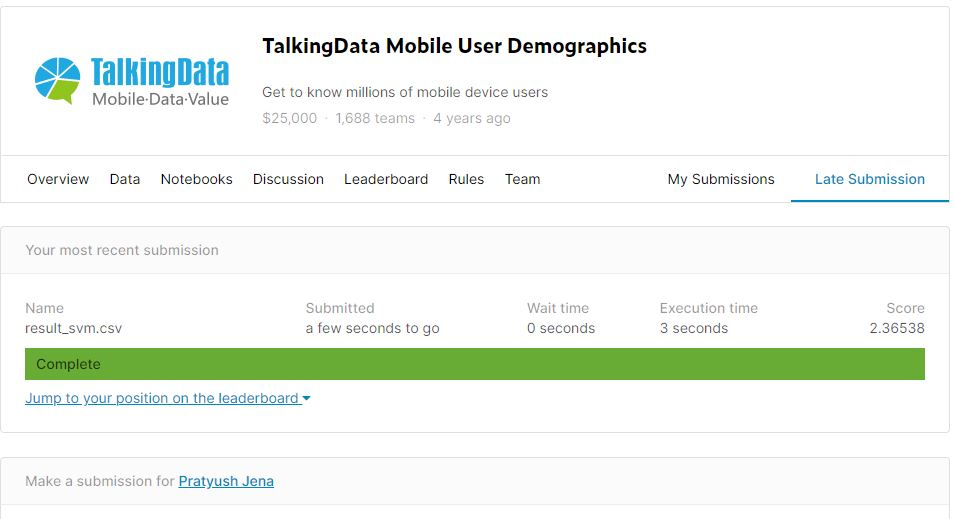

In [317]:
Image('Pred/svm.jpg')

### 6.3. Logistic Regression

In [318]:
predictions_log_reg = pd.concat([prediction_no_events_log_reg,prediction_events_log_reg],axis=0)
predictions_log_reg.to_csv('Predictions/result_log_reg.csv')

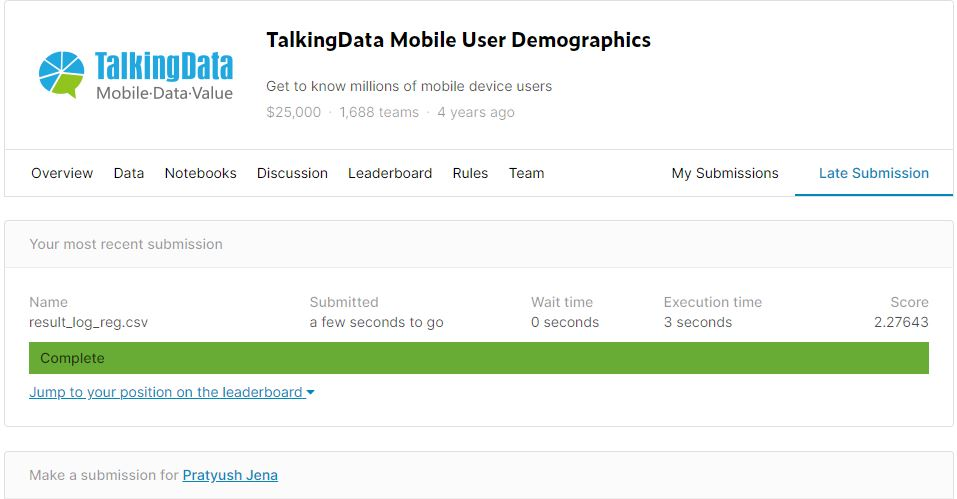

In [319]:
Image('Pred/log_reg.jpg')

### 6.4. XGBoost

In [321]:
predictions_xgb = pd.concat([prediction_no_events_xgb,prediction_events_xgb],axis=0)
predictions_xgb.to_csv('Predictions/result_xgb.csv')

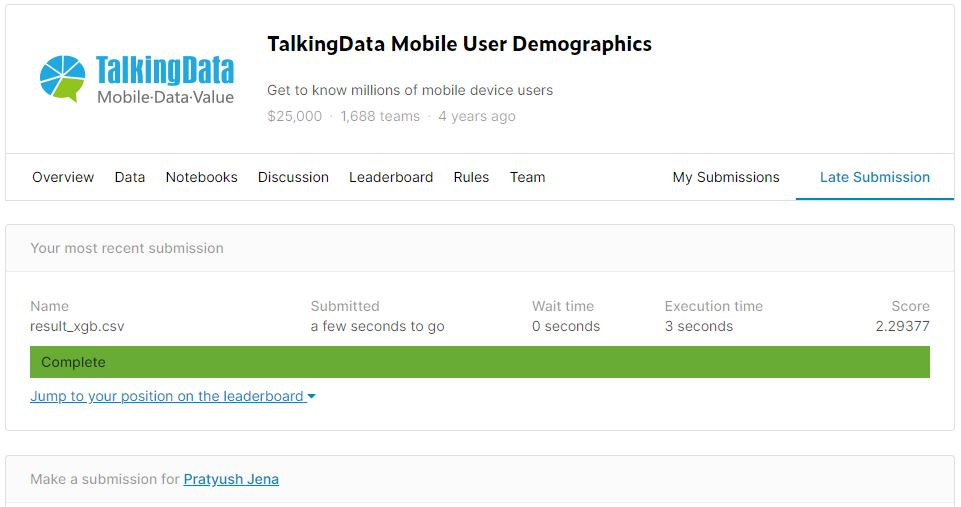

In [322]:
Image('Pred/xgb.jpg')

### 6.5. Random Forest

In [323]:
predictions_rf = pd.concat([prediction_no_events_rf,prediction_events_rf],axis=0)
predictions_rf.to_csv('Predictions/result_rf.csv')

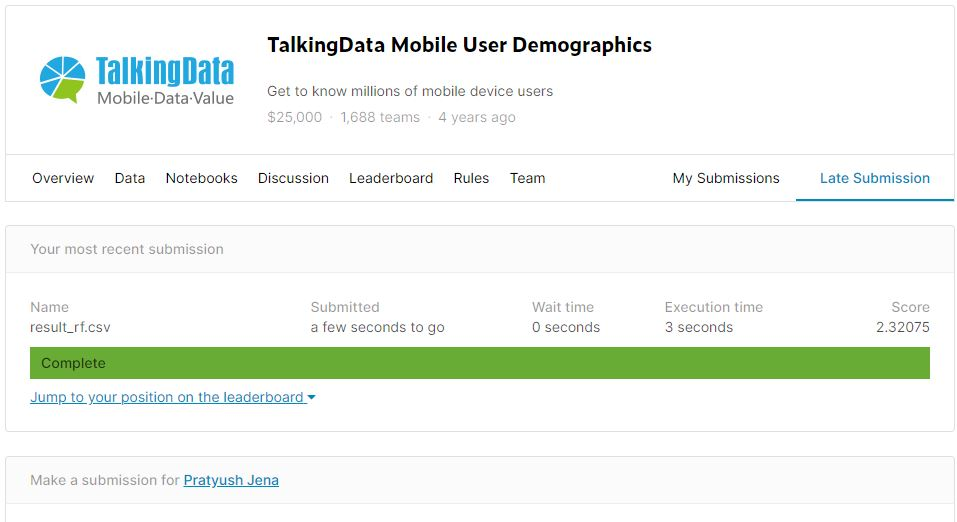

In [324]:
Image('Pred/rf.jpg')

### 6.6. Decision Tree

In [325]:
predictions_rf = pd.concat([prediction_no_events_dt,prediction_events_dt],axis=0)
predictions_rf.to_csv('Predictions/result_dt.csv')

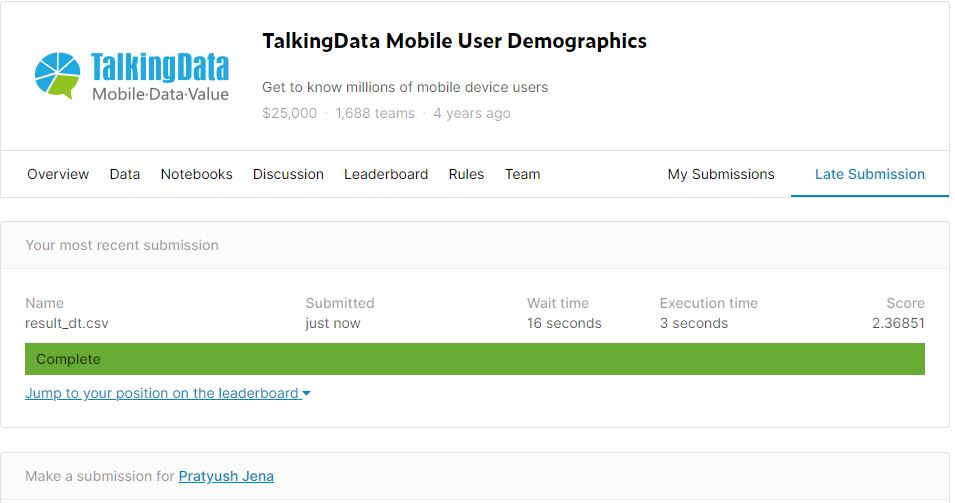

In [327]:
Image('Pred/dt.jpg')

### 6.7. Stacking Logistic regression with Neural Networks
From the above 6 model we can see that logistic regression gives the best result after predicting the age groups for test data with a log loss of 2.27643.

In the kaggle competition, there are total number of 1668 submissions. So in order to get a rank within first 10 percent we need to score a rank less than 168 and a log loss less than 2.24006 in private leadership board and a log loss less than 2.23592 in public leader ship board.

#### Private Leadership Board

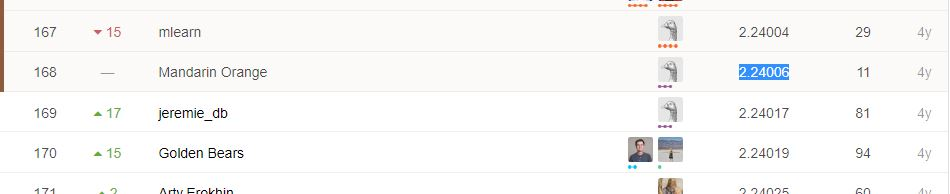

In [164]:
Image('Pred/private.jpg')

#### Public Leadership Board

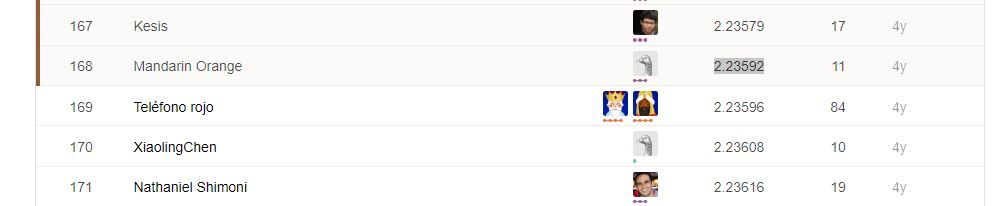

In [165]:
Image('Pred/public.jpg')

So to achieve a rank within 10 percent of the competition we will use stacking model.<br/>
Here we will stack logistic regression which has the best result in the above 6 models with neural network model that we have trained on our data.
For stacking we will use average weight concept.
We will multiply some weights to each of our predicted result and these in total should sum to one.
In simple words we are just giving weightage or priorirtizing the models which have minimum log loss.

In [156]:
#Weights for both the having evenst and no events predictions
w_no_events_lr=0.15
w_no_events_nn_1=0.75
w_no_events_nn_2=0.1
w_events_lr=0.45
w_events_nn_1=0.45
w_events_nn_2=0.1

In [157]:
#Adding the predictions after multipying it by weights
pred_no_events=(w_no_events_lr*y_no_events_pred_logistic_regression)+(w_no_events_nn_1*test_pred_avg_no_events_1)+(w_no_events_nn_2*test_pred_avg_no_events_2)
pred_events=(w_events_lr*test_pred_avg_events_1)+(w_events_nn_1*test_pred_avg_events_2)+(w_events_nn_2*y_events_pred_logistic_regression)

In [159]:
#Converting the predictions to dataset
pred_1 = pd.DataFrame(pred_no_events, index = no_events_data_test.index,columns=targetencoder.classes_)
pred_2 = pd.DataFrame(pred_events, index = having_events_data_test.index,columns=targetencoder.classes_)

In [162]:
#Concaneting the predicted data sets both for having events and no events
result=pd.concat([pred_1,pred_2], axis=0)

In [163]:
#Generating the result
result.to_csv("result.csv")

##### Final Result in Kaggle

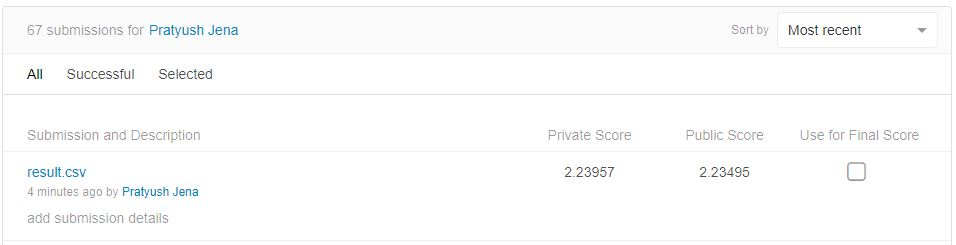

In [167]:
Image('Pred/result.jpg')

##### Observation
After submitting the result.csv in the kaggle competition I am getting the following results:<br/>

In [168]:
# Please compare all your models using Prettytable library
from prettytable import PrettyTable
x = PrettyTable()

In [169]:
x.field_names = ["Leadership Board", "Rank","Loss"]
x.add_row(["Public", 154,2.23495])
x.add_row(["Private", 159,2.23975])

In [170]:
print(x)

+------------------+------+---------+
| Leadership Board | Rank |   Loss  |
+------------------+------+---------+
|      Public      | 154  | 2.23495 |
|     Private      | 159  | 2.23975 |
+------------------+------+---------+


## 7. Conclusion

In [173]:
# Please compare all your models using Prettytable library
x = PrettyTable()

In [174]:
x.field_names = ["Feature Name", "Log Loss"]
x.add_row(["KNN", 2.35637])
x.add_row(["SVM", 2.36538])
x.add_row(["Logistic Regression", 2.27643])
x.add_row(["XGBoost", 2.29377])
x.add_row(["Random Forest", 2.32075])
x.add_row(["Decision Tree", 2.36851])
x.add_row(["Stacking Model",2.23495])

In [175]:
print(x)

+---------------------+----------+
|     Feature Name    | Log Loss |
+---------------------+----------+
|         KNN         | 2.35637  |
|         SVM         | 2.36538  |
| Logistic Regression | 2.27643  |
|       XGBoost       | 2.29377  |
|    Random Forest    | 2.32075  |
|    Decision Tree    | 2.36851  |
|    Stacking Model   | 2.23495  |
+---------------------+----------+


We can see that stacking model of Logistic regression and neural network gives the best result for above data set with minimum loss of  2.23495 on predicting the age group for the test data given.<brr/>
And hence we are able to get top 10% rank in the kaggle competition.